In [1]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
os.chdir('/content/drive/MyDrive/나/deeplearning')

## 01. 데이터 확인 및 전처리

### API를 통해 기상청 데이터 불러오기

#### api 연결 및 전체 출력

In [ ]:
import requests

# The URL provided by the API creator
domain = 'https://apihub.kma.go.kr/api/typ01/url/kma_sfctm3.php?'
tm1 = 'tm1=201901010000&'
tm2 = 'tm2=202401010000&'
stn_id = 'stn=108&'
help = 'help=1&'
auth = 'authKey=-9IQCdUWT9ySEAnVFs_c4Q'

api_url = domain + tm1 + tm2 + stn_id + help + auth

# API 요청 보내기
response = requests.get(api_url)

# 응답 상태 확인
if response.status_code == 200:
    try:
        # JSON 형식으로 데이터 파싱 시도
        data = response.json()

        # 필요한 변수들만 추출
        variables = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_TOT', 'CA_MID', 'TS', 'RN']
        extracted_data = []

        for record in data:
            extracted_record = {var: record.get(var, None) for var in variables}
            extracted_data.append(extracted_record)

        # 출력 (예시: 첫 번째 레코드)
        print(extracted_data[0])

        # row 수 확인
        row_count = len(extracted_data)
        print(f"Total rows: {row_count}")

        # 결과를 CSV로 저장
        import csv
        with open('extracted_data.csv', 'w', newline='') as csvfile:
            writer = csv.DictWriter(csvfile, fieldnames=variables)
            writer.writeheader()
            writer.writerows(extracted_data)

    except requests.exceptions.JSONDecodeError:
        # JSONDecodeError가 발생하면 응답 내용을 출력
        print("Failed to decode JSON. Response content:")
        print(response.text)
else:
    print(f"Error: {response.status_code}")

Failed to decode JSON. Response content:
#START7777
#--------------------------------------------------------------------------------------------------
#  기상청 지상관측 시간자료 [입력인수형태][예] ?tm=201007151200&stn=0&help=1
#--------------------------------------------------------------------------------------------------
#  1. TM     : 관측시각 (KST)
#  2. STN    : 국내 지점번호
#  3. WD     : 풍향 (16방위)
#  4. WS     : 풍속 (m/s)
#  5. GST_WD : 돌풍향 (16방위)
#  6. GST_WS : 돌풍속 (m/s)
#  7. GST_TM : 돌풍속이 관측된 시각 (시분)
#  8. PA     : 현지기압 (hPa)
#  9. PS     : 해면기압 (hPa)
# 10. PT     : 기압변화경향 (Code 0200) 
# 11. PR     : 기압변화량 (hPa)
# 12. TA     : 기온 (C)
# 13. TD     : 이슬점온도 (C)
# 14. HM     : 상대습도 (%)
# 15. PV     : 수증기압 (hPa)
# 16. RN     : 강수량 (mm) : 여름철에는 1시간강수량, 겨울철에는 3시간강수량
# 17. RN_DAY : 일강수량 (mm) : 해당시간까지 관측된 양(통계표)
# 18. RN_JUN : 일강수량 (mm) : 해당시간까지 관측된 양을 전문으로 입력한 값(전문)
# 19. RN_INT : 강수강도 (mm/h) : 관측하는 곳이 별로 없음
# 20. SD_HR3 : 3시간 신적설 (cm) : 3시간 동안 내린 신적설의 높이
# 21. SD_DAY : 일 신적설 (cm) : 00시00분부터 위 관측시간까지 내린 신적설

#### 특정 기간 api로 출력 및 csv로 저장

In [ ]:
import requests
import re
import pandas as pd
import asyncio
import aiohttp
from datetime import datetime, timedelta

# API 요청 URL 기본 구성
domain = 'https://apihub.kma.go.kr/api/typ01/url/kma_sfctm3.php?'
stn_id = 'stn=108&'
help_param = 'help=1&'
auth = 'authKey=-9IQCdUWT9ySEAnVFs_c4Q'

# 시작일과 종료일 설정 (매일 데이터를 요청하기 위해)
start_date = datetime(2019, 1, 1)
end_date = datetime(2024, 1, 1)

# 데이터 저장용 리스트
all_extracted_data = []

# 비동기 요청 함수
async def fetch_data(session, tm1, tm2):
    api_url = f"{domain}tm1={tm1}&tm2={tm2}&{stn_id}{help_param}{auth}"
    async with session.get(api_url) as response:
        if response.status == 200:
            raw_data = await response.text()
            data_lines = [line for line in raw_data.splitlines() if re.match(r'^\d+', line)]
            return data_lines
        else:
            print(f"Error: {response.status}")

async def main():
    async with aiohttp.ClientSession() as session:
        current_date = start_date
        tasks = []

        while current_date < end_date:
            next_date = current_date + timedelta(days=1)  # 1일 간격으로 요청

            tm1 = current_date.strftime("%Y%m%d%H%M")
            tm2 = next_date.strftime("%Y%m%d%H%M")

            tasks.append(fetch_data(session, tm1, tm2))
            current_date = next_date

        results = await asyncio.gather(*tasks)

        for data_lines in results:
            if data_lines:
                for line in data_lines:
                    fields = re.split(r'\s+', line.strip())
                    all_extracted_data.append({
                        "TM": fields[0],
                        "TA": fields[11],
                        "WS": fields[3],
                        "HM": fields[13],
                        "PV": fields[14],
                        "TD": fields[12],
                        "PA": fields[7],
                        "CA_TOT": fields[24],
                        "CA_MID": fields[25],
                        "TS": fields[26],
                        "RN": fields[15]
                    })

# 비동기 작업 실행
await main()

# DataFrame으로 변환
df = pd.DataFrame(all_extracted_data)

# 데이터 요약 출력
print(f"Extracted {len(df)} rows.")
print(df.head())

# CSV로 저장
df.to_csv('extracted_weather_data.csv', index=False)

Error: 502
Error: 502
Extracted 45580 rows.
             TM    TA   WS    HM   PV     TD      PA CA_TOT CA_MID TS    RN
0  201901010000  -5.5  1.0  54.0  2.2  -13.3  1024.1      -      0  0  -9.0
1  201901010100  -5.9  1.8  56.0  2.2  -13.2  1024.0      -      0  0  -9.0
2  201901010200  -6.5  1.2  60.0  2.3  -12.9  1024.2      -      0  0  -9.0
3  201901010300  -6.9  2.2  62.0  2.3  -12.9  1024.3      -      1  0  -9.0
4  201901010400  -7.2  1.2  57.0  2.0  -14.2  1023.9      -      3  0  -9.0


In [ ]:
import requests
import re
import pandas as pd
import asyncio
import aiohttp
from datetime import datetime, timedelta

# API 요청 URL 기본 구성
domain = 'https://apihub.kma.go.kr/api/typ01/url/kma_sfctm3.php?'
stn_id = 'stn=108&'
help_param = 'help=1&'
auth = 'authKey=-9IQCdUWT9ySEAnVFs_c4Q'

# 시작일과 종료일 설정 (매일 데이터를 요청하기 위해)
start_date = datetime(2024, 1, 1)
end_date = datetime(2024, 9, 1)

# 데이터 저장용 리스트
all_extracted_data = []

# 비동기 요청 함수
async def fetch_data(session, tm1, tm2):
    api_url = f"{domain}tm1={tm1}&tm2={tm2}&{stn_id}{help_param}{auth}"
    async with session.get(api_url) as response:
        if response.status == 200:
            raw_data = await response.text()
            data_lines = [line for line in raw_data.splitlines() if re.match(r'^\d+', line)]
            return data_lines
        else:
            print(f"Error: {response.status}")

async def main():
    async with aiohttp.ClientSession() as session:
        current_date = start_date
        tasks = []

        while current_date < end_date:
            next_date = current_date + timedelta(days=1)  # 1일 간격으로 요청

            tm1 = current_date.strftime("%Y%m%d%H%M")
            tm2 = next_date.strftime("%Y%m%d%H%M")

            tasks.append(fetch_data(session, tm1, tm2))
            current_date = next_date

        results = await asyncio.gather(*tasks)

        for data_lines in results:
            if data_lines:
                for line in data_lines:
                    fields = re.split(r'\s+', line.strip())
                    all_extracted_data.append({
                        "TM": fields[0],
                        "TA": fields[11],
                        "WS": fields[3],
                        "HM": fields[13],
                        "PV": fields[14],
                        "TD": fields[12],
                        "PA": fields[7],
                        "CA_TOT": fields[24],
                        "CA_MID": fields[25],
                        "TS": fields[26],
                        "RN": fields[15]
                    })

# 비동기 작업 실행
await main()

# DataFrame으로 변환
df = pd.DataFrame(all_extracted_data)

# 데이터 요약 출력
print(f"Extracted {len(df)} rows.")
print(df.head())

# CSV로 저장
df.to_csv('extracted_weather_data_108_0.csv', index=False)

Extracted 6081 rows.
             TM    TA   WS    HM   PV    TD      PA CA_TOT CA_MID TS    RN
0  202401010000   0.6  1.9  97.0  6.2   0.1  1015.4     19      0  0  -9.0
1  202401010100   0.5  2.2  97.0  6.1   0.0  1015.6     19      0  0  -9.0
2  202401010200   0.4  0.4  98.0  6.2   0.1  1016.2     19      6  2  -9.0
3  202401010300  -0.1  1.7  98.0  6.0  -0.3  1016.6     19      1  1  -9.0
4  202401010400  -0.2  2.2  98.0  5.9  -0.4  1016.8     19      6  6  -9.0


#### 여러 csv 파일 합치기

In [ ]:
import pandas as pd

# 이어 붙일 CSV 파일 목록
csv_files = ['./extracted_weather_data_108_0.csv', './extracted_weather_data_108_5.csv']

# 모든 CSV 파일을 읽어들여 하나의 리스트에 저장
dataframes = [pd.read_csv(file) for file in csv_files]

# 데이터프레임을 하나로 결합
combined_df = pd.concat(dataframes, ignore_index=True)

# 결합된 데이터를 새로운 CSV 파일로 저장
combined_df.to_csv('extracted_weather_data_108.csv', index=False)

print("CSV 파일을 성공적으로 결합했습니다.")

CSV 파일을 성공적으로 결합했습니다.


In [ ]:
import pandas as pd

# 이어 붙일 CSV 파일 목록
csv_files = ['./extracted_weather_data_112_0.csv', './extracted_weather_data_112_1.csv', './extracted_weather_data_112_2.csv'
             , './extracted_weather_data_112_3.csv', './extracted_weather_data_112_4.csv', './extracted_weather_data_112_5.csv']

# 모든 CSV 파일을 읽어들여 하나의 리스트에 저장
dataframes = [pd.read_csv(file) for file in csv_files]

# 데이터프레임을 하나로 결합
combined_df = pd.concat(dataframes, ignore_index=True)

# 결합된 데이터를 새로운 CSV 파일로 저장
combined_df.to_csv('extracted_weather_data_112.csv', index=False)

print("CSV 파일을 성공적으로 결합했습니다.")

CSV 파일을 성공적으로 결합했습니다.


### 데이터 확인

#### 서울

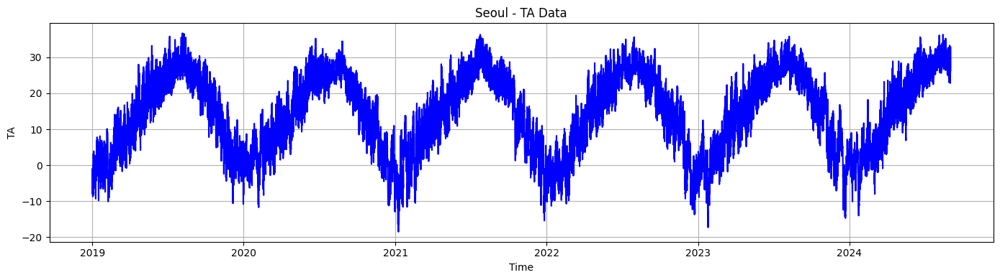

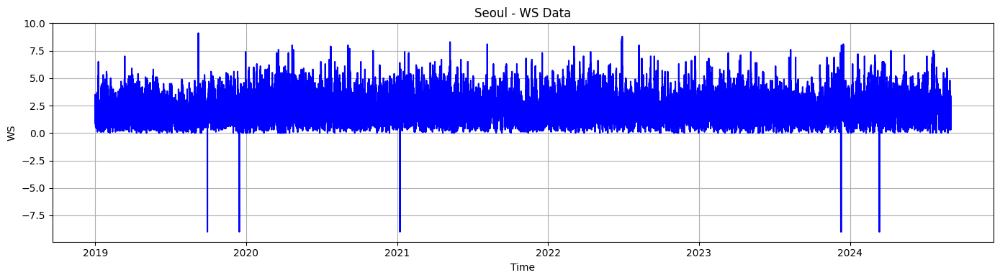

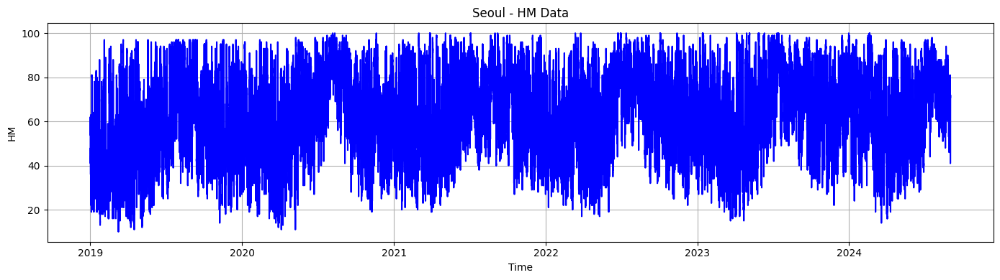

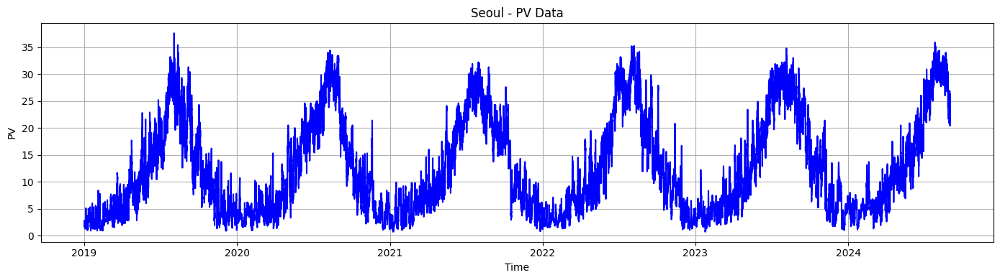

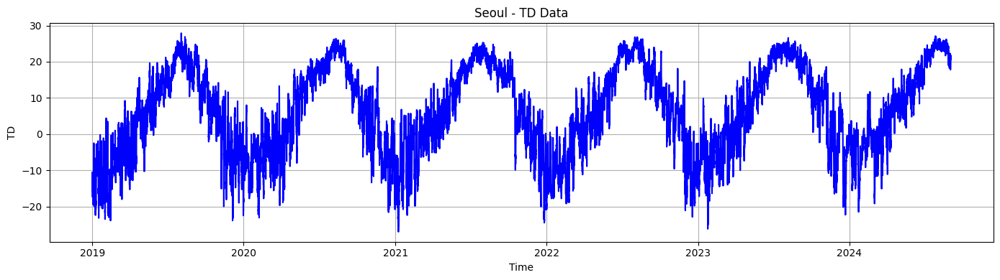

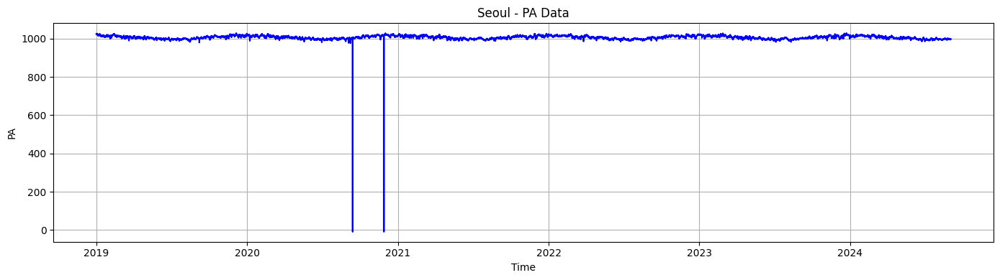

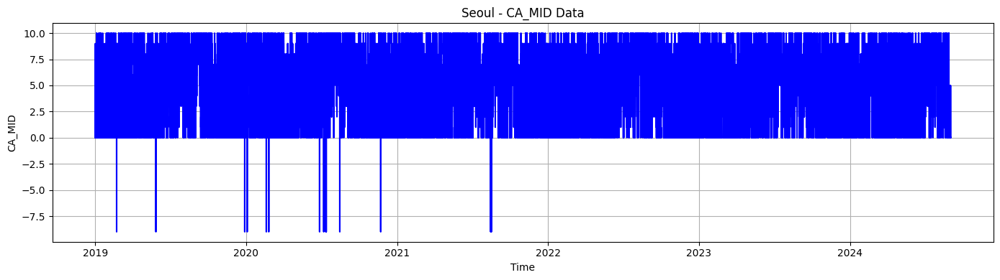

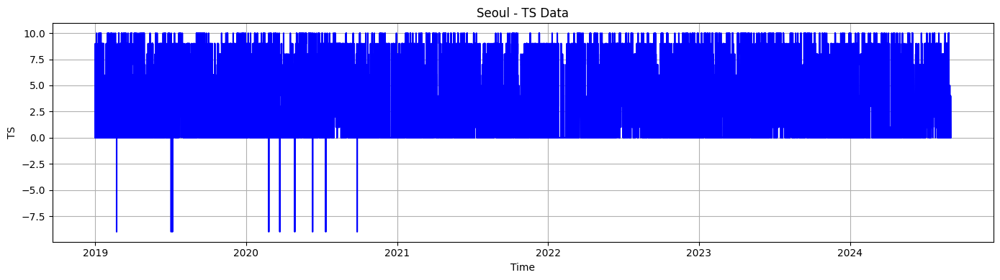

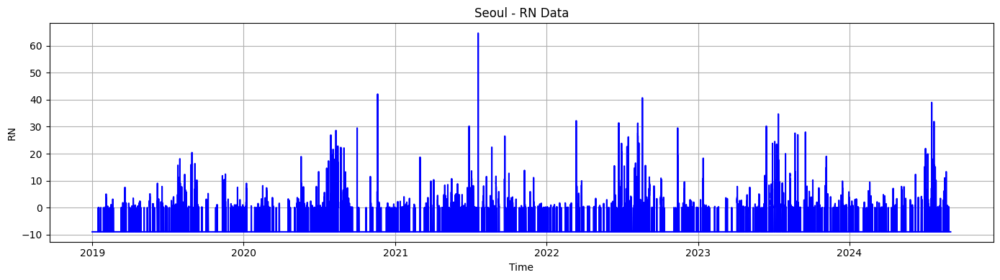

In [ ]:
# 데이터 읽기
df = pd.read_csv('./data/df_108_filled.csv')
features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'TS', 'RN']  # 기상 변수
df['TM'] = pd.to_datetime(df['TM'], format='%Y%m%d%H%M')
# 2023년 데이터 필터링
# df = df[df['TM'].dt.year == 2023]

# 각 피처에 대한 시각화를 개별적으로 수행
for col in features:
    plt.figure(figsize=(14, 4))

    # 원본 데이터 시각화
    plt.plot(df['TM'], df[col], label=f'{col}', color='blue')
    plt.title(f'Seoul - {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col}')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

#### 동두천

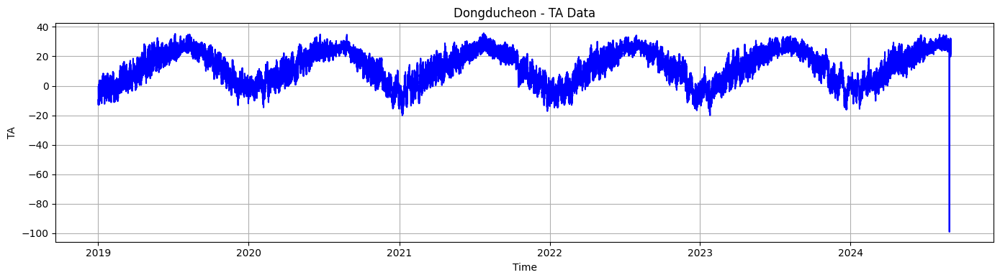

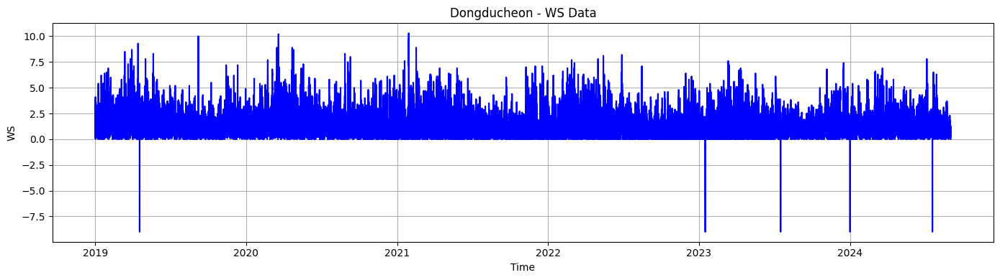

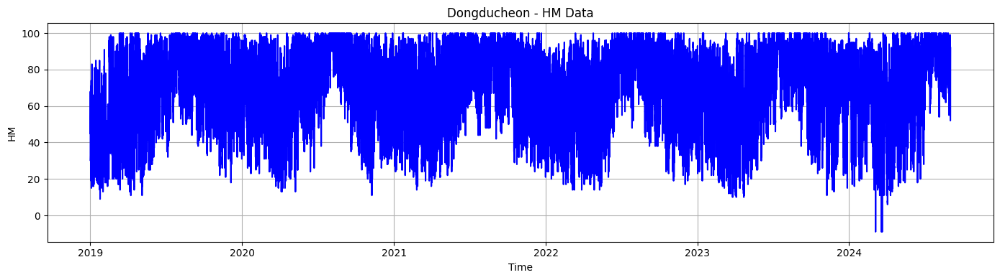

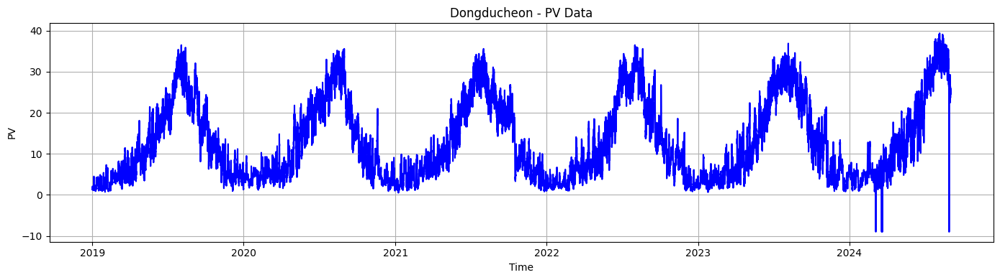

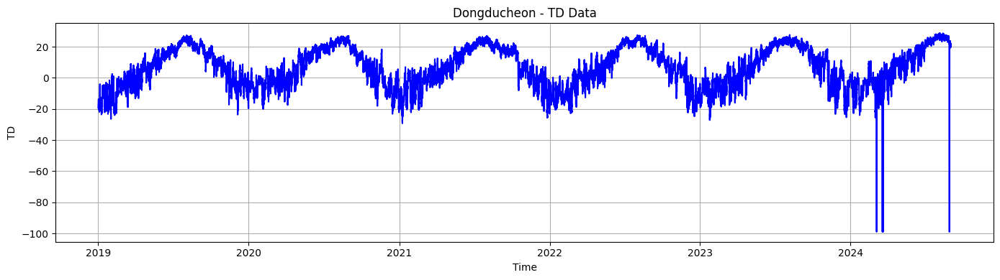

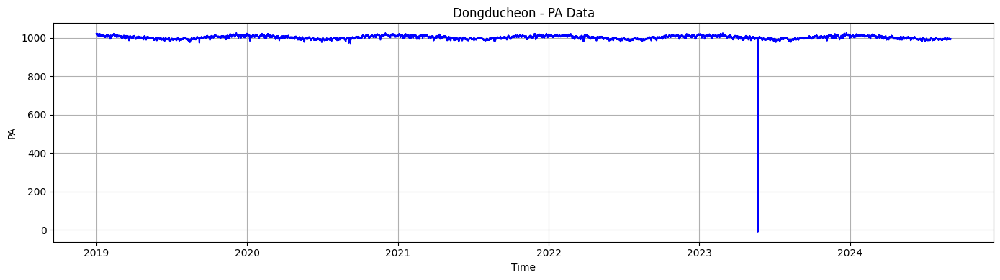

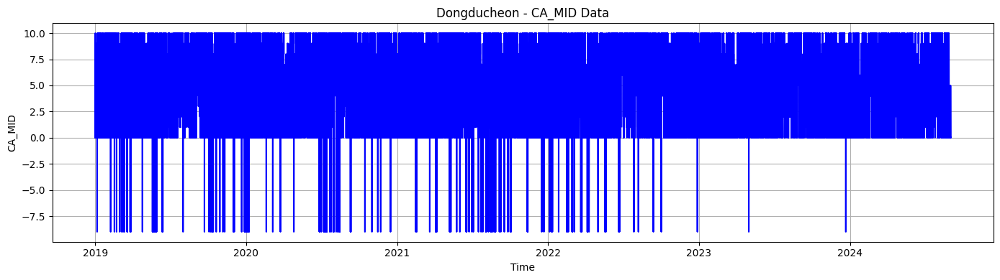

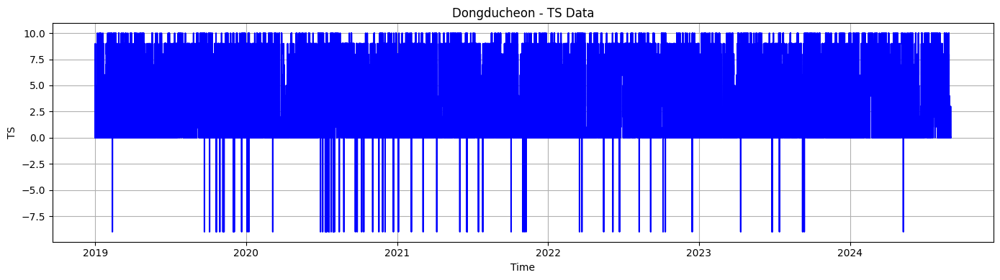

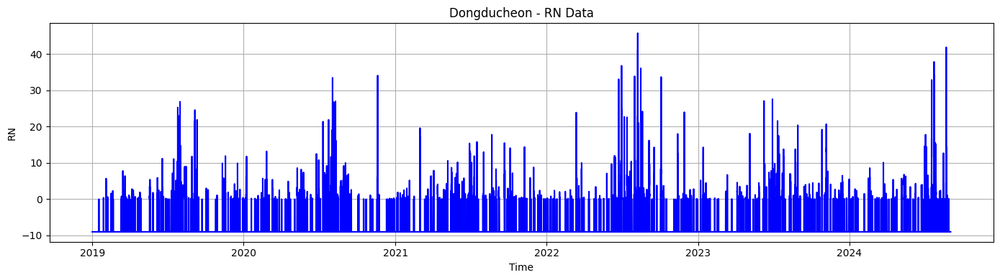

In [ ]:
# 데이터 읽기
df = pd.read_csv('./data/df_98_filled.csv')
features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'TS', 'RN']  # 기상 변수
df['TM'] = pd.to_datetime(df['TM'], format='%Y%m%d%H%M')
# 2023년 데이터 필터링
# df = df[df['TM'].dt.year == 2023]

# 각 피처에 대한 시각화를 개별적으로 수행
for col in features:
    plt.figure(figsize=(14, 4))

    # 원본 데이터 시각화
    plt.plot(df['TM'], df[col], label=f'{col}', color='blue')
    plt.title(f'Dongducheon - {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col}')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

#### 인천

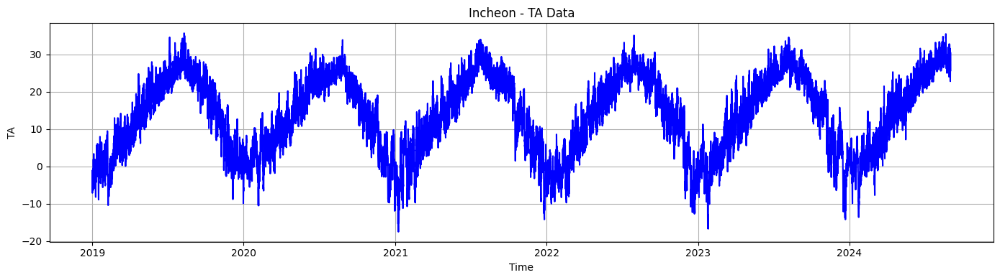

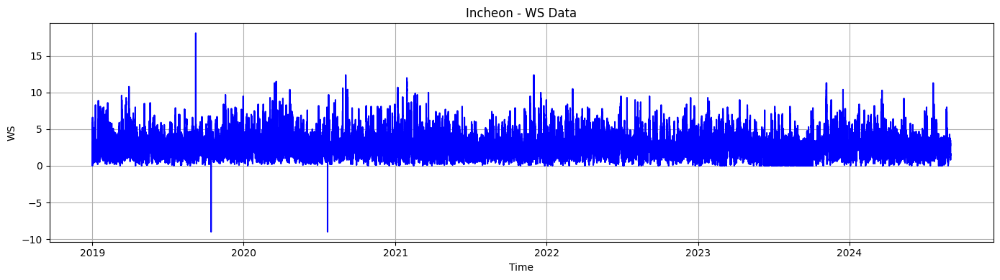

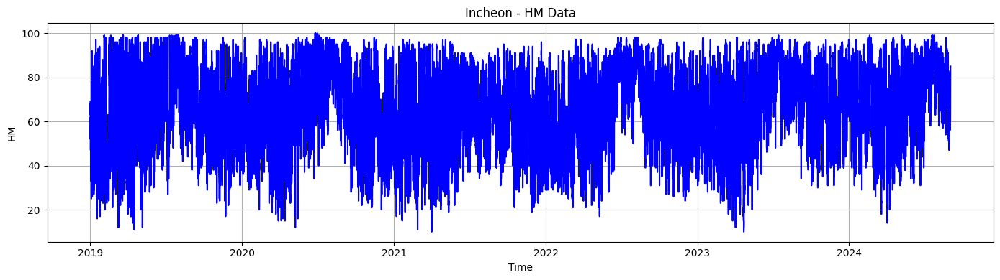

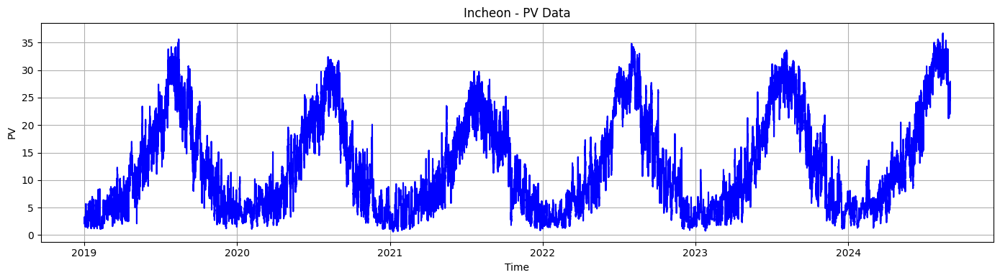

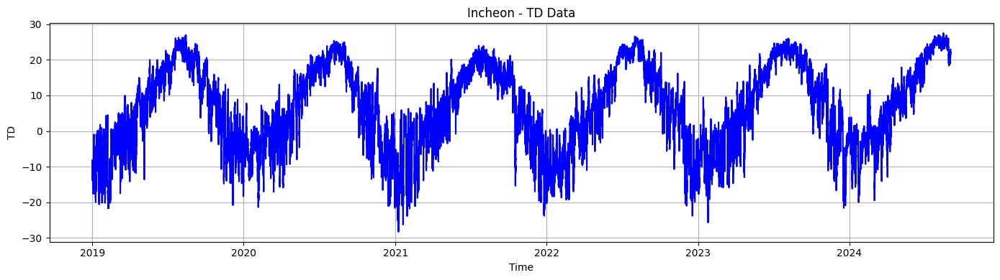

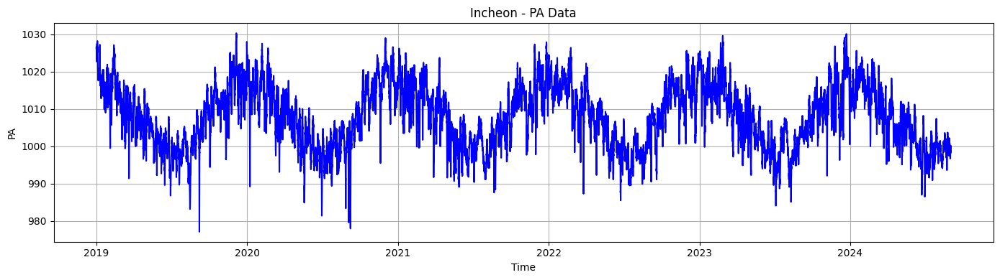

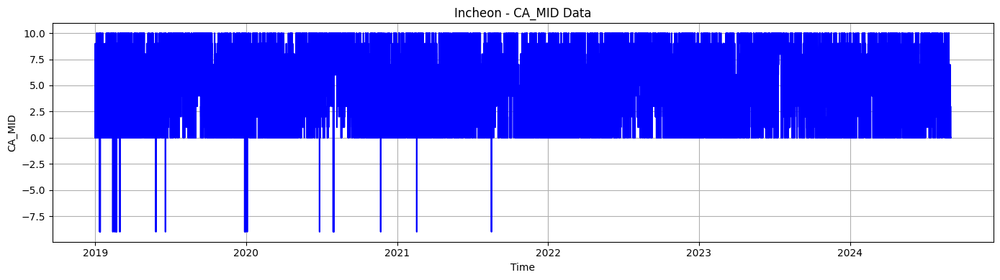

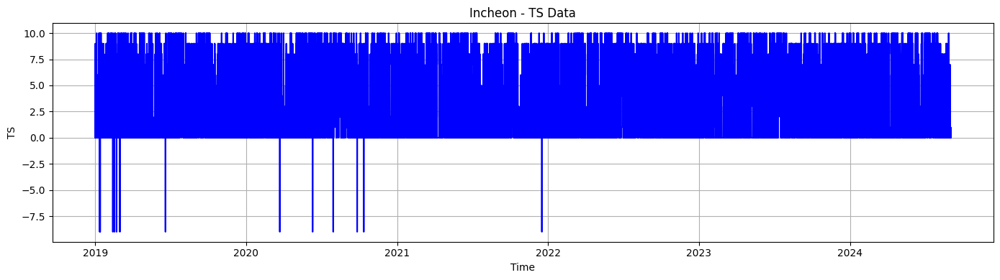

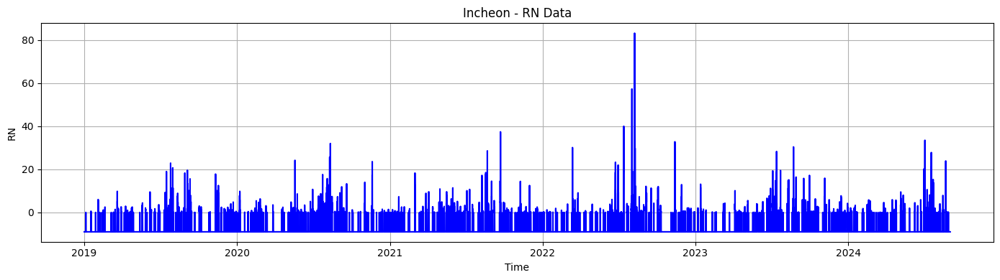

In [ ]:
# 데이터 읽기
df = pd.read_csv('./data/df_112_filled.csv')
features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'TS', 'RN']  # 기상 변수
df['TM'] = pd.to_datetime(df['TM'], format='%Y%m%d%H%M')
# 2023년 데이터 필터링
# df = df[df['TM'].dt.year == 2023]

# 각 피처에 대한 시각화를 개별적으로 수행
for col in features:
    plt.figure(figsize=(14, 4))

    # 원본 데이터 시각화
    plt.plot(df['TM'], df[col], label=f'{col}', color='blue')
    plt.title(f'Incheon - {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col}')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

#### 수원

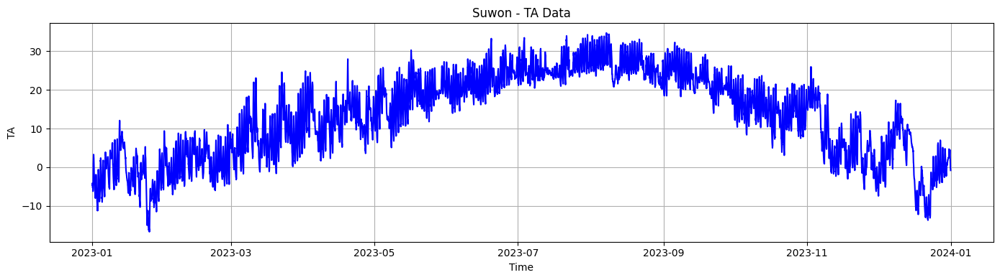

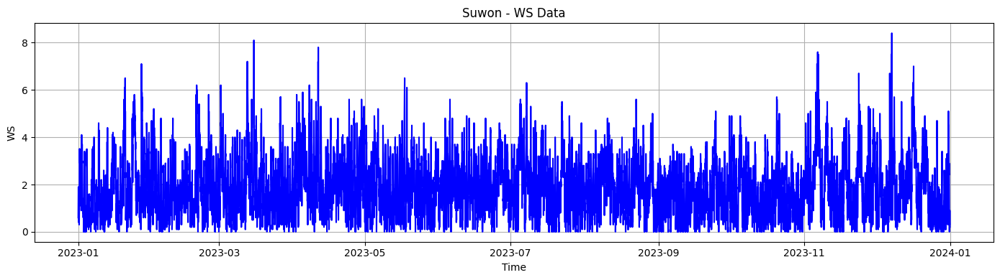

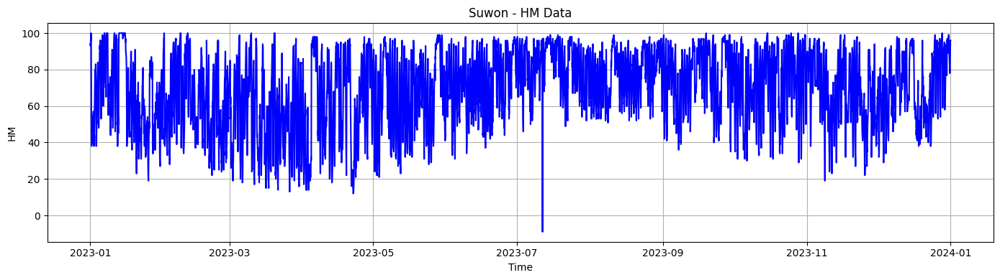

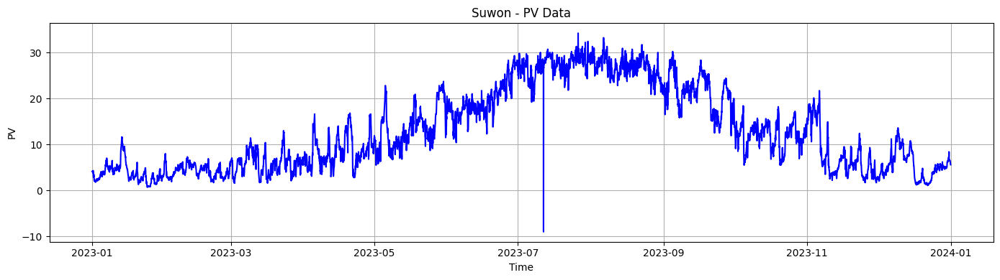

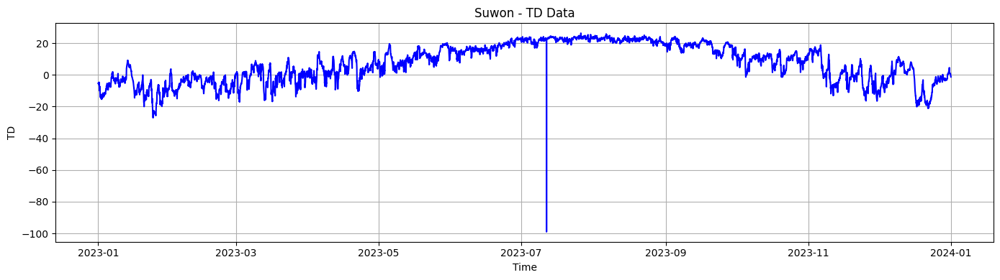

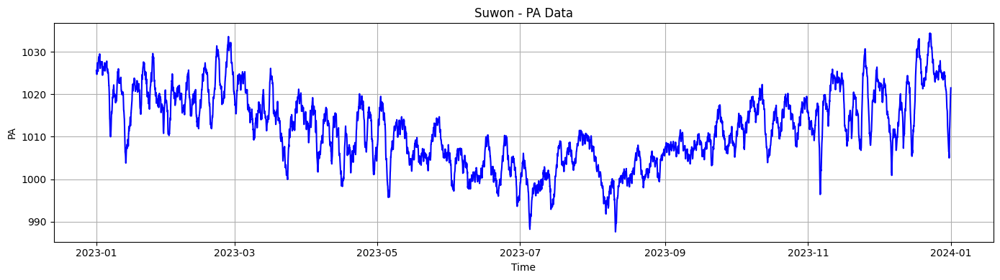

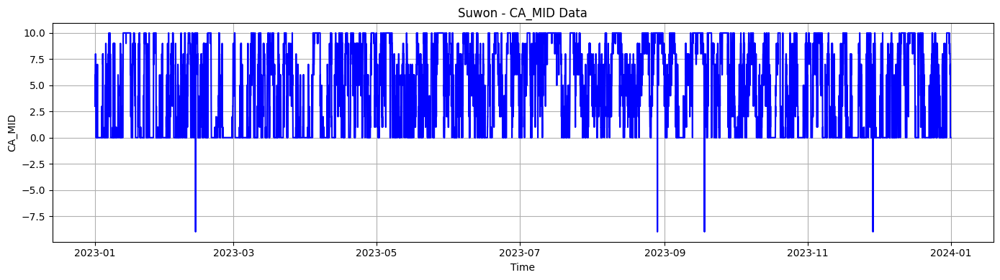

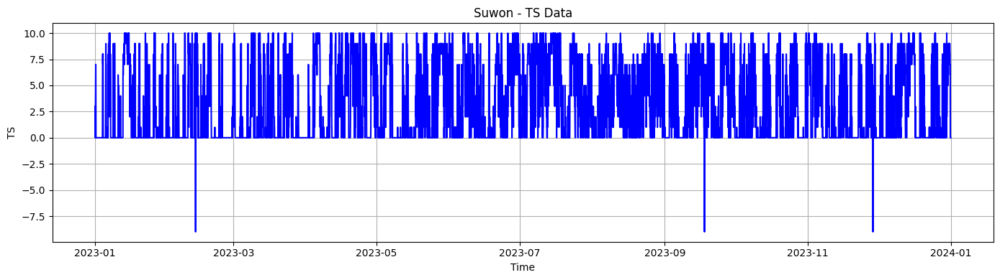

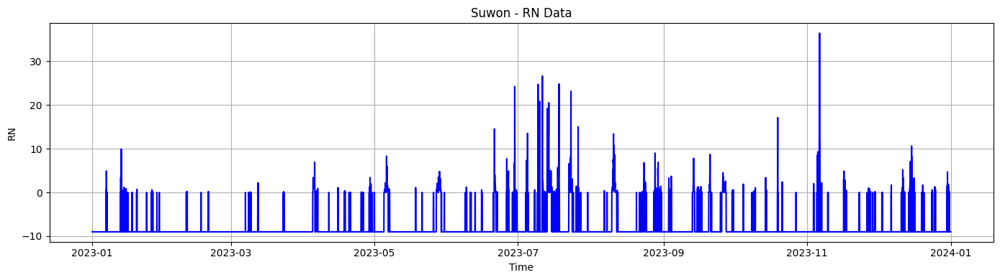

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 데이터 읽기
df = pd.read_csv('./data/df_119_filled.csv')
features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'TS', 'RN']  # 기상 변수
df['TM'] = pd.to_datetime(df['TM'], format='%Y%m%d%H%M')
# 2023년 데이터 필터링
df = df[df['TM'].dt.year == 2023]

# 각 피처에 대한 시각화를 개별적으로 수행
for col in features:
    plt.figure(figsize=(14, 4))

    # 원본 데이터 시각화
    plt.plot(df['TM'], df[col], label=f'{col}', color='blue')
    plt.title(f'Suwon - {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col}')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

#### 양평

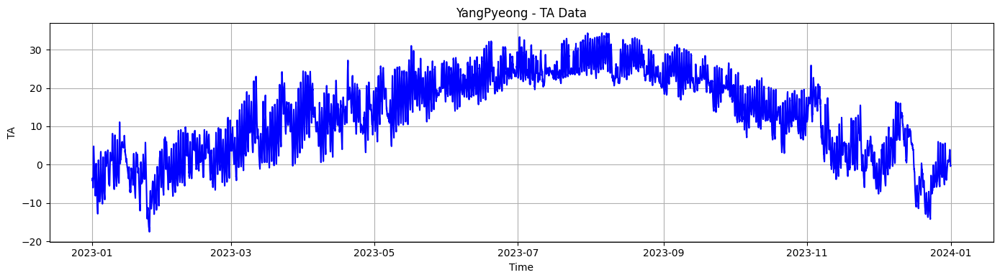

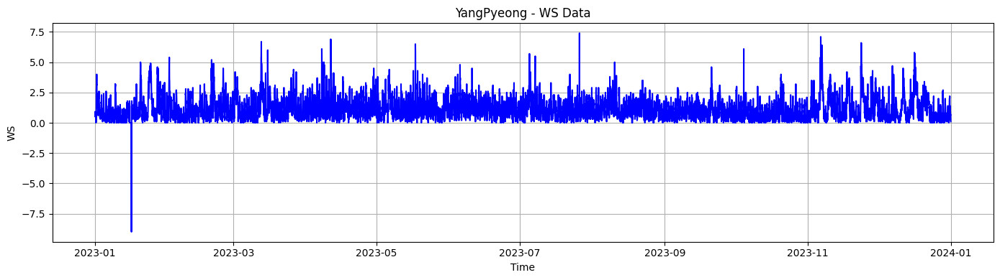

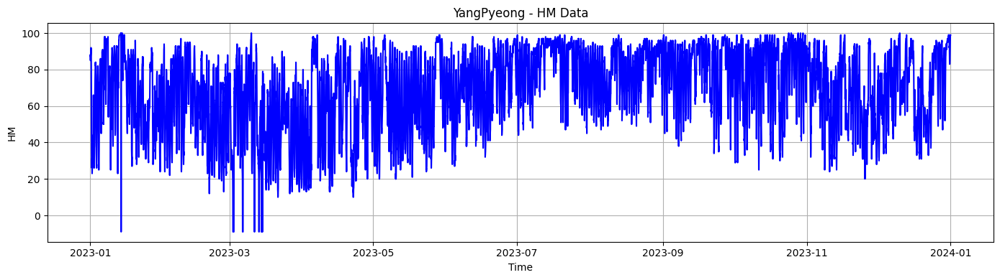

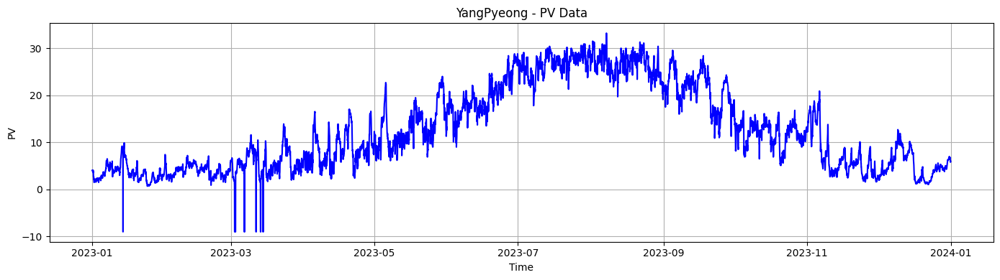

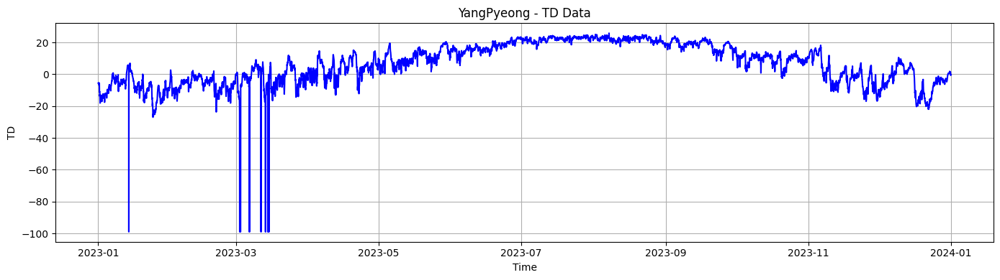

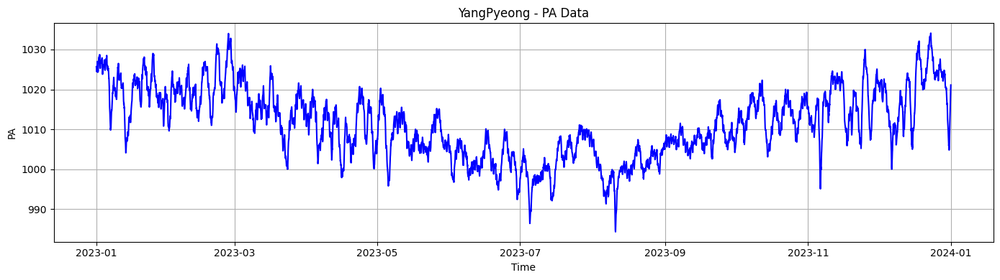

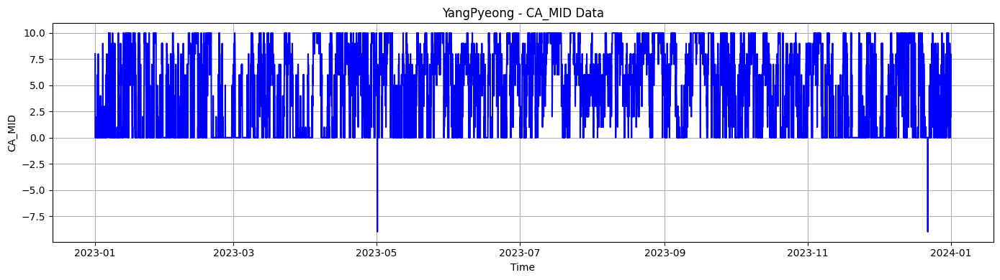

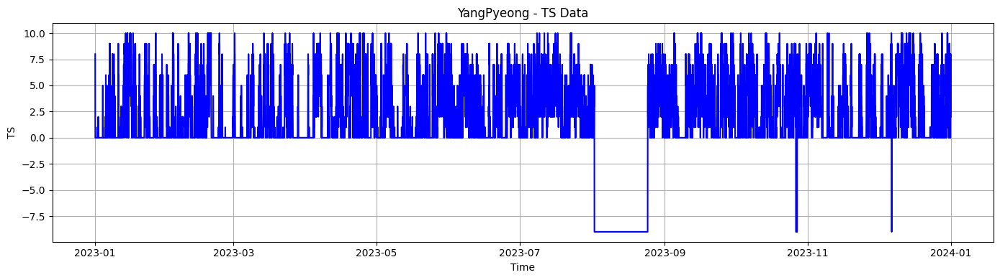

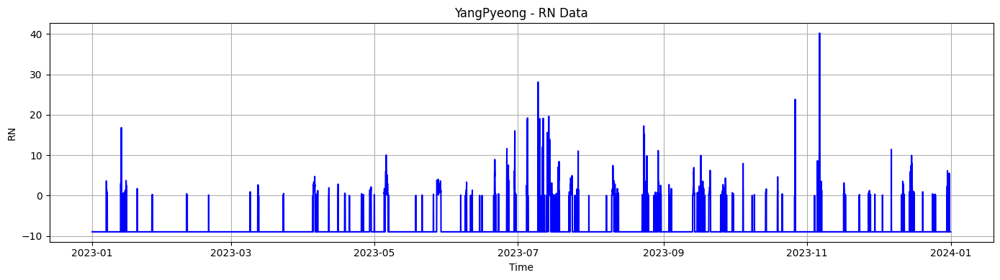

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 데이터 읽기
df = pd.read_csv('./data/df_202_filled.csv')
features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'TS', 'RN']  # 기상 변수
df['TM'] = pd.to_datetime(df['TM'], format='%Y%m%d%H%M')
# 2023년 데이터 필터링
df = df[df['TM'].dt.year == 2023]

# 각 피처에 대한 시각화를 개별적으로 수행
for col in features:
    plt.figure(figsize=(14, 4))

    # 원본 데이터 시각화
    plt.plot(df['TM'], df[col], label=f'{col}', color='blue')
    plt.title(f'YangPyeong - {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col}')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

In [ ]:
# import matplotlib.pyplot as plt
# import pandas as pd
# import numpy as np
# from sklearn.preprocessing import StandardScaler, MinMaxScaler

# # 지역별 파일 경로 (예시: 각 지역별로 다른 CSV 파일)
# file_paths = {
#     'Dongducheon': './data/df_98_filled.csv',
#     'Seoul': './data/df_108_filled.csv',
#     'Incheon': './data/df_112_filled.csv',
#     'Suwon': './data/df_119_filled.csv',
#     'Yangpyeong': './data/df_202_filled.csv',
# }

# meta_data = {
#     'TM': '관측시간(KST)',
#     'TA': '기온(C)',
#     'WS': '풍속(m/s)',
#     'HM': '상대습도(%)',
#     'PV': '수증기압(hPa)',
#     'TD': '이슬점온도(C)',
#     'PA': '현지기압(hPa)',
#     'CA_MID': '중하층운량(1/10)',
#     'RN': '강수량(mm)'
# }

# features = ['TA','WS','HM','PV','TD','PA','CA_MID','RN']  # 기상 변수
# minmax_features = ['CA_MID', 'RN']  # MinMaxScaler 적용할 피처들
# remaining_features = list(set(features) - set(minmax_features))  # StandardScaler 적용할 피처들

# # 각 지역의 데이터를 저장할 딕셔너리
# region_dfs = {}
# scaled_data = []
# scalers = {}

# # 각 지역의 데이터를 읽고 처리 (스케일링 수행)
# for region, file_path in file_paths.items():
#     # 파일에서 데이터 읽기
#     df = pd.read_csv(file_path)

#     # TM을 datetime 형식으로 변환
#     df['TM'] = pd.to_datetime(df['TM'], format='%Y%m%d%H%M')

#     # 샘플링 (2023년 데이터만)
#     df_sample = df[(df['TM'] >= '2023-01-01') & (df['TM'] < '2024-09-01')]

#     # 지정된 피처만 선택
#     region_data = df_sample[features].copy()

#     # MinMaxScaler는 'CA_MID', 'TS' 피처에 적용
#     scaler_minmax = MinMaxScaler()
#     region_data[minmax_features] = scaler_minmax.fit_transform(region_data[minmax_features])

#     # StandardScaler는 나머지 피처에 적용
#     scaler_standard = StandardScaler()
#     region_data[remaining_features] = scaler_standard.fit_transform(region_data[remaining_features])

#     # 결과 저장
#     region_dfs[region] = region_data  # 스케일링된 데이터 저장
#     scaled_data.append(region_data)   # 각 지역의 스케일링된 데이터를 리스트에 추가
#     scalers[region] = {'minmax': scaler_minmax, 'standard': scaler_standard}  # 각 스케일러 저장

# # 스케일링된 데이터를 3차원으로 스택 (num_samples, num_features, num_regions)
# scaled_data = np.stack(scaled_data, axis=-1)

# --- 여기까지가 모든 지역의 스케일링 작업 ---

# 그래프는 서울 지역의 8개 칼럼에 대해 각각 그리기

# 서울 지역 스케일링된 데이터 가져오기
# seoul_data = region_dfs['Seoul']

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

df = pd.read_csv('./data/df_108_filled.csv')
features = ['TA','WS','HM','PV','TD','PA','CA_MID','RN']  # 기상 변수


# 각 피처에 대한 스케일링 전후의 시각화를 개별적으로 수행
for col in features:
    plt.figure(figsize=(14, 6))

    # 스케일링 전 (원본) 데이터 시각화
    plt.subplot(2, 1, 1)
    plt.plot(df['TM'], df[col], label=f'Original {col}', color='blue')
    plt.title(f'Seoul - Original {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col} (Original)')
    plt.grid(True)

    # 스케일링 후 데이터 시각화
    plt.subplot(2, 1, 2)
    plt.plot(df['TM'], df[col], label=f'Scaled {col}', color='orange')
    plt.title(f'Seoul - Scaled {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col} (Scaled)')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

### 전처리

#### 1,6시간 단위

In [ ]:
# 지역별 파일 경로 (예시: 각 지역별로 다른 CSV 파일)
file_paths = {
    'Dongducheon': './data/df_98_filled.csv',
    'Seoul': './data/df_108_filled.csv',
    'Incheon': './data/df_112_filled.csv',
    'Suwon': './data/df_119_filled.csv',
    'Yangpyeong': './data/df_202_filled.csv',
}

meta_data = {
    'TM': '관측시간(KST)',
    'TA': '기온(C)',
    'WS': '풍속(m/s)',
    'HM': '상대습도(%)',
    'PV': '수증기압(hPa)',
    'TD': '이슬점온도(C)',
    'PA': '현지기압(hPa)',
    'CA_MID': '중하층운량(1/10)',
    'TS': '지면온도(C)',
    'RN': '강수량(mm)'
}

# 각 지역의 데이터를 저장할 딕셔너리
region_dfs = {}
region_dfs_6h = {}  # 6시간 단위로 집계된 데이터를 저장할 딕셔너리

# 음수 값이 있는지 확인하고, 있으면 forward fill 처리하는 함수
def check_and_fill_negative(df, columns):
    for col in columns:
        # 음수 값이 있는지 확인
        if (df[col] < 0).any():
            print(f"{col}에 음수 값이 있습니다. forward fill로 처리합니다.")
            # 음수 값을 forward fill 처리
            df[col] = df[col].mask(df[col] < 0).ffill()
        else:
            print(f"{col}에 음수 값이 없습니다.")
    return df

# 각 파일을 읽어들여 데이터를 처리
for region, file_path in file_paths.items():
    # 파일에서 데이터 읽기
    df = pd.read_csv(file_path)

    # TM을 datetime 형식으로 변환
    df['TM'] = pd.to_datetime(df['TM'], format='%Y%m%d%H%M')

    # 음수 값 처리 및 결측값 처리
    df['TA'] = df['TA'].replace(-99.0, pd.NA).fillna(method='ffill')
    df['RN'] = df['RN'].replace(0, 0.05).replace(-9.0, 0)
    df['TD'] = df['TD'].replace(-99.0, pd.NA).fillna(method='ffill')

    # 음수값 확인 및 처리
    df = check_and_fill_negative(df, ['WS', 'HM', 'PV', 'PA', 'CA_MID'])

    # 1시간 단위 데이터 저장
    region_dfs[region] = df

    # 6시간 단위로 리샘플링
    df_6h = df.resample('6H', on='TM').sum()
    region_dfs_6h[region] = df_6h

    print(f"{region} 지역의 모든 음수 값이 확인 및 처리되었고, 6시간 단위 데이터가 생성되었습니다.")

# 필요시 수정된 데이터를 저장할 수 있습니다 (1시간 단위)
region_dfs['동두천'].to_csv('./data/preprocessed_df_98_filled.csv', index=False)
region_dfs['서울'].to_csv('./data/preprocessed_df_108_filled.csv', index=False)
region_dfs['인천'].to_csv('./data/preprocessed_df_112_filled.csv', index=False)
region_dfs['수원'].to_csv('./data/preprocessed_df_119_filled.csv', index=False)
region_dfs['양평'].to_csv('./data/preprocessed_df_202_filled.csv', index=False)

# 6시간 단위로 리샘플링한 데이터를 저장할 수 있습니다
region_dfs_6h['동두천'].to_csv('./data/preprocessed_df_98_filled_6h.csv')
region_dfs_6h['서울'].to_csv('./data/preprocessed_df_108_filled_6h.csv')
region_dfs_6h['인천'].to_csv('./data/preprocessed_df_112_filled_6h.csv')
region_dfs_6h['수원'].to_csv('./data/preprocessed_df_119_filled_6h.csv')
region_dfs_6h['양평'].to_csv('./data/preprocessed_df_202_filled_6h.csv')

<ipython-input-5-96721eeb2b4b>:48: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['TA'] = df['TA'].replace(-99.0, pd.NA).fillna(method='ffill')
<ipython-input-5-96721eeb2b4b>:50: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['TD'] = df['TD'].replace(-99.0, pd.NA).fillna(method='ffill')


WS에 음수 값이 있습니다. forward fill로 처리합니다.
HM에 음수 값이 있습니다. forward fill로 처리합니다.
PV에 음수 값이 있습니다. forward fill로 처리합니다.
PA에 음수 값이 있습니다. forward fill로 처리합니다.
CA_MID에 음수 값이 있습니다. forward fill로 처리합니다.
동두천 지역의 모든 음수 값이 확인 및 처리되었고, 6시간 단위 데이터가 생성되었습니다.


<ipython-input-5-96721eeb2b4b>:48: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['TA'] = df['TA'].replace(-99.0, pd.NA).fillna(method='ffill')
<ipython-input-5-96721eeb2b4b>:50: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['TD'] = df['TD'].replace(-99.0, pd.NA).fillna(method='ffill')


WS에 음수 값이 있습니다. forward fill로 처리합니다.
HM에 음수 값이 없습니다.
PV에 음수 값이 없습니다.
PA에 음수 값이 있습니다. forward fill로 처리합니다.
CA_MID에 음수 값이 있습니다. forward fill로 처리합니다.
서울 지역의 모든 음수 값이 확인 및 처리되었고, 6시간 단위 데이터가 생성되었습니다.


<ipython-input-5-96721eeb2b4b>:48: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['TA'] = df['TA'].replace(-99.0, pd.NA).fillna(method='ffill')
<ipython-input-5-96721eeb2b4b>:50: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['TD'] = df['TD'].replace(-99.0, pd.NA).fillna(method='ffill')


WS에 음수 값이 있습니다. forward fill로 처리합니다.
HM에 음수 값이 없습니다.
PV에 음수 값이 없습니다.
PA에 음수 값이 없습니다.
CA_MID에 음수 값이 있습니다. forward fill로 처리합니다.
인천 지역의 모든 음수 값이 확인 및 처리되었고, 6시간 단위 데이터가 생성되었습니다.


<ipython-input-5-96721eeb2b4b>:48: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['TA'] = df['TA'].replace(-99.0, pd.NA).fillna(method='ffill')
<ipython-input-5-96721eeb2b4b>:50: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['TD'] = df['TD'].replace(-99.0, pd.NA).fillna(method='ffill')


WS에 음수 값이 없습니다.
HM에 음수 값이 있습니다. forward fill로 처리합니다.
PV에 음수 값이 있습니다. forward fill로 처리합니다.
PA에 음수 값이 없습니다.
CA_MID에 음수 값이 있습니다. forward fill로 처리합니다.
수원 지역의 모든 음수 값이 확인 및 처리되었고, 6시간 단위 데이터가 생성되었습니다.


<ipython-input-5-96721eeb2b4b>:48: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['TA'] = df['TA'].replace(-99.0, pd.NA).fillna(method='ffill')
<ipython-input-5-96721eeb2b4b>:50: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['TD'] = df['TD'].replace(-99.0, pd.NA).fillna(method='ffill')


WS에 음수 값이 있습니다. forward fill로 처리합니다.
HM에 음수 값이 있습니다. forward fill로 처리합니다.
PV에 음수 값이 있습니다. forward fill로 처리합니다.
PA에 음수 값이 없습니다.
CA_MID에 음수 값이 있습니다. forward fill로 처리합니다.
양평 지역의 모든 음수 값이 확인 및 처리되었고, 6시간 단위 데이터가 생성되었습니다.


#### 레이블링

In [ ]:
# 1시간 단위 데이터 불러오기
region_dfs = {
    'Dongducheon': pd.read_csv('./data/preprocessed_df_98_filled.csv'),
    'Seoul': pd.read_csv('./data/preprocessed_df_108_filled.csv'),
    'Incheon': pd.read_csv('./data/preprocessed_df_112_filled.csv'),
    'Suwon': pd.read_csv('./data/preprocessed_df_119_filled.csv'),
    'Yangpyeong': pd.read_csv('./data/preprocessed_df_202_filled.csv')
}

# 6시간 단위 데이터 불러오기
region_dfs_6h = {
    'Dongducheon': pd.read_csv('./data/preprocessed_df_98_filled_6h.csv'),
    'Seoul': pd.read_csv('./data/preprocessed_df_108_filled_6h.csv'),
    'Incheon': pd.read_csv('./data/preprocessed_df_112_filled_6h.csv'),
    'Suwon': pd.read_csv('./data/preprocessed_df_119_filled_6h.csv'),
    'Yangpyeong': pd.read_csv('./data/preprocessed_df_202_filled_6h.csv')
}

# 함수 정의: 강수량(RN)을 숫자로 변환
def categorize_rainfall(rn_value):
    if rn_value == 0:
        return 0  # 없음
    elif 0 < rn_value <= 3:
        return 1  # 우산 필요없음
    elif 3 < rn_value <= 7:
        return 2  # 우산 필요
    else:
        return 3  # 폭우

# 모든 지역 데이터에 적용
for region, df in region_dfs.items():
    # RN 칼럼을 기준으로 숫자 카테고리 칼럼 추가
    df['RN_Category'] = df['RN'].apply(categorize_rainfall)

# 6시간 단위 데이터에도 적용
for region, df in region_dfs_6h.items():
    df['RN_Category'] = df['RN'].apply(categorize_rainfall)

# 1시간 단위 데이터 저장
region_dfs['Dongducheon'].to_csv('./data/preprocessed_df_98_filled_with_category.csv', index=False)
region_dfs['Seoul'].to_csv('./data/preprocessed_df_108_filled_with_category.csv', index=False)
region_dfs['Incheon'].to_csv('./data/preprocessed_df_112_filled_with_category.csv', index=False)
region_dfs['Suwon'].to_csv('./data/preprocessed_df_119_filled_with_category.csv', index=False)
region_dfs['Yangpyeong'].to_csv('./data/preprocessed_df_202_filled_with_category.csv', index=False)

# 6시간 단위 데이터 저장
region_dfs_6h['Dongducheon'].to_csv('./data/preprocessed_df_98_filled_6h_with_category.csv', index=False)
region_dfs_6h['Seoul'].to_csv('./data/preprocessed_df_108_filled_6h_with_category.csv', index=False)
region_dfs_6h['Incheon'].to_csv('./data/preprocessed_df_112_filled_6h_with_category.csv', index=False)
region_dfs_6h['Suwon'].to_csv('./data/preprocessed_df_119_filled_6h_with_category.csv', index=False)
region_dfs_6h['Yangpyeong'].to_csv('./data/preprocessed_df_202_filled_6h_with_category.csv', index=False)

### 전처리 후 데이터 확인

#### 서울

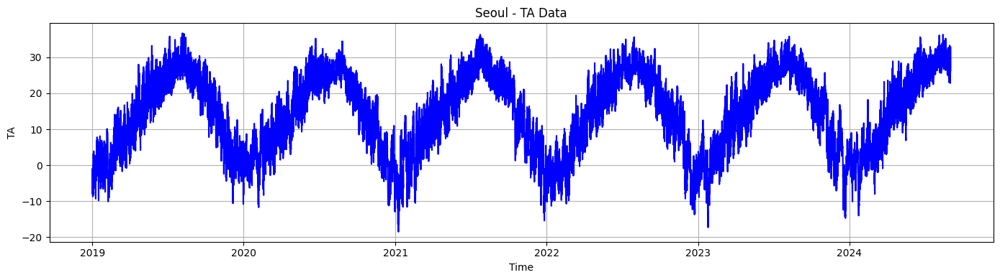

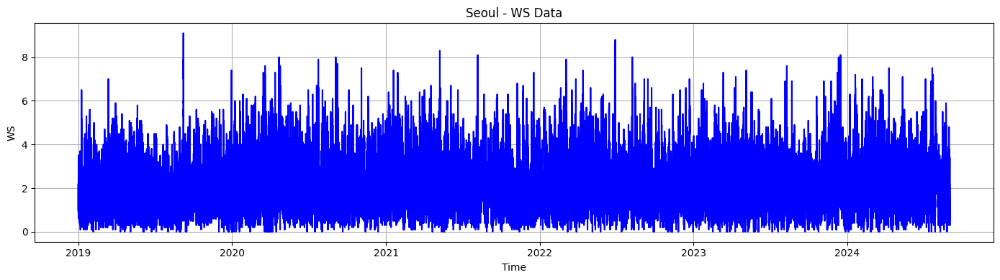

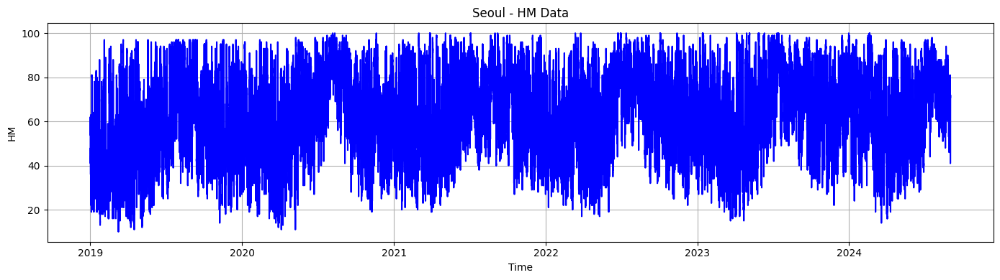

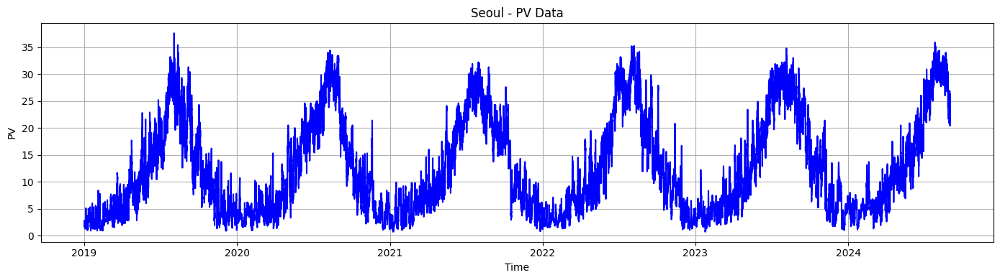

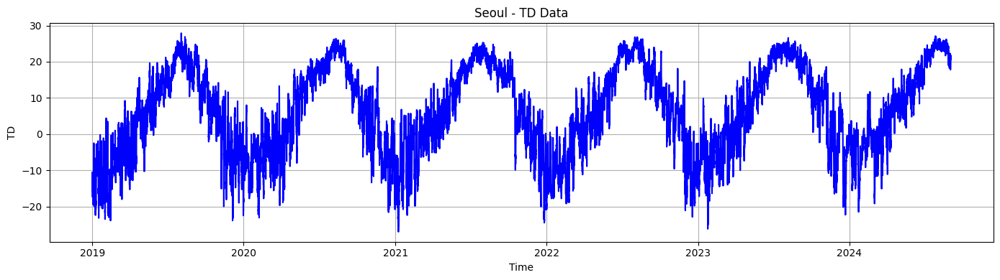

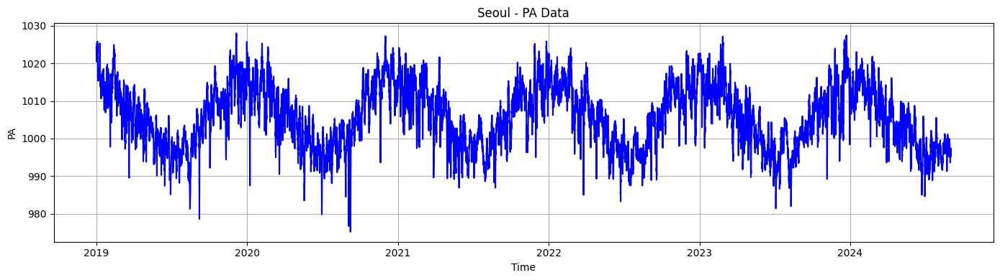

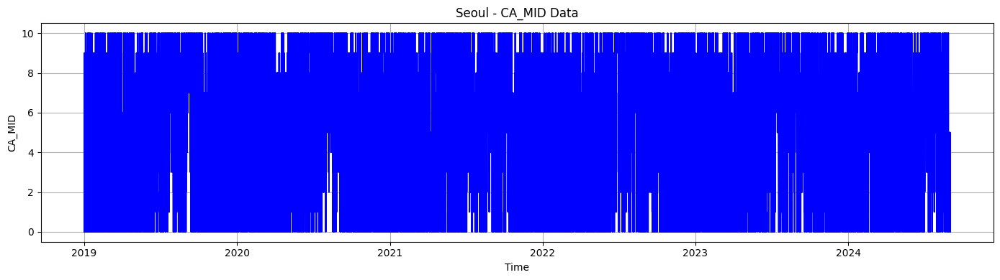

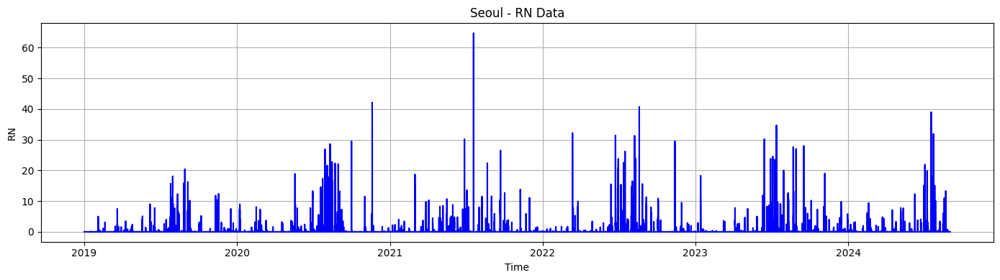

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 데이터 읽기
df = pd.read_csv('./data/preprocessed_df_108_filled.csv')
features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'RN']  # 기상 변수
df['TM'] = pd.to_datetime(df['TM'], format='%Y%m%d%H%M')
# 2023년 데이터 필터링
# df = df[df['TM'].dt.year == 2023]

# 각 피처에 대한 시각화를 개별적으로 수행
for col in features:
    plt.figure(figsize=(14, 4))

    # 원본 데이터 시각화
    plt.plot(df['TM'], df[col], label=f'{col}', color='blue')
    plt.title(f'Seoul - {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col}')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

#### 동두천

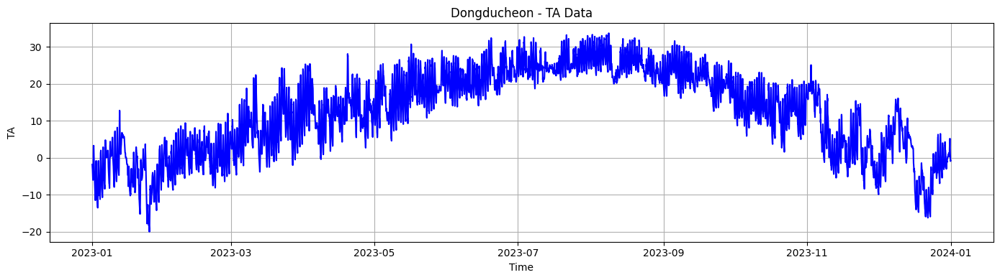

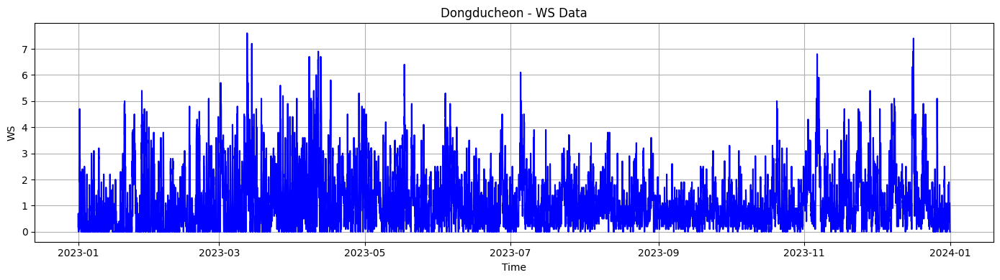

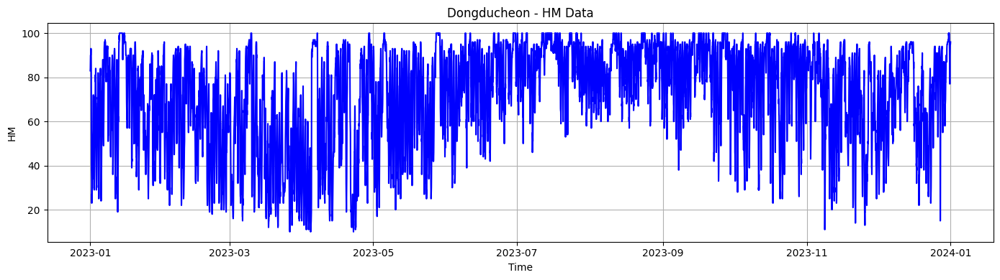

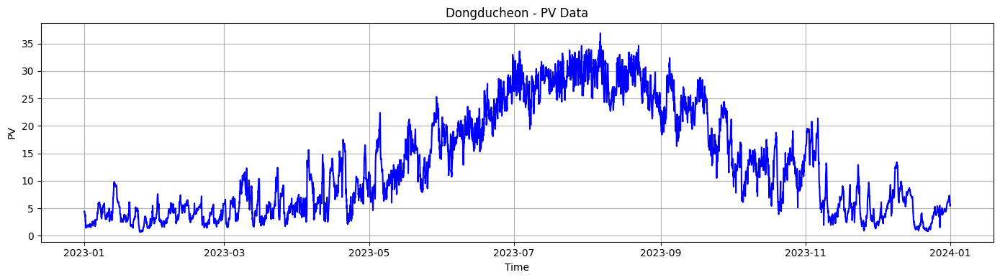

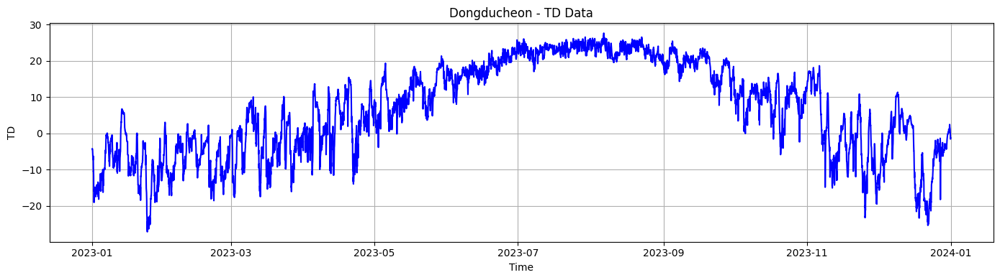

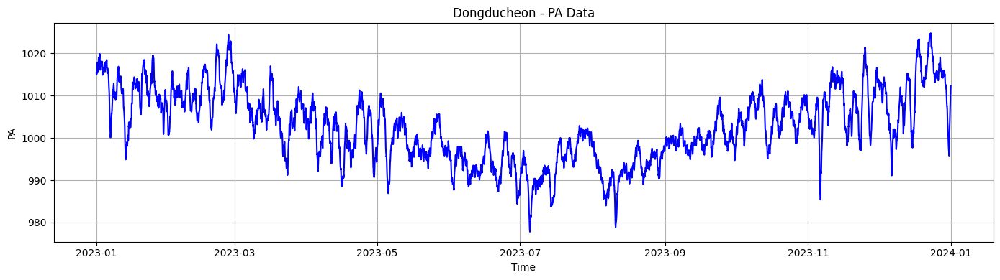

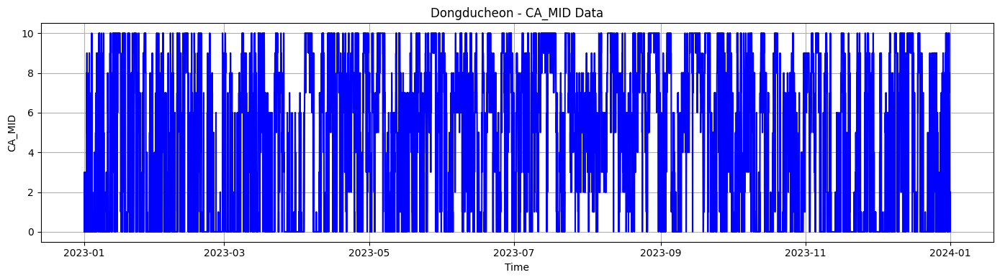

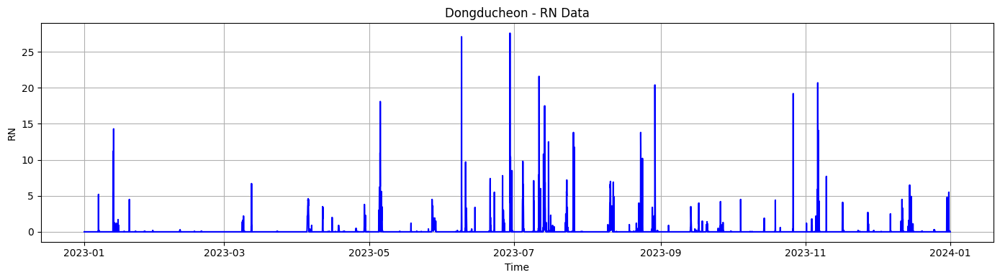

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 데이터 읽기
df = pd.read_csv('./data/preprocessed_df_98_filled.csv')
features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'RN']  # 기상 변수
df['TM'] = pd.to_datetime(df['TM'], format='%Y%m%d%H%M')
# 2023년 데이터 필터링
df = df[df['TM'].dt.year == 2023]

# 각 피처에 대한 시각화를 개별적으로 수행
for col in features:
    plt.figure(figsize=(14, 4))

    # 원본 데이터 시각화
    plt.plot(df['TM'], df[col], label=f'{col}', color='blue')
    plt.title(f'Dongducheon - {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col}')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

#### 인천

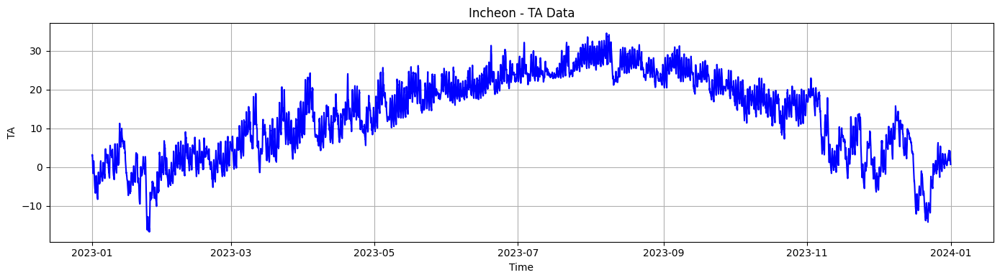

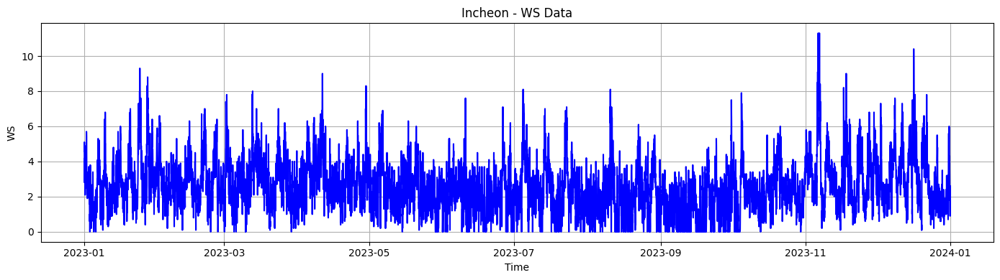

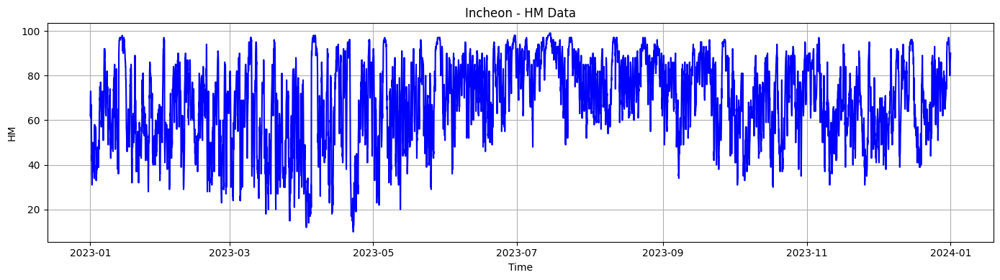

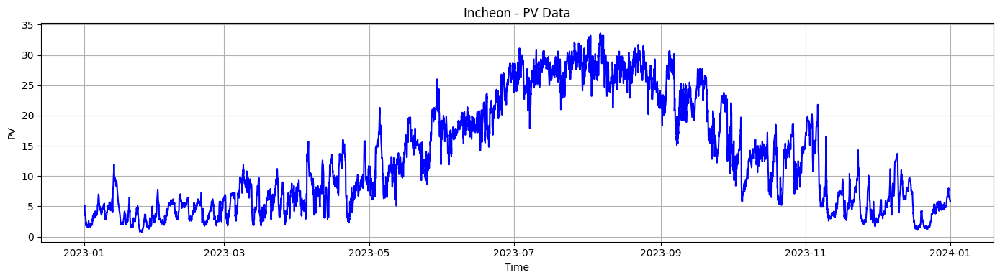

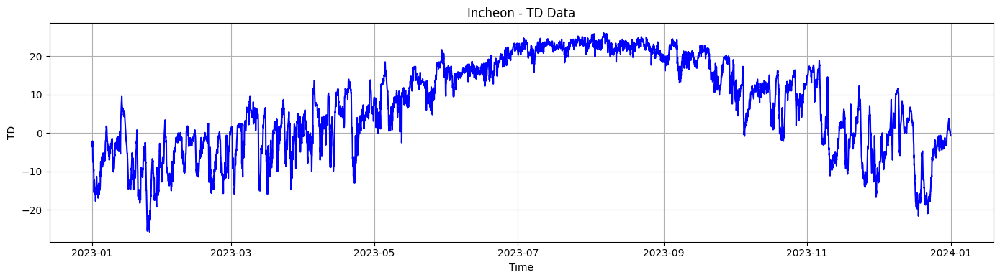

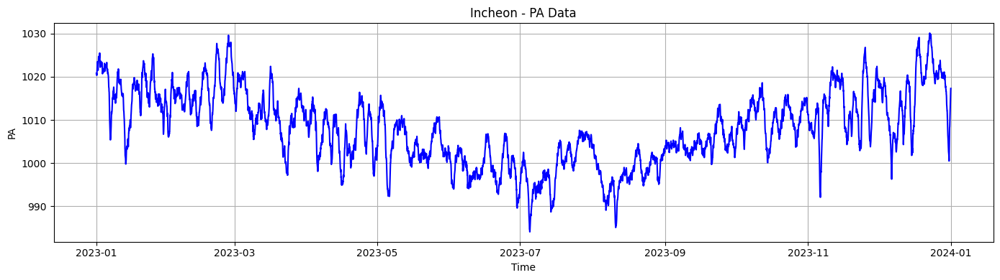

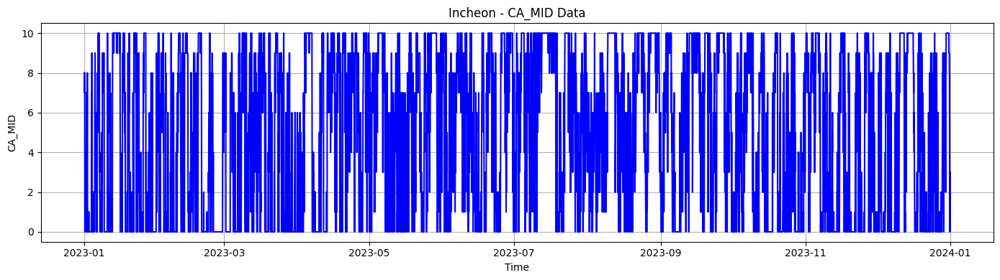

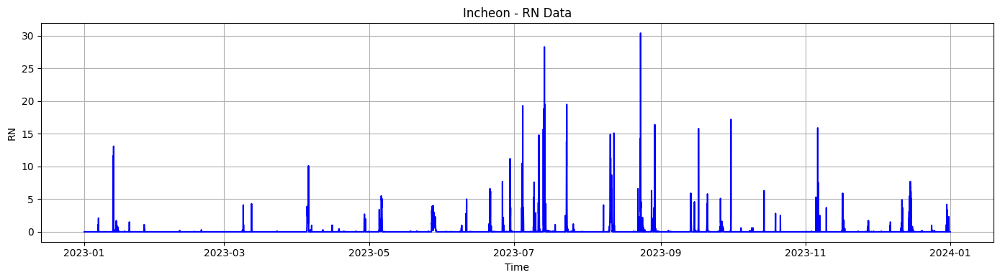

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 데이터 읽기
df = pd.read_csv('./data/preprocessed_df_112_filled.csv')
features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'RN']  # 기상 변수
df['TM'] = pd.to_datetime(df['TM'], format='%Y%m%d%H%M')
# 2023년 데이터 필터링
df = df[df['TM'].dt.year == 2023]

# 각 피처에 대한 시각화를 개별적으로 수행
for col in features:
    plt.figure(figsize=(14, 4))

    # 원본 데이터 시각화
    plt.plot(df['TM'], df[col], label=f'{col}', color='blue')
    plt.title(f'Incheon - {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col}')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

#### 수원

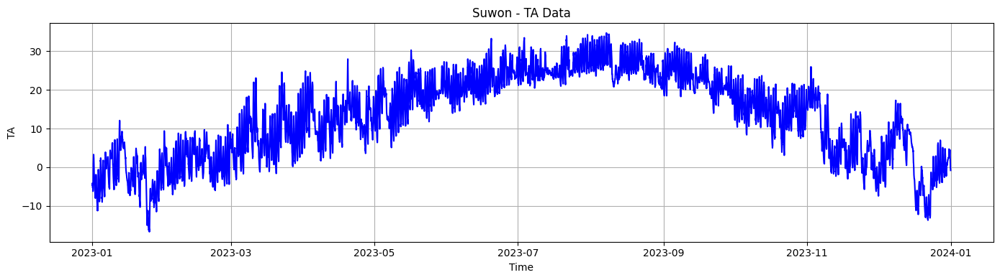

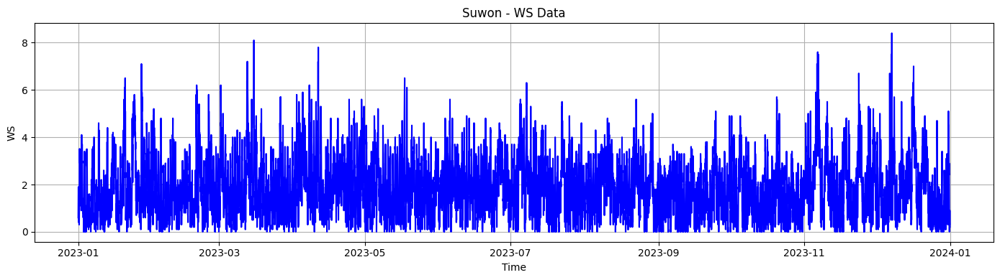

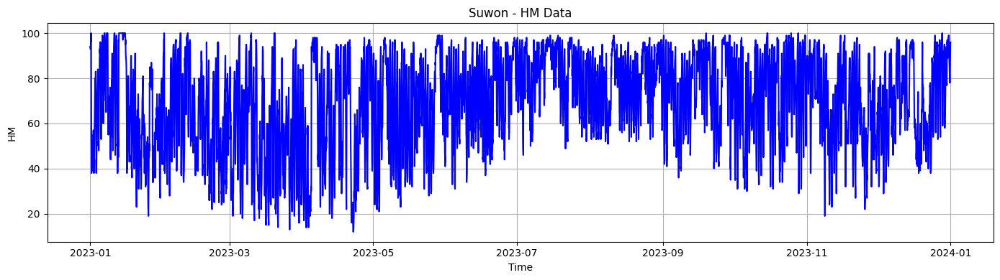

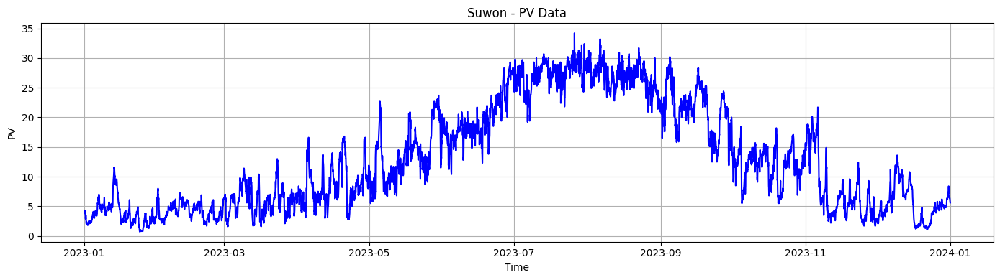

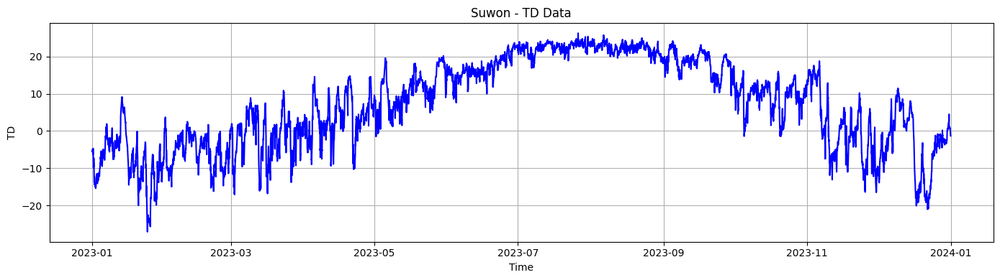

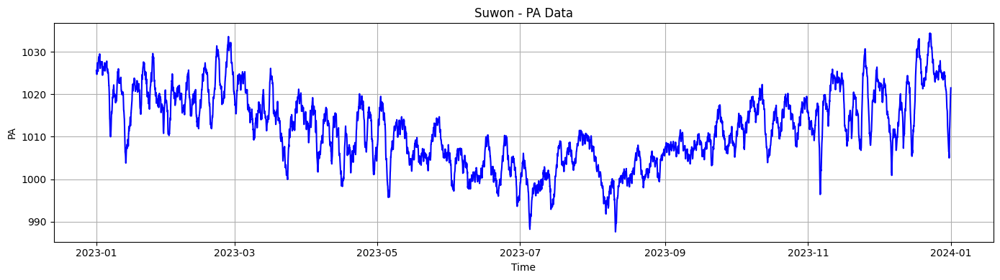

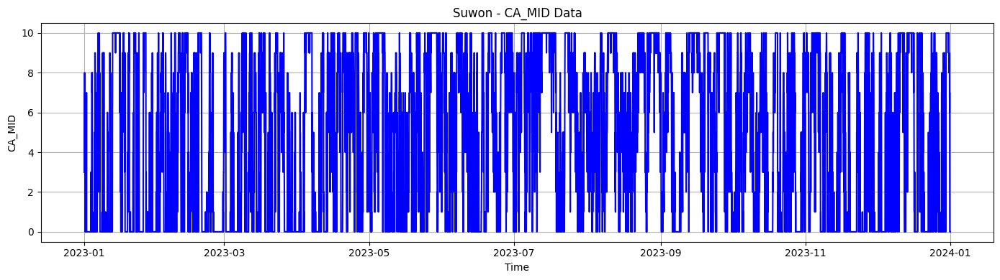

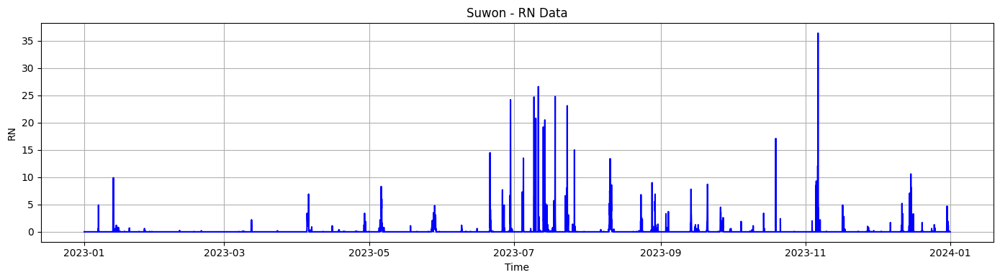

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 데이터 읽기
df = pd.read_csv('./data/preprocessed_df_119_filled.csv')
features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'RN']  # 기상 변수
df['TM'] = pd.to_datetime(df['TM'], format='%Y%m%d%H%M')
# 2023년 데이터 필터링
df = df[df['TM'].dt.year == 2023]

# 각 피처에 대한 시각화를 개별적으로 수행
for col in features:
    plt.figure(figsize=(14, 4))

    # 원본 데이터 시각화
    plt.plot(df['TM'], df[col], label=f'{col}', color='blue')
    plt.title(f'Suwon - {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col}')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

#### 양평

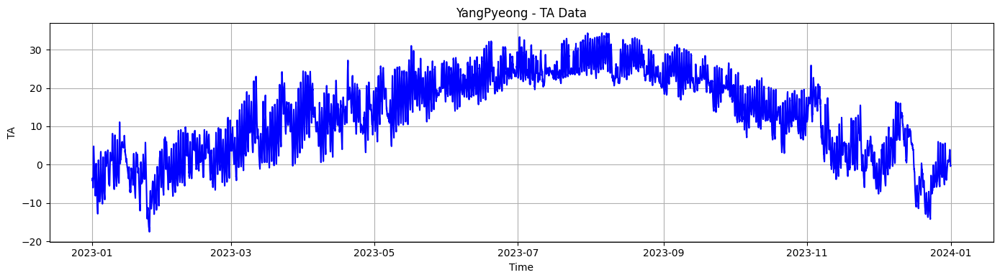

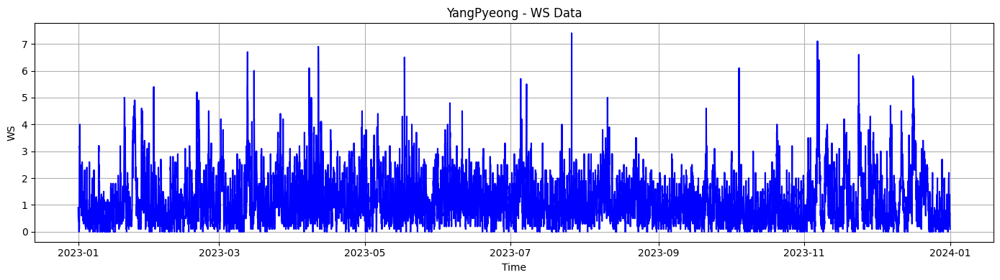

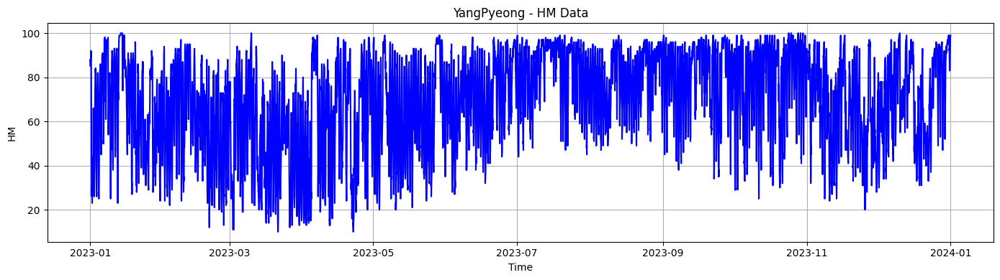

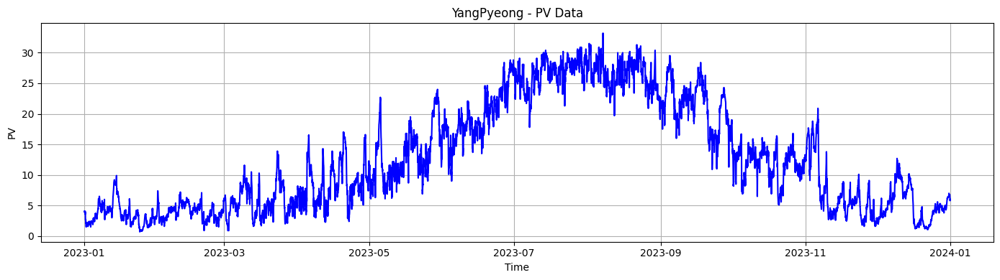

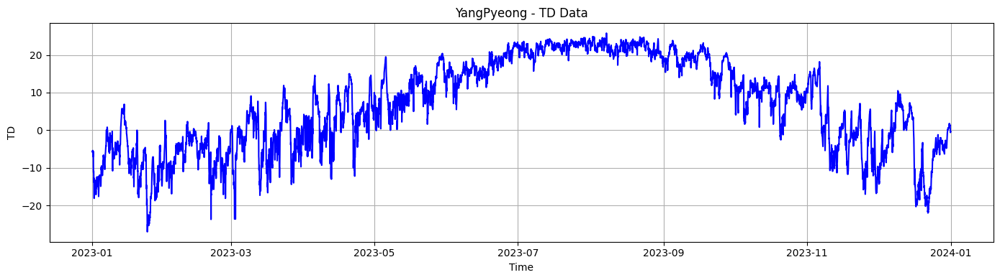

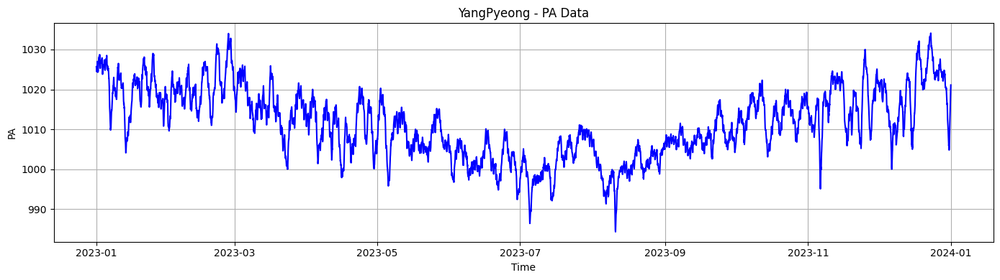

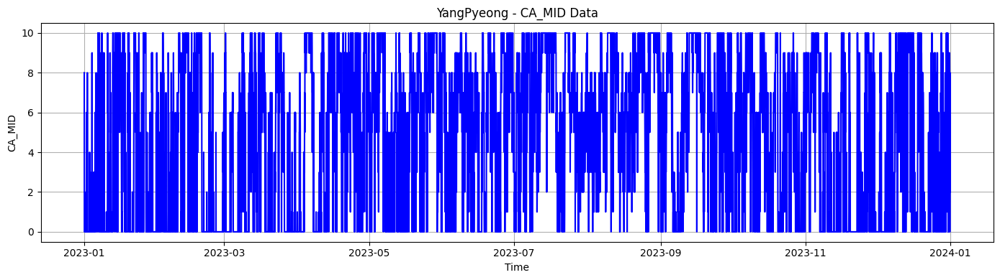

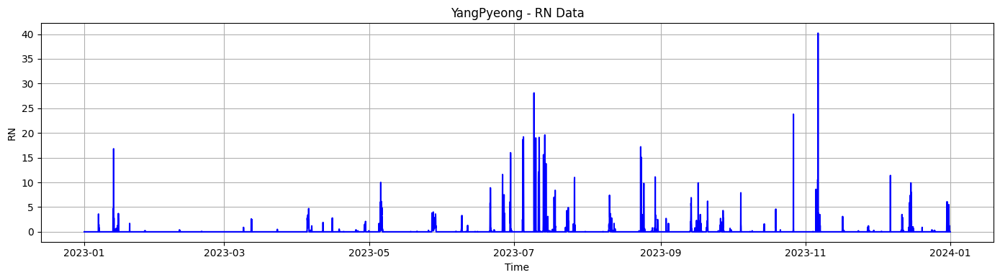

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 데이터 읽기
df = pd.read_csv('./data/preprocessed_df_202_filled.csv')
features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'RN']  # 기상 변수
df['TM'] = pd.to_datetime(df['TM'], format='%Y%m%d%H%M')
# 2023년 데이터 필터링
df = df[df['TM'].dt.year == 2023]

# 각 피처에 대한 시각화를 개별적으로 수행
for col in features:
    plt.figure(figsize=(14, 4))

    # 원본 데이터 시각화
    plt.plot(df['TM'], df[col], label=f'{col}', color='blue')
    plt.title(f'YangPyeong - {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col}')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

## 02. 모델링

### 아키텍쳐

In [4]:
class AttentionBlock(nn.Module):
    def __init__(self, d_model, n_heads):
        super().__init__()
        d_h = d_model // n_heads

        self.scale = d_h**-0.5
        self.n_heads, self.d_h = n_heads, d_h

        self.W_Q = nn.Linear(d_model, d_h * n_heads)
        self.W_K = nn.Linear(d_model, d_h * n_heads)
        self.W_V = nn.Linear(d_model, d_h * n_heads)

        self.to_out = nn.Linear(n_heads * d_h, d_model)

    def forward(self, q, k, v):
        bs = q.size(0)
        q_s = self.W_Q(q).view(bs, -1, self.n_heads, self.d_h)
        k_s = self.W_K(k).view(bs, -1, self.n_heads, self.d_h)
        v_s = self.W_V(v).view(bs, -1, self.n_heads, self.d_h)

        attn_scores = torch.einsum('bphd, bshd -> bphs', q_s, k_s) * self.scale
        attn_weights = F.softmax(attn_scores, dim=-1)
        output = torch.einsum('bphs, bshd -> bphd', attn_weights, v_s)
        output = output.contiguous().view(bs, -1, self.n_heads*self.d_h)
        output = self.to_out(output)
        return output

class EncoderBlock(nn.Module):
    def __init__(self, input_dim):
        super(EncoderBlock, self).__init__()
        self.input_dim = input_dim

        self.ffn = nn.Sequential(nn.Linear(self.input_dim, 2*self.input_dim),
                        nn.GELU(),
                        nn.Dropout(0.3),
                        nn.Linear(2*self.input_dim, self.input_dim))

        self.layernorm = nn.LayerNorm(self.input_dim)
        self.dropout = nn.Dropout(0.2)
        self.attn = AttentionBlock(self.input_dim, 2)

    def forward(self, x):
        y = self.attn(x, x, x)
        x = x + self.dropout(y)
        x = self.layernorm(x)

        y = self.ffn(x)
        x = x + self.dropout(y)
        y = self.layernorm(x)

        return y

class Transformer(nn.Module):
    def __init__(self, input_dim, emb_dim, out_dim, num_encoder):
        super().__init__()
        self.input_dim = input_dim
        self.emb_dim = emb_dim
        self.input_layer = nn.Linear(input_dim, emb_dim, bias=True)
        self.encoder_layers = nn.ModuleList([EncoderBlock(emb_dim) for _ in range(num_encoder)])
        self.flatten = nn.Flatten()
        self.output_layer = nn.Linear(emb_dim, out_dim, bias=True)

    def forward(self, x):
        batch_size, seq_length, num_features, num_regions = x.shape
        x = x.view(batch_size, seq_length, -1)
        x = self.input_layer(x)
        for l in self.encoder_layers:
            x = l(x)
        x = self.output_layer(x)

        return x

### 1시간 단위 예측

##### 데이터 불러오기

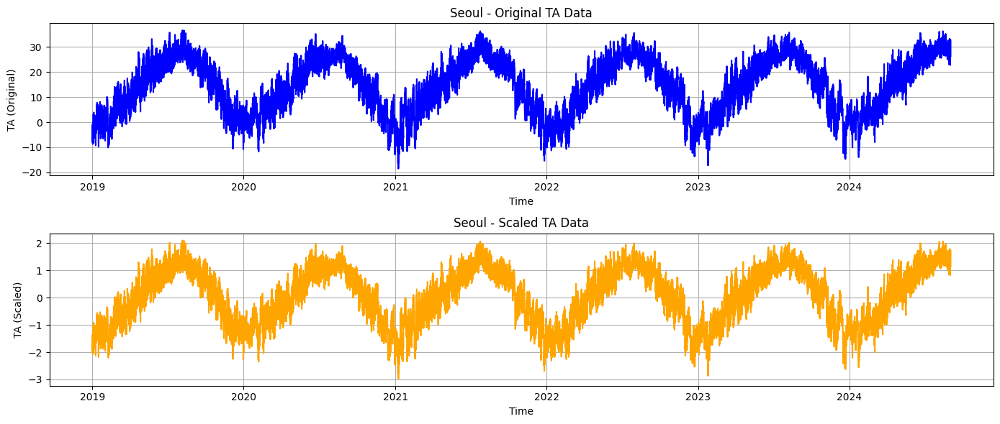

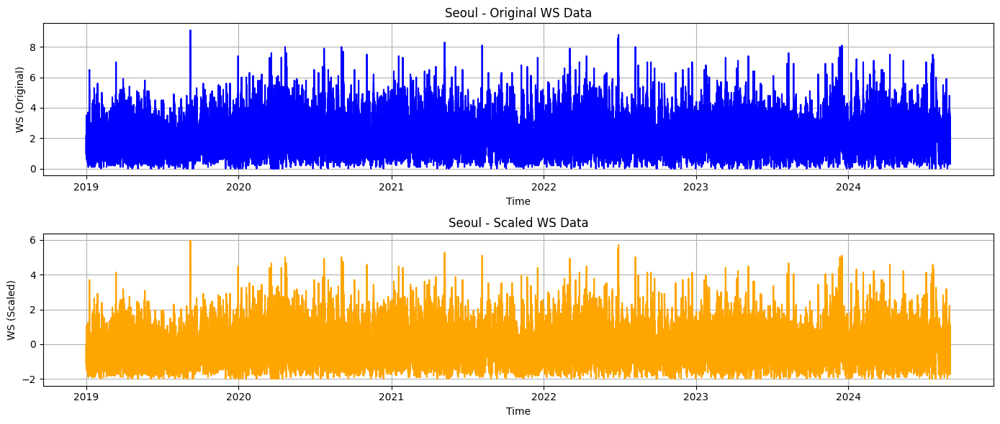

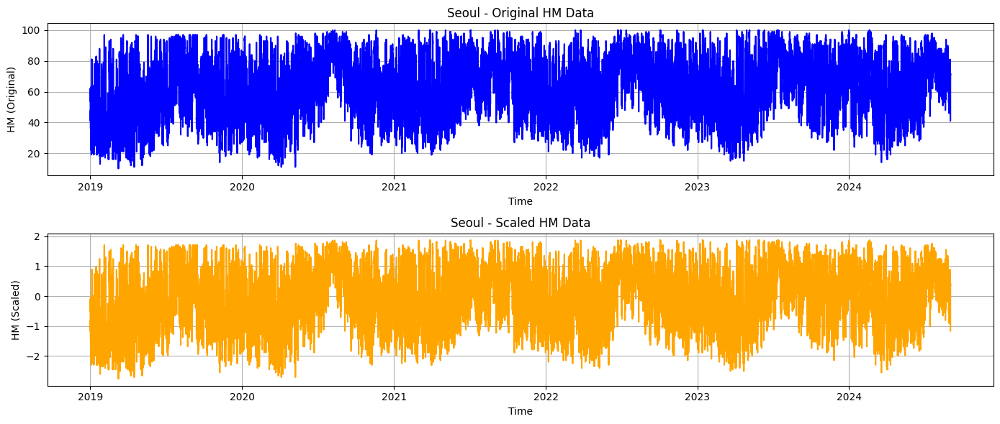

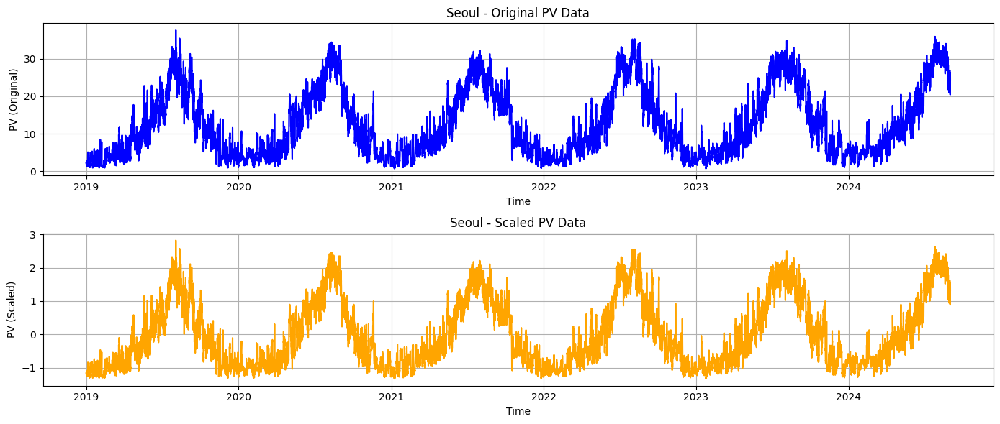

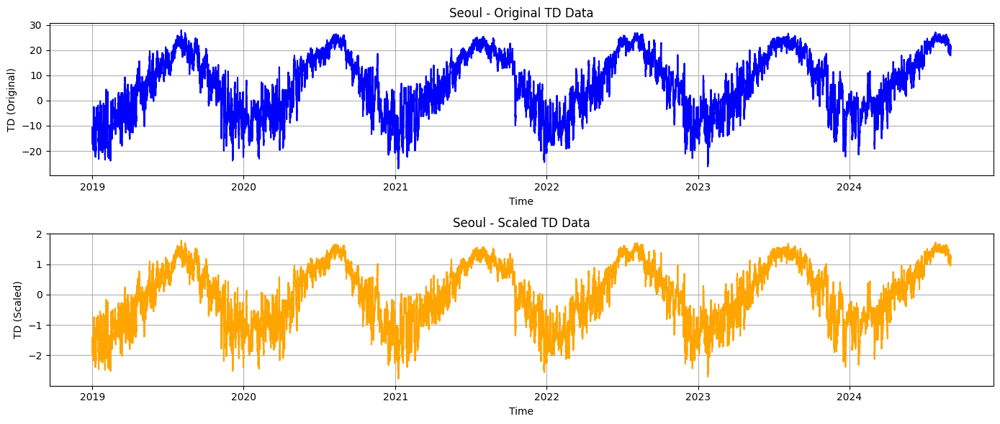

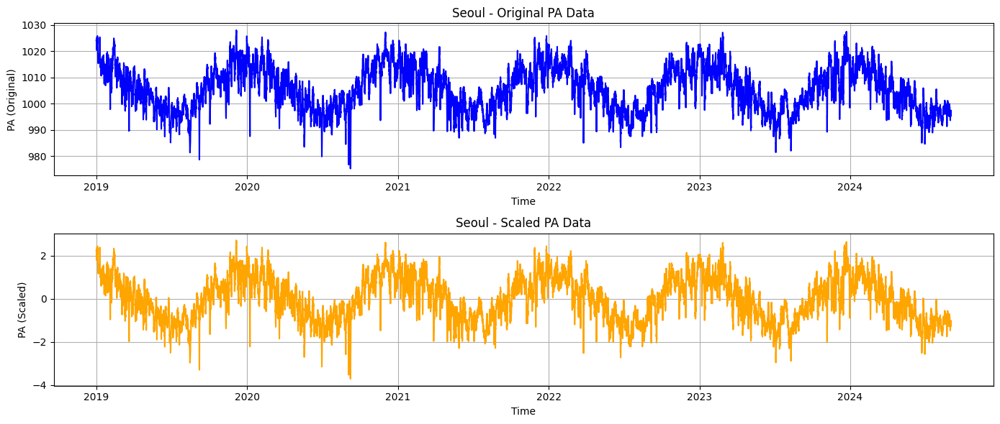

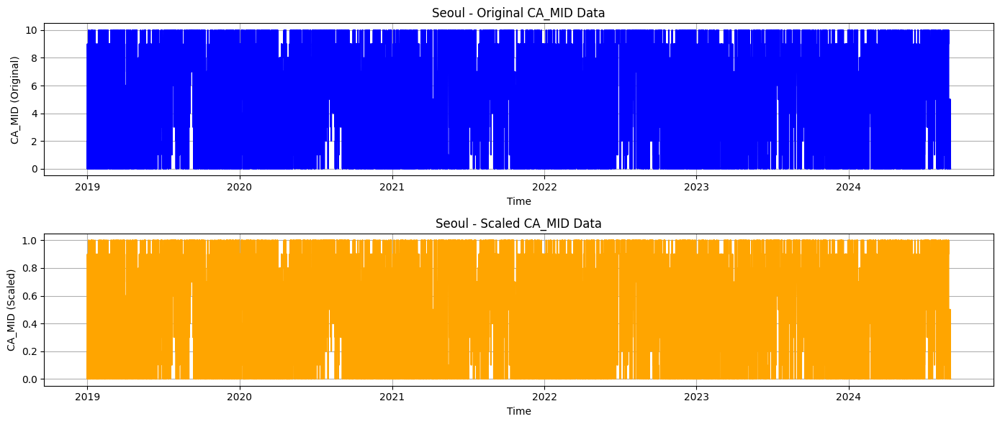

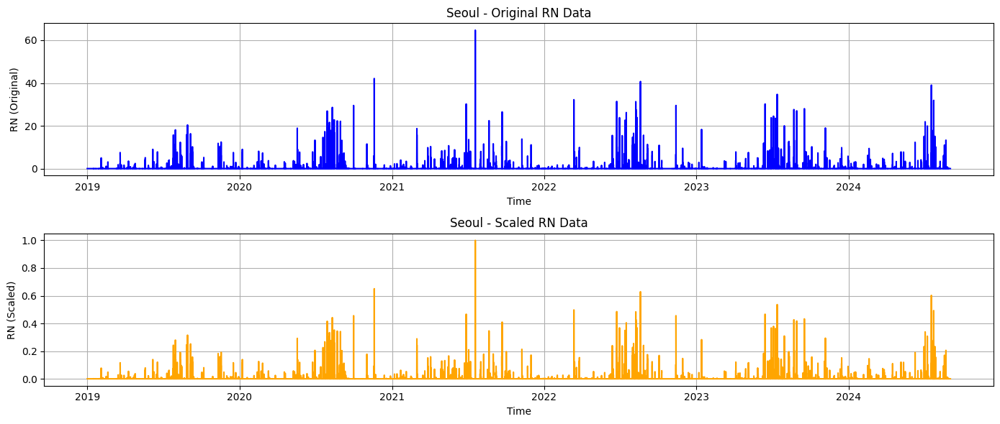

In [ ]:
# 지역별 파일
file_paths = {
    'Dongducheon': './data/preprocessed_df_98_filled.csv',
    'Seoul': './data/preprocessed_df_108_filled.csv',
    'Incheon': './data/preprocessed_df_112_filled.csv',
    'Suwon': './data/preprocessed_df_119_filled.csv',
    'Yangpyeong': './data/preprocessed_df_202_filled.csv',
}

meta_data = {
    'TM': '관측시간(KST)',
    'TA': '기온(C)',
    'WS': '풍속(m/s)',
    'HM': '상대습도(%)',
    'PV': '수증기압(hPa)',
    'TD': '이슬점온도(C)',
    'PA': '현지기압(hPa)',
    'CA_MID': '중하층운량(1/10)',
    'RN': '강수량(mm)'
}

features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'RN']  # 기상 변수
minmax_features = ['CA_MID', 'RN']  # MinMaxScaler 적용할 피처들
remaining_features = list(set(features) - set(minmax_features))  # StandardScaler 적용할 피처들

# 각 지역의 데이터를 저장할 딕셔너리
region_dfs = {}
original_data = {}
scaled_data = []
scalers = {}

# 각 지역의 데이터를 읽고 처리
for region, file_path in file_paths.items():
    # 파일에서 데이터 읽기
    df = pd.read_csv(file_path)

    df['TM'] = pd.to_datetime(df['TM'], format='%Y-%m-%d %H:%M:%S')

    # 스케일링 전 데이터를 저장
    original_data[region] = df[features + ['TM']].copy()

    # 지정된 피처만 선택
    region_data = df[features].copy()
    region_data['TM'] = df['TM']  # 시간 데이터 유지

    # MinMaxScaler는 'CA_MID', 'RN' 피처에 적용
    scaler_minmax = MinMaxScaler()
    region_data[minmax_features] = scaler_minmax.fit_transform(region_data[minmax_features])

    # StandardScaler는 나머지 피처에 적용
    scaler_standard = StandardScaler()
    region_data[remaining_features] = scaler_standard.fit_transform(region_data[remaining_features])

    # 스케일링된 데이터를 다시 저장
    region_dfs[region] = region_data  # 스케일링된 데이터 저장
    scaled_data.append(region_data)   # 각 지역의 스케일링된 데이터를 리스트에 추가
    scalers[region] = {'minmax': scaler_minmax, 'standard': scaler_standard}  # 각 스케일러 저장

# 스케일링된 데이터를 3차원으로 스택 (num_samples, num_features, num_regions)
scaled_data = np.stack(scaled_data, axis=-1)

# 서울 데이터를 기준으로 시각화
df_original = original_data['Seoul']  # 스케일링 전 데이터
df_scaled = region_dfs['Seoul']       # 스케일링 후 데이터
timestamp_1h = df_original['TM']

# 각 피처에 대한 스케일링 전후의 시각화를 개별적으로 수행
for col in features:
    plt.figure(figsize=(14, 6))

    # 스케일링 전 (원본) 데이터 시각화
    plt.subplot(2, 1, 1)
    plt.plot(df_original['TM'], df_original[col], label=f'Original {col}', color='blue')
    plt.title(f'Seoul - Original {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col} (Original)')
    plt.grid(True)

    # 스케일링 후 데이터 시각화
    plt.subplot(2, 1, 2)
    plt.plot(df_scaled['TM'], df_scaled[col], label=f'Scaled {col}', color='orange')
    plt.title(f'Seoul - Scaled {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col} (Scaled)')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

In [ ]:
seq_length = 28

def sliding_windows(data_X, data_y, seq_length):
    x = []
    y = []
    for i in range(len(data_X) - seq_length):
        _x = data_X[i:(i + seq_length)]
        _y = data_y[i + seq_length]
        x.append(_x)
        y.append(_y)
    return np.array(x, dtype=np.float32), np.array(y, dtype=np.float32)

In [ ]:
# 2024년을 기준으로 데이터를 분리하기 위한 마스크 생성
train_mask = df['TM'] < '2024-01-01'
test_mask = df['TM'] >= '2024-01-01'

# X_scaled와 y_scaled로 나누기 (타겟은 강수량)
X_scaled = scaled_data[:, :-1, :]  # 입력 변수 (시간은 제외)
y_scaled = scaled_data[:, -2, :]  # 타겟 변수 (강수량)

# 먼저 train/test 데이터를 슬라이딩 윈도우 전에 나눔
X_train = X_scaled[train_mask]
y_train = y_scaled[train_mask]

X_test = X_scaled[test_mask]
y_test = y_scaled[test_mask]

# 슬라이딩 윈도우 적용 (train/test 각각에 대해)
trainX, trainY = sliding_windows(X_train, y_train, seq_length)
testX, testY = sliding_windows(X_test, y_test, seq_length)

# Train/Test 데이터를 Torch Tensor로 변환
trainX = torch.Tensor(trainX)
trainY = torch.Tensor(trainY)

testX = torch.Tensor(testX)
testY = torch.Tensor(testY)

# 데이터 크기 확인
print("Training Data X Shape:", trainX.shape)
print("Training Data Y Shape:", trainY.shape)
print("Test Data X Shape:", testX.shape)
print("Test Data Y Shape:", testY.shape)

Training Data X Shape: torch.Size([43796, 28, 8, 5])
Training Data Y Shape: torch.Size([43796, 5])
Test Data X Shape: torch.Size([5829, 28, 8, 5])
Test Data Y Shape: torch.Size([5829, 5])


In [ ]:
# TensorDataset 생성
train_dataset = TensorDataset(trainX, trainY)
test_dataset = TensorDataset(testX, testY)

# DataLoader를 사용하여 배치 사이즈 설정
batch_size = 64  # 미니배치 사이즈를 설정
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

##### 훈련

In [ ]:
# Hyperparameters
num_epochs = 1000
learning_rate = 0.001
input_size = trainX.shape[3] * len(features)  # 입력 피처 크기 (8 * 5)
embed_size = 32
num_layers = 3
output_size = trainY.shape[1]  # 타겟 크기 (5)

In [ ]:
# GPU 사용 가능하면 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Training on device: {device}")

# 모델 초기화
model = Transformer(input_size, embed_size, output_size, num_layers).to(device)

# 손실 함수 및 최적화 기법
criterion = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, betas = (0.9, 0.999))

testX, testY = testX.to(device), testY.to(device)

Training on device: cuda


##### 하이퍼파라미터 최적화

In [ ]:
# 하이퍼파라미터 설정
learning_rates = [0.001, 0.0001]
epochs_list = [100, 200]
embedding_sizes = [32, 64]

input_size = trainX.shape[2] * trainX.shape[3]  # 입력 피처 크기 (예: 8 * 5)
output_size = trainY.shape[1]  # 타겟 크기 (예: 5)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 최적의 모델을 저장할 변수 초기화
best_loss = float('inf')
best_model = None
best_params = {}

# 예측값과 실제값을 저장할 딕셔너리 초기화
predictions = {}
true_values = []

# 하이퍼파라미터 탐색을 위한 루프
for lr in learning_rates:
    for epochs in epochs_list:
        for embed_size in embedding_sizes:
            # 하이퍼파라미터 정보
            current_key = f"{lr}_{epochs}_{embed_size}"
            print(f"Training with learning rate: {lr}, epochs: {epochs}, embedding size: {embed_size}")

            # 모델 초기화
            model = Transformer(input_size, embed_size, output_size, num_layers).to(device)
            criterion = nn.MSELoss()
            optimizer = optim.Adam(model.parameters(), lr=lr)

            # 모델 학습 루프
            for epoch in range(epochs):
                model.train()
                running_loss = 0.0

                for batch_X, batch_Y in train_loader:
                    batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)

                    # Forward pass
                    outputs = model(batch_X)
                    outputs = outputs[:, -1, :]  # 마지막 타임스텝의 예측값만 사용
                    loss = criterion(outputs, batch_Y)

                    optimizer.zero_grad()
                    loss.backward()
                    optimizer.step()
                    running_loss += loss.item()

                if (epoch + 1) % 50 == 0:
                    print(f"Epoch [{epoch+1}/{epochs}], Loss: {running_loss/len(train_loader):.4f}")

            # 검증 단계에서 예측 수행 및 결과 저장
            model.eval()
            val_loss = 0.0
            predicted_values = []
            true_vals = []

            with torch.no_grad():
                for batch_X, batch_Y in test_loader:
                    batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)
                    outputs = model(batch_X)
                    outputs = outputs[:, -1, :]
                    loss = criterion(outputs, batch_Y)
                    val_loss += loss.item()

                    predicted_values.extend(outputs.cpu().numpy())
                    true_vals.extend(batch_Y.cpu().numpy())

            # 예측값과 실제값 저장
            predictions[current_key] = np.array(predicted_values)
            true_values = np.array(true_vals)  # 실제 값은 한 번만 저장

            avg_val_loss = val_loss / len(test_loader)
            mae = mean_absolute_error(true_vals, predicted_values)
            rmse = np.sqrt(mean_squared_error(true_vals, predicted_values))
            r2 = r2_score(true_vals, predicted_values)

            print(f"Validation Loss: {avg_val_loss:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

            # 최적의 모델 저장
            if avg_val_loss < best_loss:
                best_loss = avg_val_loss
                best_model = model.state_dict()
                best_params = {'learning_rate': lr, 'epochs': epochs, 'embedding_size': embed_size}
                print(f"New best model found with params: {best_params}, Validation Loss: {best_loss:.4f}")

Training with learning rate: 0.001, epochs: 100, embedding size: 32
Epoch [50/100], Loss: 0.0003
Epoch [100/100], Loss: 0.0003
Validation Loss: 0.0003, MAE: 0.0035, RMSE: 0.0170, R2 Score: 0.2578
New best model found with params: {'learning_rate': 0.001, 'epochs': 100, 'embedding_size': 32}, Validation Loss: 0.0003
Training with learning rate: 0.001, epochs: 100, embedding size: 64
Epoch [50/100], Loss: 0.0003
Epoch [100/100], Loss: 0.0003
Validation Loss: 0.0003, MAE: 0.0032, RMSE: 0.0171, R2 Score: 0.2414
Training with learning rate: 0.001, epochs: 200, embedding size: 32
Epoch [50/200], Loss: 0.0003
Epoch [100/200], Loss: 0.0003
Epoch [150/200], Loss: 0.0002
Epoch [200/200], Loss: 0.0002
Validation Loss: 0.0003, MAE: 0.0043, RMSE: 0.0175, R2 Score: 0.2131
Training with learning rate: 0.001, epochs: 200, embedding size: 64
Epoch [50/200], Loss: 0.0003
Epoch [100/200], Loss: 0.0003
Epoch [150/200], Loss: 0.0003
Epoch [200/200], Loss: 0.0003
Validation Loss: 0.0003, MAE: 0.0035, RMSE: 

In [ ]:
import torch

# 최적의 모델 저장 경로
best_model_path = './param/best_model_1h.pth'
best_params_path = './param/best_params_1h.pth'

# 최적의 모델 저장
torch.save(best_model, best_model_path)

# 하이퍼파라미터를 저장하는 방법 (딕셔너리 형태로 저장)
torch.save(best_params, best_params_path)

print(f"Best model and parameters saved at {best_model_path} and {best_params_path}")

Best model and parameters saved at ./param/best_model_1h.pth and ./param/best_params_1h.pth


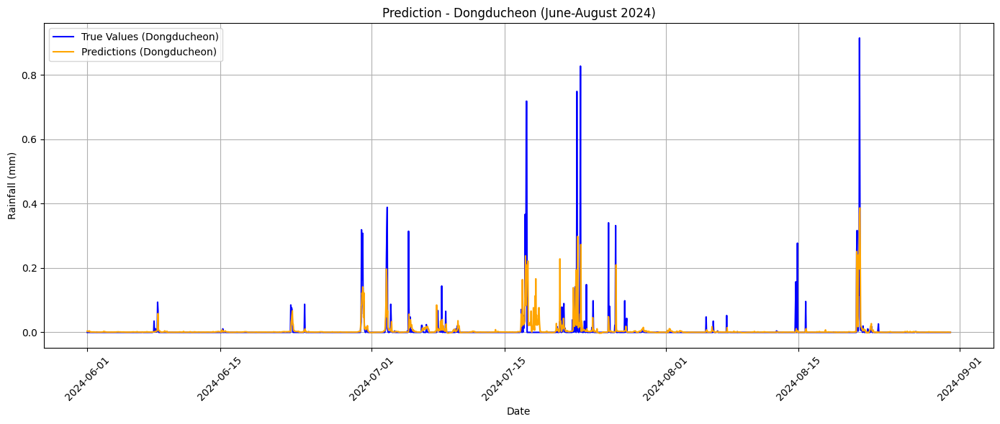

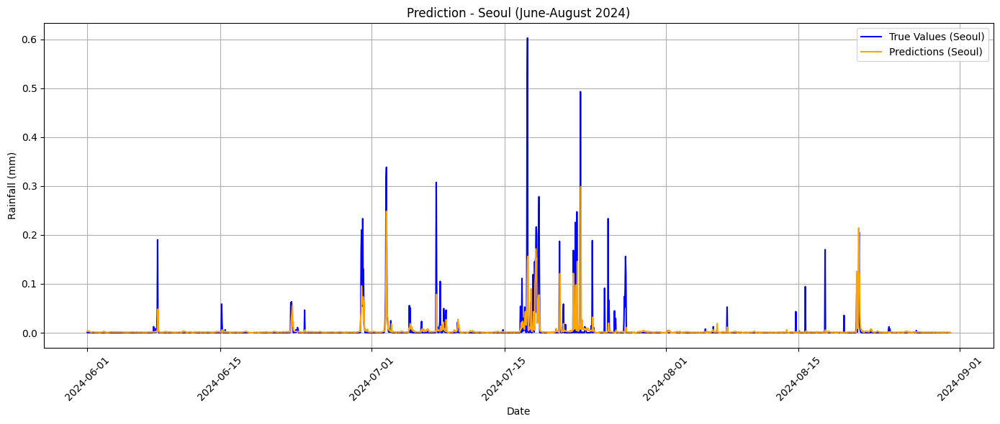

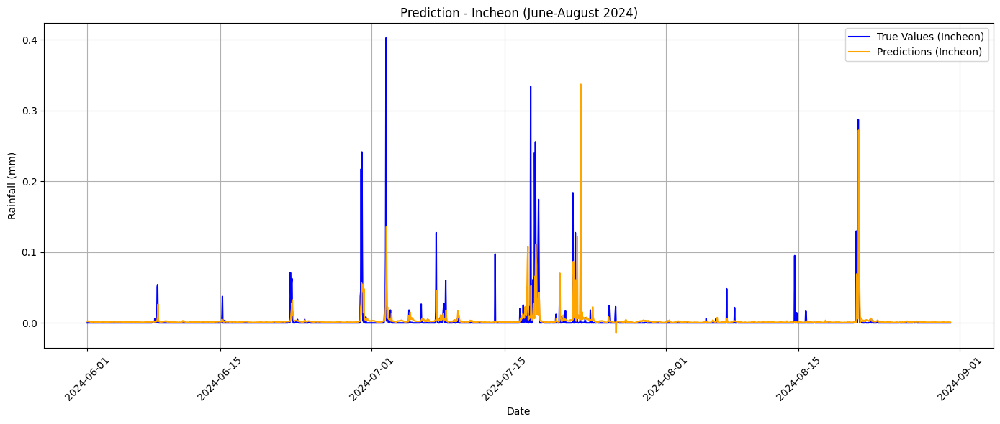

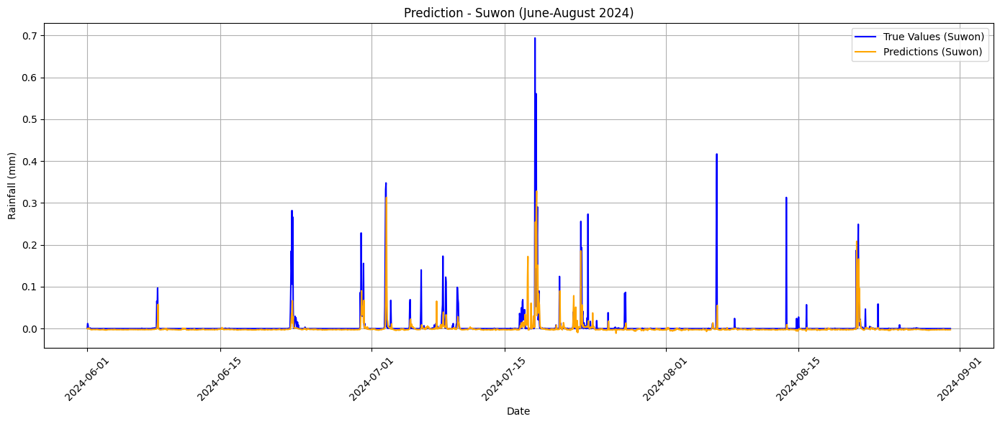

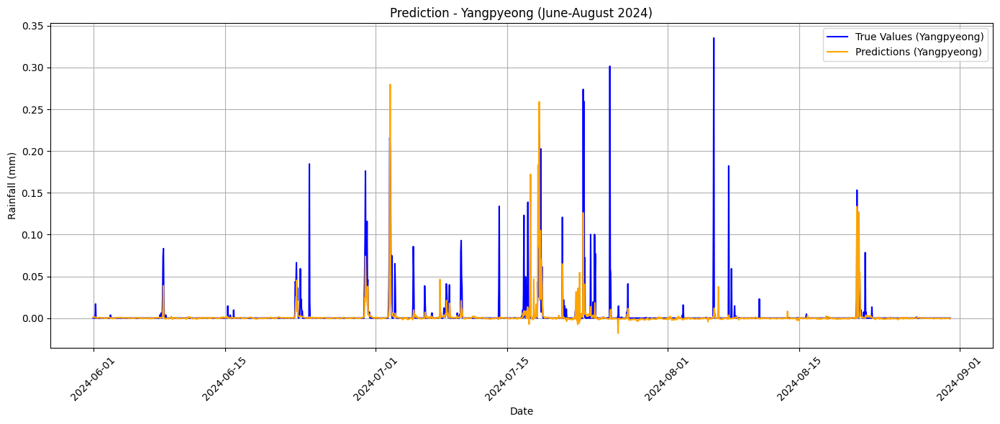

Best Parameters: {'learning_rate': 0.001, 'epochs': 100, 'embedding_size': 32}


ValueError: Found input variables with inconsistent numbers of samples: [5829, 14589]

In [ ]:
import pandas as pd

# file_paths에서 지역명을 추출
region_names = list(file_paths.keys())  # 지역명 리스트 ['Dongducheon', 'Seoul', 'Incheon', 'Suwon', 'Yangpyeong']

# 지역 개수를 설정 (file_paths에 있는 지역명 수)
num_regions = len(region_names)

# 최적의 하이퍼파라미터에 해당하는 key 생성
best_key = f"{best_params['learning_rate']}_{best_params['epochs']}_{best_params['embedding_size']}"

# 예측 결과를 지역별로 그리기 (2024년 6월~8월)
for region_idx in range(num_regions):
    plt.figure(figsize=(14, 6))

    # 각 지역별 전체 기간에 해당하는 데이터 필터링
    region_df = region_dfs[region_names[region_idx]]

    # 전체 기간의 타임스탬프를 가져옴 (true_values 크기에 맞게 타임스탬프 슬라이싱)
    region_dates = timestamp_1h[-len(true_values):]

    # 2024년 6월부터 8월까지의 데이터 필터링
    mask = (region_dates >= pd.Timestamp('2024-06-01')) & (region_dates <= pd.Timestamp('2024-08-31'))
    region_dates_filtered = region_dates[mask]

    # true_values와 predictions에서 해당 기간에 맞는 데이터 길이를 맞추기
    filtered_true_values = true_values[-len(region_dates):, region_idx][mask]  # 해당 기간의 실제 값
    filtered_predictions = predictions[best_key][-len(region_dates):, region_idx][mask]  # 해당 기간의 예측 값

    # 예측 및 실제 값 시각화 (2024년 6~8월)
    plt.plot(region_dates_filtered, filtered_true_values, label=f'True Values ({region_names[region_idx]})', color='blue')
    plt.plot(region_dates_filtered, filtered_predictions, label=f'Predictions ({region_names[region_idx]})', color='orange')

    # 그래프 제목과 축 설정 (지역명을 포함)
    plt.title(f'Prediction - {region_names[region_idx]} (June-August 2024)')
    plt.xlabel('Date')  # x축을 날짜로 설정
    plt.ylabel('Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)  # x축 레이블을 45도 회전
    plt.tight_layout()
    plt.show()

# 모델 성능 평가 출력 (전체 기간을 평가)
print(f"Best Parameters: {best_params}")
mae = mean_absolute_error(true_values, predictions[best_key])
rmse = np.sqrt(mean_squared_error(true_values, predictions[best_key]))
r2 = r2_score(true_values, predictions[best_key])
print(f"MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

<ipython-input-27-b85a4fd7ccc8>:33: UserWarning: Glyph 46041 (\N{HANGUL SYLLABLE DONG}) missing from current font.
  plt.tight_layout()
<ipython-input-27-b85a4fd7ccc8>:33: UserWarning: Glyph 46160 (\N{HANGUL SYLLABLE DU}) missing from current font.
  plt.tight_layout()
<ipython-input-27-b85a4fd7ccc8>:33: UserWarning: Glyph 52380 (\N{HANGUL SYLLABLE CEON}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 46041 (\N{HANGUL SYLLABLE DONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 46160 (\N{HANGUL SYLLABLE DU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 52380 (\N{HANGUL SYLLABLE CEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


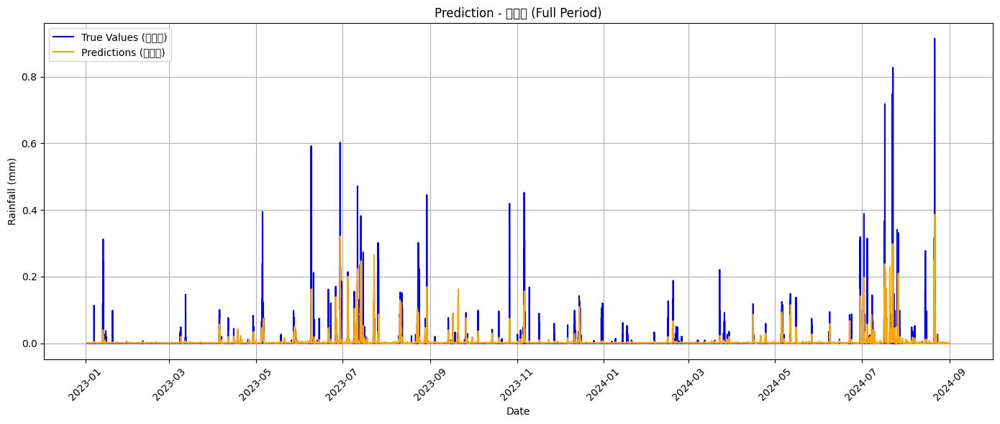

<ipython-input-27-b85a4fd7ccc8>:33: UserWarning: Glyph 49436 (\N{HANGUL SYLLABLE SEO}) missing from current font.
  plt.tight_layout()
<ipython-input-27-b85a4fd7ccc8>:33: UserWarning: Glyph 50872 (\N{HANGUL SYLLABLE UL}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49436 (\N{HANGUL SYLLABLE SEO}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50872 (\N{HANGUL SYLLABLE UL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


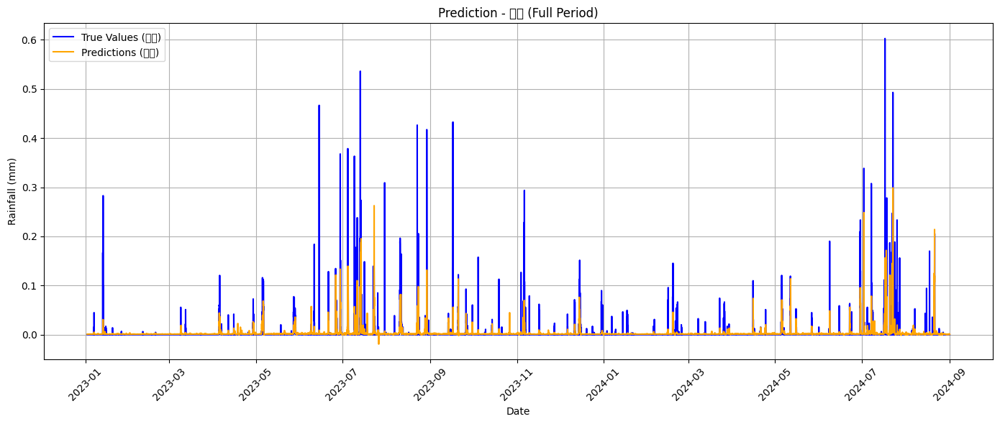

<ipython-input-27-b85a4fd7ccc8>:33: UserWarning: Glyph 51064 (\N{HANGUL SYLLABLE IN}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 51064 (\N{HANGUL SYLLABLE IN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


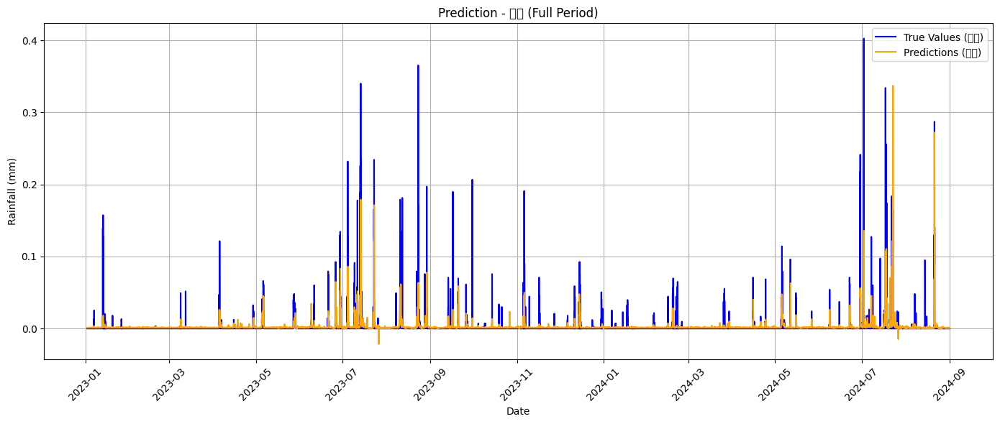

<ipython-input-27-b85a4fd7ccc8>:33: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from current font.
  plt.tight_layout()
<ipython-input-27-b85a4fd7ccc8>:33: UserWarning: Glyph 50896 (\N{HANGUL SYLLABLE WEON}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50896 (\N{HANGUL SYLLABLE WEON}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


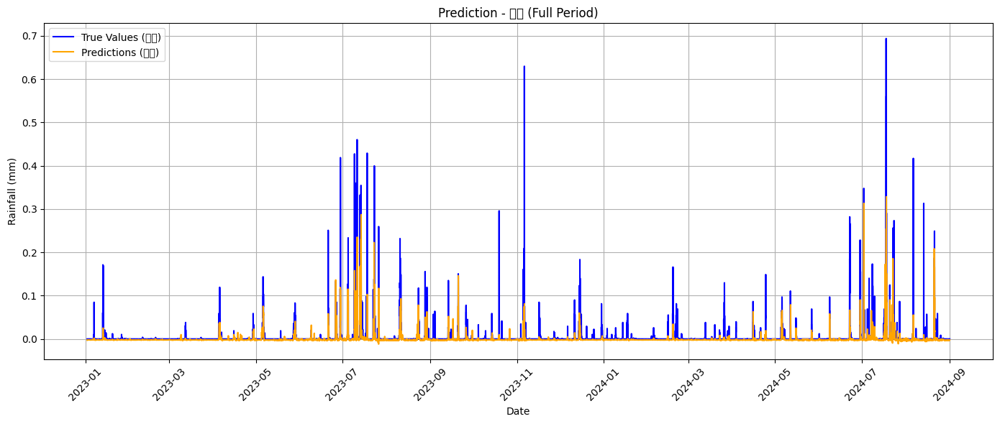

<ipython-input-27-b85a4fd7ccc8>:33: UserWarning: Glyph 50577 (\N{HANGUL SYLLABLE YANG}) missing from current font.
  plt.tight_layout()
<ipython-input-27-b85a4fd7ccc8>:33: UserWarning: Glyph 54217 (\N{HANGUL SYLLABLE PYEONG}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 50577 (\N{HANGUL SYLLABLE YANG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54217 (\N{HANGUL SYLLABLE PYEONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


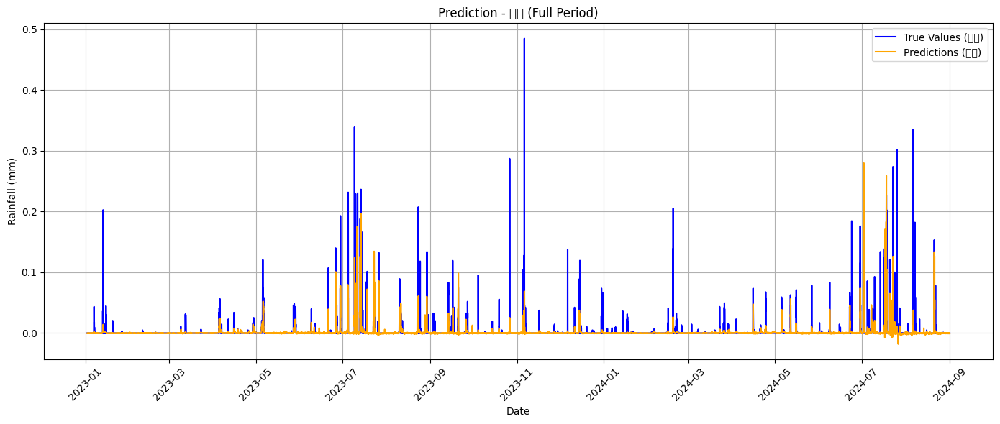

Best Parameters: {'learning_rate': 0.001, 'epochs': 100, 'embedding_size': 32}
MAE: 0.0035, RMSE: 0.0170, R2 Score: 0.2578


In [ ]:
# file_paths에서 지역명을 추출
region_names = list(file_paths.keys())  # 지역명 리스트 ['Dongducheon', 'Seoul', 'Incheon', 'Suwon', 'Yangpyeong']

# 지역 개수를 설정 (file_paths에 있는 지역명 수)
num_regions = len(region_names)

# 최적의 하이퍼파라미터에 해당하는 key 생성
best_key = f"{best_params['learning_rate']}_{best_params['epochs']}_{best_params['embedding_size']}"

# 예측 결과를 지역별로 그리기 (전체 기간)
for region_idx in range(num_regions):
    plt.figure(figsize=(14, 6))

    # 각 지역별 전체 기간에 해당하는 데이터 필터링
    region_df = region_dfs[region_names[region_idx]]

    # 전체 기간의 타임스탬프를 가져옴
    region_dates = timestamp_1h[-len(true_values):]  # true_values 크기에 맞게 타임스탬프 슬라이싱
    region_true_values = true_values[:, region_idx]  # 해당 지역의 실제 값
    region_predictions = predictions[best_key][:, region_idx]  # 해당 지역의 예측 값

    # 예측 및 실제 값 시각화 (전체 기간)
    plt.plot(region_dates, region_true_values, label=f'True Values ({region_names[region_idx]})', color='blue')
    plt.plot(region_dates, region_predictions, label=f'Predictions ({region_names[region_idx]})', color='orange')

    # 그래프 제목과 축 설정 (지역명을 포함)
    plt.title(f'Prediction - {region_names[region_idx]} (Full Period)')
    plt.xlabel('Date')  # x축을 날짜로 설정
    plt.ylabel('Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)  # x축 레이블을 45도 회전
    plt.tight_layout()
    plt.show()

# 최적의 하이퍼파라미터로 모델 성능 평가 출력
print(f"Best Parameters: {best_params}")
mae = mean_absolute_error(true_values, predictions[best_key])
rmse = np.sqrt(mean_squared_error(true_values, predictions[best_key]))
r2 = r2_score(true_values, predictions[best_key])
print(f"MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

##### 베스트 하이퍼파라미터로 훈련

In [ ]:
best_loss_1hour = float('inf')
best_model_1hour = None

In [ ]:
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    # 배치 단위로 학습 진행
    for batch_X, batch_Y in train_loader:
        batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)

        # Forward pass
        outputs = model(batch_X)

        # 마지막 타임스텝에서 예측한 값만 사용
        outputs = outputs[:, -1, :]  # (batch_size, output_size)

        # Loss 계산
        loss = criterion(outputs, batch_Y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Running loss 업데이트
        running_loss += loss.item()

    # 매 50 에포크마다 학습 손실 출력 및 평가
    if epoch % 50 == 0:
        avg_train_loss = running_loss / len(train_loader)
        print(f"Epoch [{epoch+1}/{num_epochs}], Training Loss: {avg_train_loss:.4f}")

        # 검증 단계에서 예측 수행 및 결과 저장
        model.eval()
        val_loss = 0.0
        predicted_values = []
        true_vals = []

        with torch.no_grad():
            for batch_X, batch_Y in test_loader:
                batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)
                outputs = model(batch_X)
                outputs = outputs[:, -1, :]
                loss = criterion(outputs, batch_Y)
                val_loss += loss.item()

                predicted_values.extend(outputs.cpu().numpy())
                true_vals.extend(batch_Y.cpu().numpy())

        # 예측값과 실제값 저장
        predicted_values = np.array(predicted_values)
        true_values = np.array(true_vals)

        avg_val_loss = val_loss / len(test_loader)
        mae = mean_absolute_error(true_vals, predicted_values)
        rmse = np.sqrt(mean_squared_error(true_vals, predicted_values))
        r2 = r2_score(true_vals, predicted_values)

        print(f"Validation Loss: {avg_val_loss:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

        # 최적의 모델 저장
        if avg_val_loss < best_loss_1hour:
            best_loss_1hour = avg_val_loss
            best_model_1hour = model.state_dict()

            # 최적의 모델 저장 메시지 출력
            print(f"New best model found with Train Loss: {loss:.4f}, Validation Loss: {best_loss_1hour:.4f}")

Epoch [1/1000], Training Loss: 0.0003
Validation Loss: 0.0003, MAE: 0.0034, RMSE: 0.0181, R2 Score: 0.2781
New best model found with Train Loss: 0.0000, Validation Loss: 0.0003
Epoch [51/1000], Training Loss: 0.0002
Validation Loss: 0.0003, MAE: 0.0038, RMSE: 0.0182, R2 Score: 0.2575
Epoch [101/1000], Training Loss: 0.0002
Validation Loss: 0.0003, MAE: 0.0041, RMSE: 0.0179, R2 Score: 0.2879
New best model found with Train Loss: 0.0000, Validation Loss: 0.0003
Epoch [151/1000], Training Loss: 0.0002
Validation Loss: 0.0003, MAE: 0.0033, RMSE: 0.0185, R2 Score: 0.2133
Epoch [201/1000], Training Loss: 0.0002
Validation Loss: 0.0003, MAE: 0.0040, RMSE: 0.0186, R2 Score: 0.2176
Epoch [251/1000], Training Loss: 0.0002
Validation Loss: 0.0003, MAE: 0.0030, RMSE: 0.0184, R2 Score: 0.2613
Epoch [301/1000], Training Loss: 0.0002
Validation Loss: 0.0004, MAE: 0.0033, RMSE: 0.0194, R2 Score: 0.1532
Epoch [351/1000], Training Loss: 0.0002
Validation Loss: 0.0004, MAE: 0.0038, RMSE: 0.0191, R2 Score

KeyboardInterrupt: 

In [ ]:
# 최적의 모델 저장 경로
best_model_path = './param/best_model_1h.pth'

# 최적의 모델 저장
torch.save(best_model_1hour, best_model_path)

print(f"Best model and parameters saved at {best_model_path}")

Best model and parameters saved at ./param/best_model_1h.pth


##### 확인

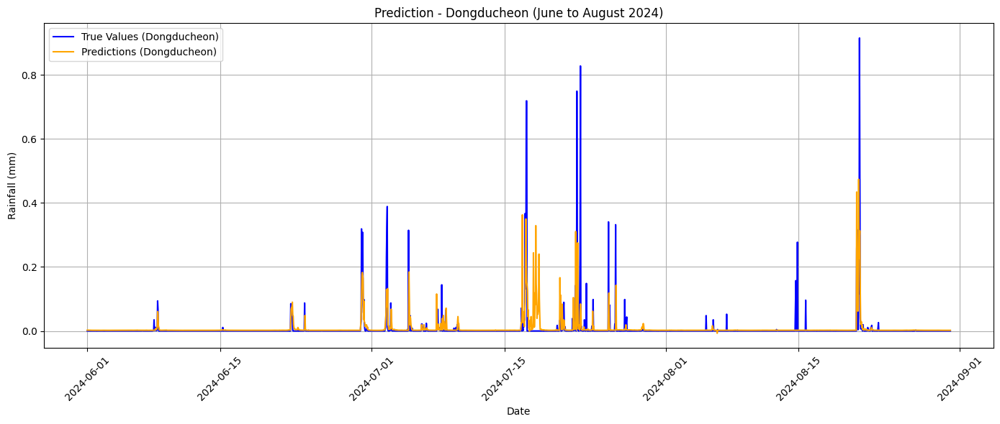

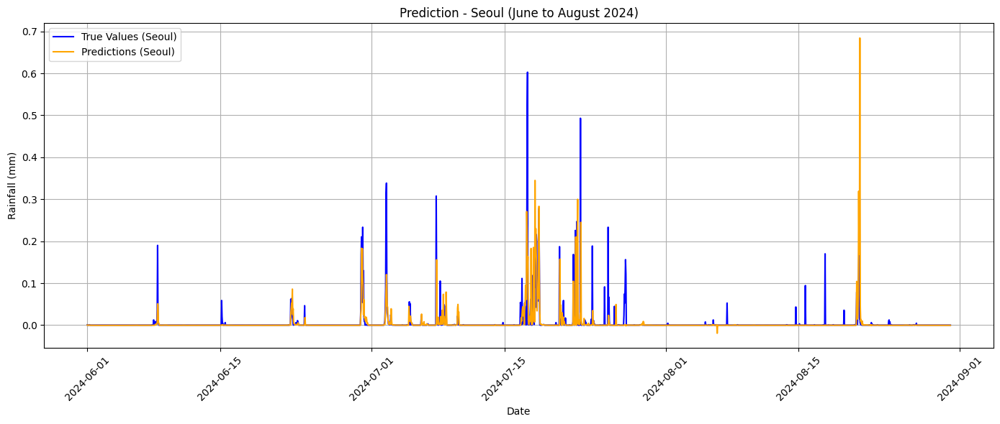

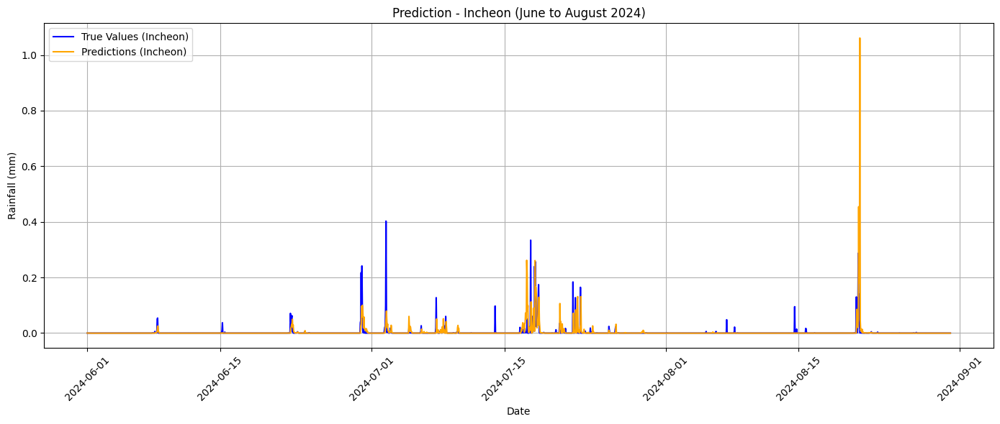

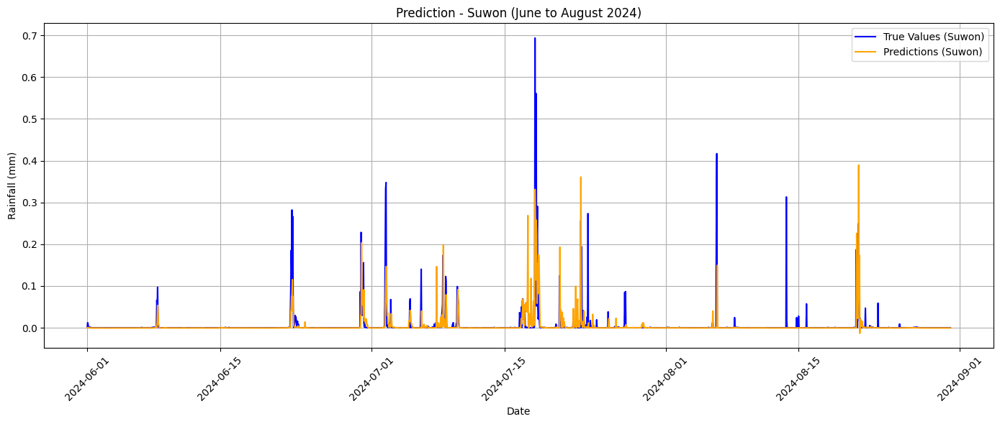

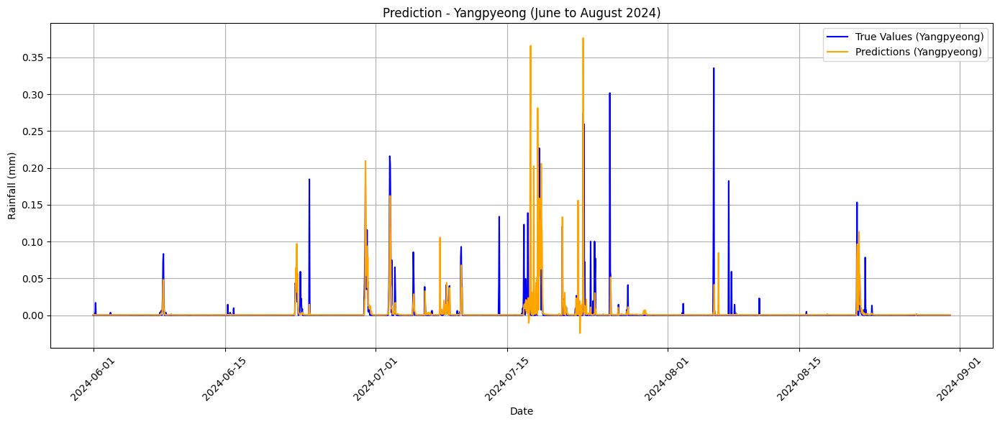

MAE: 0.0034, RMSE: 0.0205, R2 Score: -0.1050


In [ ]:
# 지역명 추출
region_names = list(file_paths.keys())
num_regions = len(region_names)

# 지역별로 그래프 그리기
for region_idx in range(num_regions):
    plt.figure(figsize=(14, 6))

    # 각 지역별 전체 기간에 해당하는 데이터 필터링
    region_df = region_dfs[region_names[region_idx]]

    # 전체 기간의 타임스탬프를 가져옴
    region_dates = timestamp_1h[-len(true_values):]

    # 2024년 6월부터 8월까지의 데이터 필터링
    mask = (region_dates >= pd.Timestamp('2024-06-01')) & (region_dates <= pd.Timestamp('2024-08-31'))
    region_dates_filtered = region_dates[mask]
    region_true_values = true_values[:, region_idx][mask]  # 해당 기간의 실제 값
    region_predictions = predicted_values[:, region_idx][mask]  # 해당 기간의 예측 값

    # 예측 및 실제 값 시각화 (2024년 6~8월)
    plt.plot(region_dates_filtered, region_true_values, label=f'True Values ({region_names[region_idx]})', color='blue')
    plt.plot(region_dates_filtered, region_predictions, label=f'Predictions ({region_names[region_idx]})', color='orange')

    # 그래프 제목과 축 설정 (지역명을 포함)
    plt.title(f'Prediction - {region_names[region_idx]} (June to August 2024)')
    plt.xlabel('Date')  # x축을 날짜로 설정
    plt.ylabel('Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)  # x축 레이블을 45도 회전
    plt.tight_layout()
    plt.show()

# 모델 성능 평가 출력 (전체 기간을 평가)
mae = mean_absolute_error(true_values, predicted_values)
rmse = np.sqrt(mean_squared_error(true_values, predicted_values))
r2 = r2_score(true_values, predicted_values)
print(f"MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

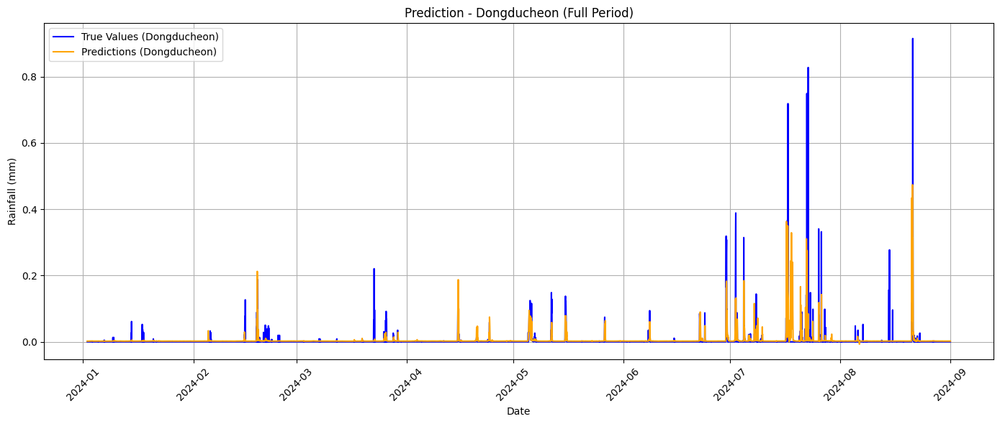

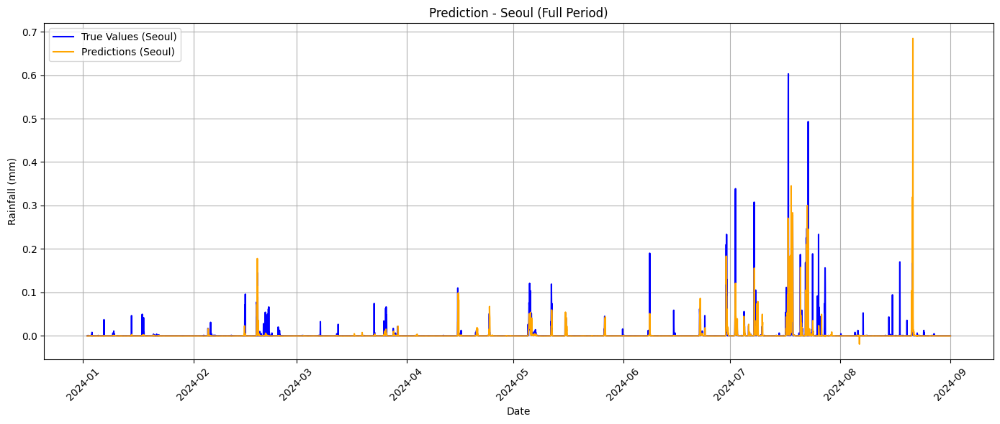

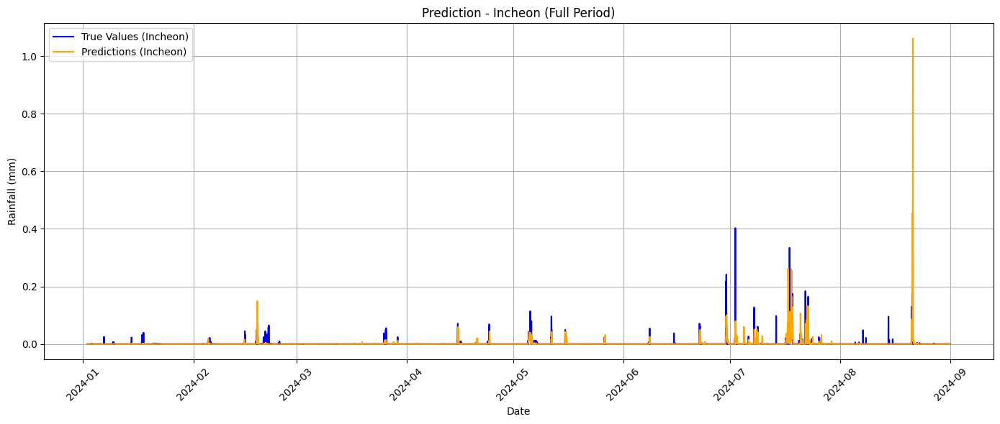

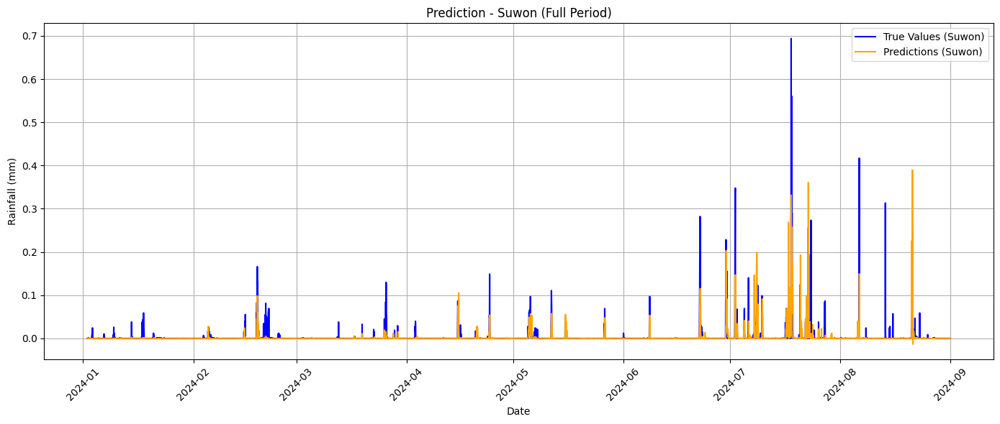

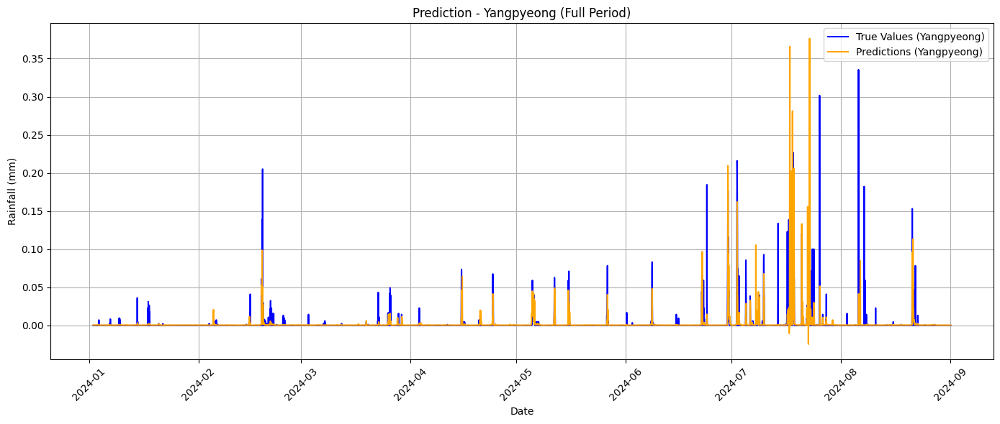

MAE: 0.0034, RMSE: 0.0205, R2 Score: -0.1050


In [ ]:
# 지역명 추출
region_names = list(file_paths.keys())
num_regions = len(region_names)

# 지역별로 그래프 그리기
for region_idx in range(num_regions):
    plt.figure(figsize=(14, 6))

    # 각 지역별 전체 기간에 해당하는 데이터 필터링
    region_df = region_dfs[region_names[region_idx]]

    # 전체 기간의 타임스탬프를 가져옴 (true_values 크기에 맞게 타임스탬프 슬라이싱)
    region_dates = timestamp_1h[-len(true_values):]
    region_true_values = true_values[:, region_idx]  # 해당 지역의 실제 값
    region_predictions = predicted_values[:, region_idx]  # 해당 지역의 예측 값

    # 예측 및 실제 값 시각화 (전체 기간)
    plt.plot(region_dates, region_true_values, label=f'True Values ({region_names[region_idx]})', color='blue')
    plt.plot(region_dates, region_predictions, label=f'Predictions ({region_names[region_idx]})', color='orange')

    # 그래프 제목과 축 설정 (지역명을 포함)
    plt.title(f'Prediction - {region_names[region_idx]} (Full Period)')
    plt.xlabel('Date')  # x축을 날짜로 설정
    plt.ylabel('Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)  # x축 레이블을 45도 회전
    plt.tight_layout()
    plt.show()

# 모델 성능 평가 출력
mae = mean_absolute_error(true_values, predicted_values)
rmse = np.sqrt(mean_squared_error(true_values, predicted_values))
r2 = r2_score(true_values, predicted_values)
print(f"MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

### 1시간 단위 예측 (2개년)

##### 데이터 불러오기

In [ ]:
# 지역별 파일
file_paths = {
    'Dongducheon': './data/preprocessed_df_98_filled.csv',
    'Seoul': './data/preprocessed_df_108_filled.csv',
    'Incheon': './data/preprocessed_df_112_filled.csv',
    'Suwon': './data/preprocessed_df_119_filled.csv',
    'Yangpyeong': './data/preprocessed_df_202_filled.csv',
}

meta_data = {
    'TM': '관측시간(KST)',
    'TA': '기온(C)',
    'WS': '풍속(m/s)',
    'HM': '상대습도(%)',
    'PV': '수증기압(hPa)',
    'TD': '이슬점온도(C)',
    'PA': '현지기압(hPa)',
    'CA_MID': '중하층운량(1/10)',
    'RN': '강수량(mm)'
}

features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'RN']  # 기상 변수
minmax_features = ['CA_MID', 'RN']  # MinMaxScaler 적용할 피처들
remaining_features = list(set(features) - set(minmax_features))  # StandardScaler 적용할 피처들

# 각 지역의 데이터를 저장할 딕셔너리
region_dfs = {}
original_data = {}
scaled_data = []
scalers = {}

# 각 지역의 데이터를 읽고 처리
for region, file_path in file_paths.items():
    # 파일에서 데이터 읽기
    df = pd.read_csv(file_path)

    df['TM'] = pd.to_datetime(df['TM'], format='%Y-%m-%d %H:%M:%S')
    df = df[(df['TM'].dt.year == 2022) | (df['TM'].dt.year == 2023) | (df['TM'].dt.year == 2024)]

    # 스케일링 전 데이터를 저장
    original_data[region] = df[features + ['TM']].copy()

    # 지정된 피처만 선택
    region_data = df[features].copy()
    region_data['TM'] = df['TM']  # 시간 데이터 유지

    # MinMaxScaler는 'CA_MID', 'RN' 피처에 적용
    scaler_minmax = MinMaxScaler()
    region_data[minmax_features] = scaler_minmax.fit_transform(region_data[minmax_features])

    # StandardScaler는 나머지 피처에 적용
    scaler_standard = StandardScaler()
    region_data[remaining_features] = scaler_standard.fit_transform(region_data[remaining_features])

    # 스케일링된 데이터를 다시 저장
    region_dfs[region] = region_data  # 스케일링된 데이터 저장
    scaled_data.append(region_data)   # 각 지역의 스케일링된 데이터를 리스트에 추가
    scalers[region] = {'minmax': scaler_minmax, 'standard': scaler_standard}  # 각 스케일러 저장

# 스케일링된 데이터를 3차원으로 스택 (num_samples, num_features, num_regions)
scaled_data = np.stack(scaled_data, axis=-1)

# 서울 데이터를 기준으로 시각화
df_original = original_data['Seoul']  # 스케일링 전 데이터
df_scaled = region_dfs['Seoul']       # 스케일링 후 데이터
timestamp_1h = df_original['TM']

In [ ]:
seq_length = 28

def sliding_windows(data_X, data_y, seq_length):
    x = []
    y = []
    for i in range(len(data_X) - seq_length):
        _x = data_X[i:(i + seq_length)]
        _y = data_y[i + seq_length]
        x.append(_x)
        y.append(_y)
    return np.array(x, dtype=np.float32), np.array(y, dtype=np.float32)

In [ ]:
# 2024년을 기준으로 데이터를 분리하기 위한 마스크 생성
train_mask = df['TM'] < '2024-01-01'
test_mask = df['TM'] >= '2024-01-01'

# X_scaled와 y_scaled로 나누기 (타겟은 강수량)
X_scaled = scaled_data[:, :-1, :]  # 입력 변수 (시간은 제외)
y_scaled = scaled_data[:, -2, :]  # 타겟 변수 (강수량)

# 먼저 train/test 데이터를 슬라이딩 윈도우 전에 나눔
X_train = X_scaled[train_mask]
y_train = y_scaled[train_mask]

X_test = X_scaled[test_mask]
y_test = y_scaled[test_mask]

# 슬라이딩 윈도우 적용 (train/test 각각에 대해)
trainX, trainY = sliding_windows(X_train, y_train, seq_length)
testX, testY = sliding_windows(X_test, y_test, seq_length)

# Train/Test 데이터를 Torch Tensor로 변환
trainX = torch.Tensor(trainX)
trainY = torch.Tensor(trainY)

testX = torch.Tensor(testX)
testY = torch.Tensor(testY)

# 데이터 크기 확인
print("Training Data X Shape:", trainX.shape)
print("Training Data Y Shape:", trainY.shape)
print("Test Data X Shape:", testX.shape)
print("Test Data Y Shape:", testY.shape)

Training Data X Shape: torch.Size([17492, 28, 8, 5])
Training Data Y Shape: torch.Size([17492, 5])
Test Data X Shape: torch.Size([5829, 28, 8, 5])
Test Data Y Shape: torch.Size([5829, 5])


In [ ]:
# TensorDataset 생성
train_dataset = TensorDataset(trainX, trainY)
test_dataset = TensorDataset(testX, testY)

# DataLoader를 사용하여 배치 사이즈 설정
batch_size = 64  # 미니배치 사이즈를 설정
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

##### 훈련

In [ ]:
# Hyperparameters
num_epochs = 1000
learning_rate = 0.001
input_size = trainX.shape[3] * len(features)  # 입력 피처 크기 (8 * 5)
embed_size = 32
num_layers = 3
output_size = trainY.shape[1]  # 타겟 크기 (5)

In [ ]:
# GPU 사용 가능하면 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Training on device: {device}")

# 모델 초기화
model = Transformer(input_size, embed_size, output_size, num_layers).to(device)

# 손실 함수 및 최적화 기법
criterion = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, betas = (0.9, 0.999))

testX, testY = testX.to(device), testY.to(device)

Training on device: cuda


In [ ]:
best_loss_1hour_2year = float('inf')
best_model_1hour_2year = None

In [ ]:
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    # 배치 단위로 학습 진행
    for batch_X, batch_Y in train_loader:
        batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)

        # Forward pass
        outputs = model(batch_X)

        # 마지막 타임스텝에서 예측한 값만 사용
        outputs = outputs[:, -1, :]  # (batch_size, output_size)

        # Loss 계산
        loss = criterion(outputs, batch_Y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Running loss 업데이트
        running_loss += loss.item()

    # 매 50 에포크마다 학습 손실 출력 및 평가
    if epoch % 50 == 0:
        avg_train_loss = running_loss / len(train_loader)
        print(f"Epoch [{epoch+1}/{num_epochs}], Training Loss: {avg_train_loss:.4f}")

        # 검증 단계에서 예측 수행 및 결과 저장
        model.eval()
        val_loss = 0.0
        predicted_values = []
        true_vals = []

        with torch.no_grad():
            for batch_X, batch_Y in test_loader:
                batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)
                outputs = model(batch_X)
                outputs = outputs[:, -1, :]
                loss = criterion(outputs, batch_Y)
                val_loss += loss.item()

                predicted_values.extend(outputs.cpu().numpy())
                true_vals.extend(batch_Y.cpu().numpy())

        # 예측값과 실제값 저장
        predicted_values = np.array(predicted_values)
        true_values = np.array(true_vals)

        avg_val_loss = val_loss / len(test_loader)
        mae = mean_absolute_error(true_vals, predicted_values)
        rmse = np.sqrt(mean_squared_error(true_vals, predicted_values))
        r2 = r2_score(true_vals, predicted_values)

        print(f"Validation Loss: {avg_val_loss:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

        # 최적의 모델 저장
        if avg_val_loss < best_loss_1hour_2year:
            best_loss_1hour_2year = avg_val_loss
            best_model_1hour_2year = model.state_dict()

            # 최적의 모델 저장 메시지 출력
            print(f"New best model found with Train Loss: {loss:.4f}, Validation Loss: {best_loss_1hour_2year:.4f}")

Epoch [1/1000], Training Loss: 0.0147
Validation Loss: 0.0008, MAE: 0.0147, RMSE: 0.0276, R2 Score: -0.5514
New best model found with Train Loss: 0.0001, Validation Loss: 0.0003
Epoch [51/1000], Training Loss: 0.0005
Validation Loss: 0.0005, MAE: 0.0073, RMSE: 0.0218, R2 Score: 0.0758
New best model found with Train Loss: 0.0000, Validation Loss: 0.0003
Epoch [101/1000], Training Loss: 0.0004
Validation Loss: 0.0005, MAE: 0.0057, RMSE: 0.0220, R2 Score: 0.1454
Epoch [151/1000], Training Loss: 0.0003
Validation Loss: 0.0005, MAE: 0.0043, RMSE: 0.0226, R2 Score: 0.1293
Epoch [201/1000], Training Loss: 0.0003
Validation Loss: 0.0005, MAE: 0.0049, RMSE: 0.0221, R2 Score: 0.1282
Epoch [251/1000], Training Loss: 0.0002
Validation Loss: 0.0005, MAE: 0.0052, RMSE: 0.0230, R2 Score: 0.0000
Epoch [301/1000], Training Loss: 0.0002
Validation Loss: 0.0005, MAE: 0.0050, RMSE: 0.0228, R2 Score: -0.0369
Epoch [351/1000], Training Loss: 0.0002
Validation Loss: 0.0005, MAE: 0.0050, RMSE: 0.0218, R2 Sco

KeyboardInterrupt: 

In [ ]:
# 최적의 모델 저장 경로
best_model_path = './param/best_model_1h_2y.pth'

# 최적의 모델 저장
torch.save(best_model_1hour_2year, best_model_path)

print(f"Best model and parameters saved at {best_model_path}")

Best model and parameters saved at ./param/best_model_1h_2y.pth


##### 확인

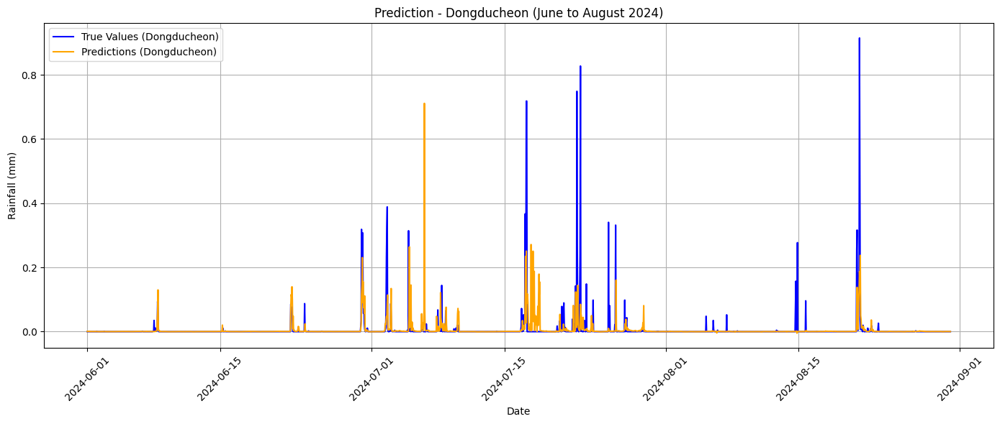

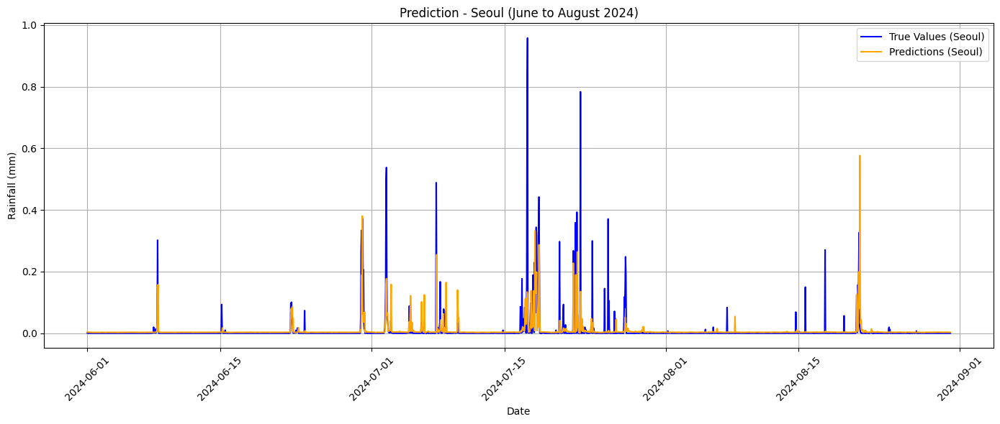

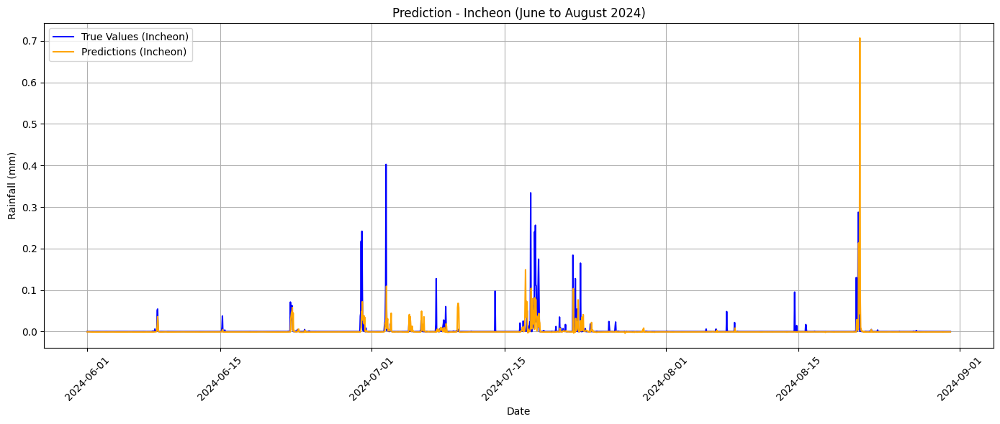

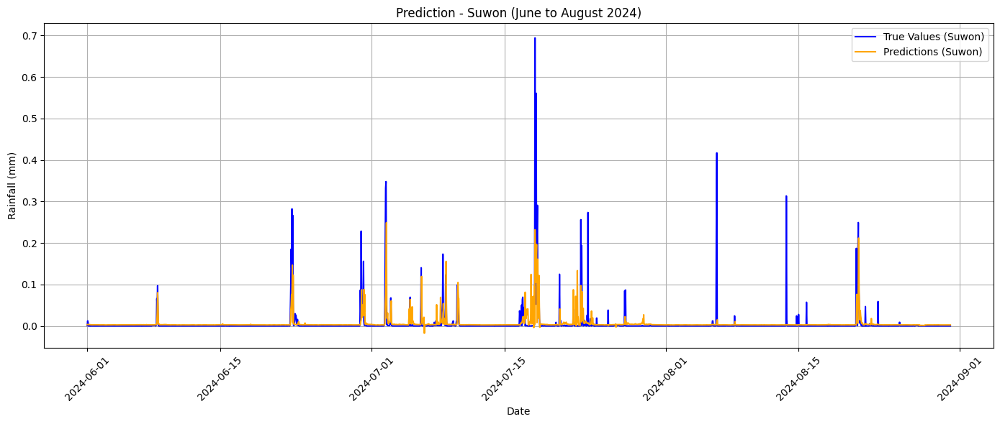

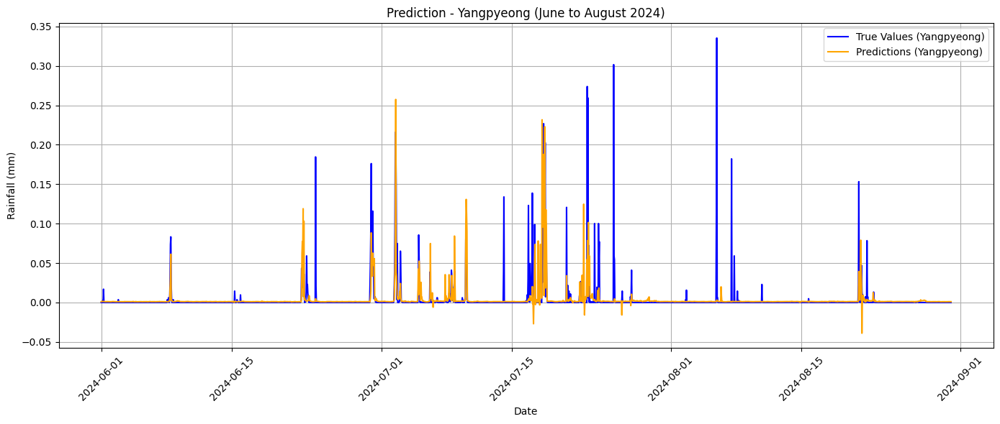

MAE: 0.0045, RMSE: 0.0224, R2 Score: 0.0767


In [ ]:
# 지역명 추출
region_names = list(file_paths.keys())
num_regions = len(region_names)

# 지역별로 그래프 그리기
for region_idx in range(num_regions):
    plt.figure(figsize=(14, 6))

    # 각 지역별 전체 기간에 해당하는 데이터 필터링
    region_df = region_dfs[region_names[region_idx]]

    # 전체 기간의 타임스탬프를 가져옴
    region_dates = timestamp_1h[-len(true_values):]

    # 2024년 6월부터 8월까지의 데이터 필터링
    mask = (region_dates >= pd.Timestamp('2024-06-01')) & (region_dates <= pd.Timestamp('2024-08-31'))
    region_dates_filtered = region_dates[mask]
    region_true_values = true_values[:, region_idx][mask]  # 해당 기간의 실제 값
    region_predictions = predicted_values[:, region_idx][mask]  # 해당 기간의 예측 값

    # 예측 및 실제 값 시각화 (2024년 6~8월)
    plt.plot(region_dates_filtered, region_true_values, label=f'True Values ({region_names[region_idx]})', color='blue')
    plt.plot(region_dates_filtered, region_predictions, label=f'Predictions ({region_names[region_idx]})', color='orange')

    # 그래프 제목과 축 설정 (지역명을 포함)
    plt.title(f'Prediction - {region_names[region_idx]} (June to August 2024)')
    plt.xlabel('Date')  # x축을 날짜로 설정
    plt.ylabel('Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)  # x축 레이블을 45도 회전
    plt.tight_layout()
    plt.show()

# 모델 성능 평가 출력 (전체 기간을 평가)
mae = mean_absolute_error(true_values, predicted_values)
rmse = np.sqrt(mean_squared_error(true_values, predicted_values))
r2 = r2_score(true_values, predicted_values)
print(f"MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

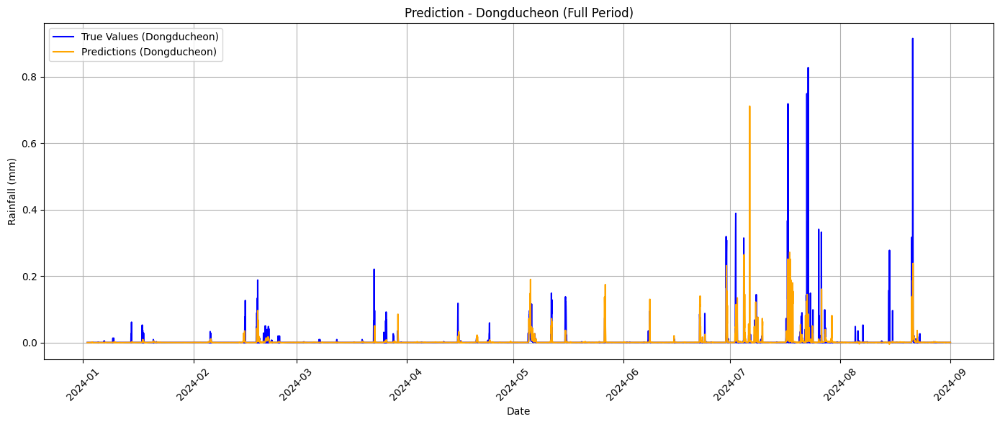

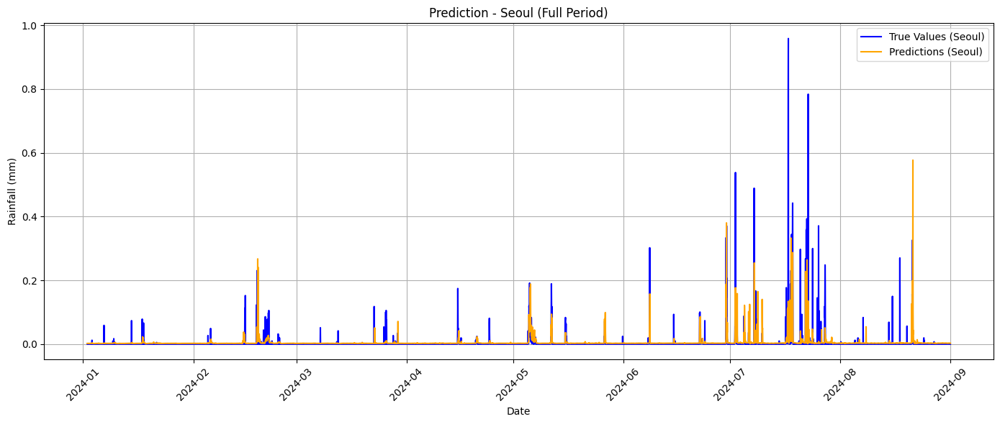

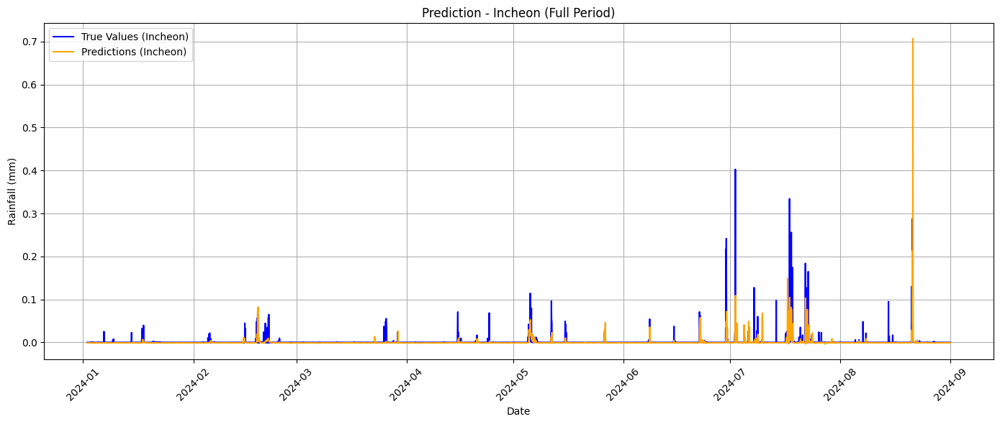

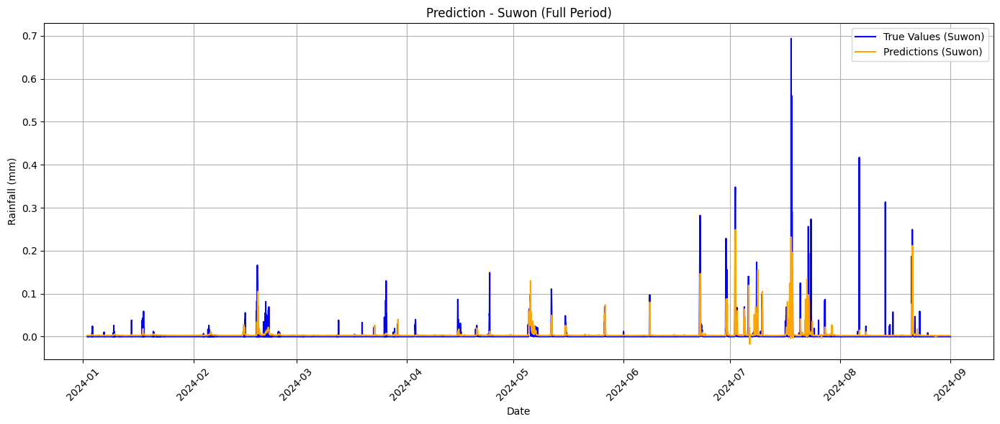

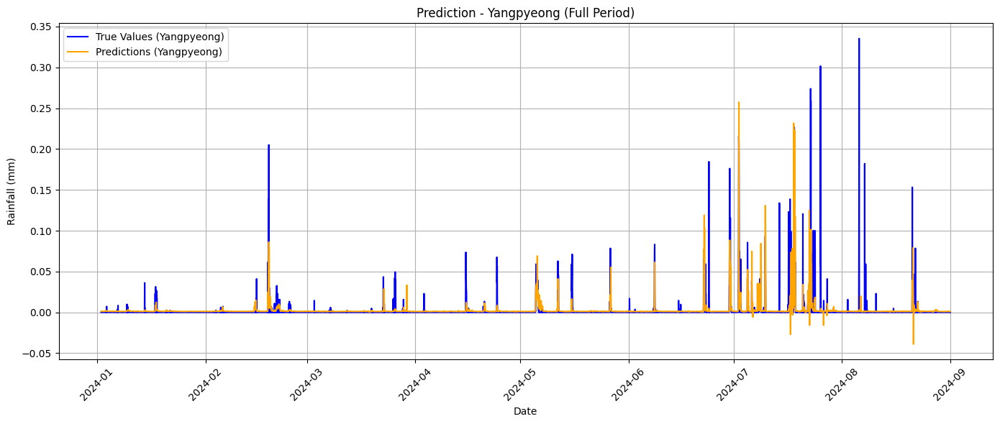

MAE: 0.0045, RMSE: 0.0224, R2 Score: 0.0767


In [ ]:
# 지역명 추출
region_names = list(file_paths.keys())
num_regions = len(region_names)

# 지역별로 그래프 그리기
for region_idx in range(num_regions):
    plt.figure(figsize=(14, 6))

    # 각 지역별 전체 기간에 해당하는 데이터 필터링
    region_df = region_dfs[region_names[region_idx]]

    # 전체 기간의 타임스탬프를 가져옴 (true_values 크기에 맞게 타임스탬프 슬라이싱)
    region_dates = timestamp_1h[-len(true_values):]
    region_true_values = true_values[:, region_idx]  # 해당 지역의 실제 값
    region_predictions = predicted_values[:, region_idx]  # 해당 지역의 예측 값

    # 예측 및 실제 값 시각화 (전체 기간)
    plt.plot(region_dates, region_true_values, label=f'True Values ({region_names[region_idx]})', color='blue')
    plt.plot(region_dates, region_predictions, label=f'Predictions ({region_names[region_idx]})', color='orange')

    # 그래프 제목과 축 설정 (지역명을 포함)
    plt.title(f'Prediction - {region_names[region_idx]} (Full Period)')
    plt.xlabel('Date')  # x축을 날짜로 설정
    plt.ylabel('Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)  # x축 레이블을 45도 회전
    plt.tight_layout()
    plt.show()

# 모델 성능 평가 출력
mae = mean_absolute_error(true_values, predicted_values)
rmse = np.sqrt(mean_squared_error(true_values, predicted_values))
r2 = r2_score(true_values, predicted_values)
print(f"MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

### 6시간 단위 예측

##### 데이터 불러오기

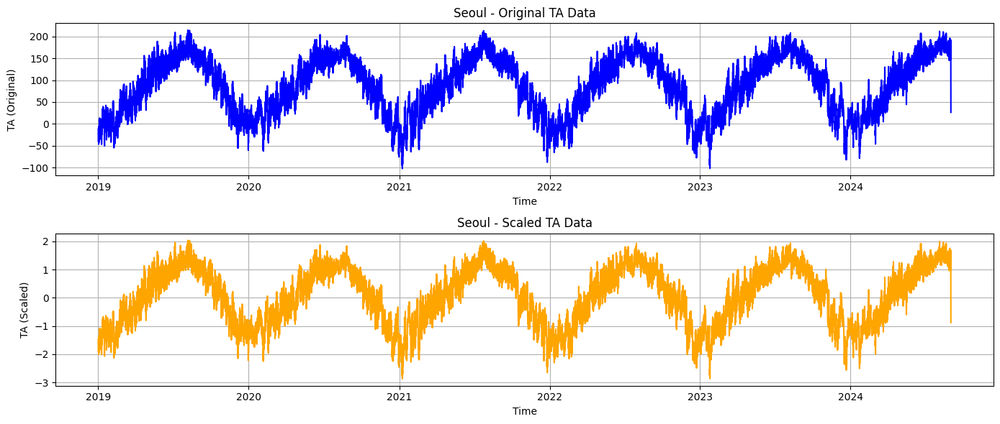

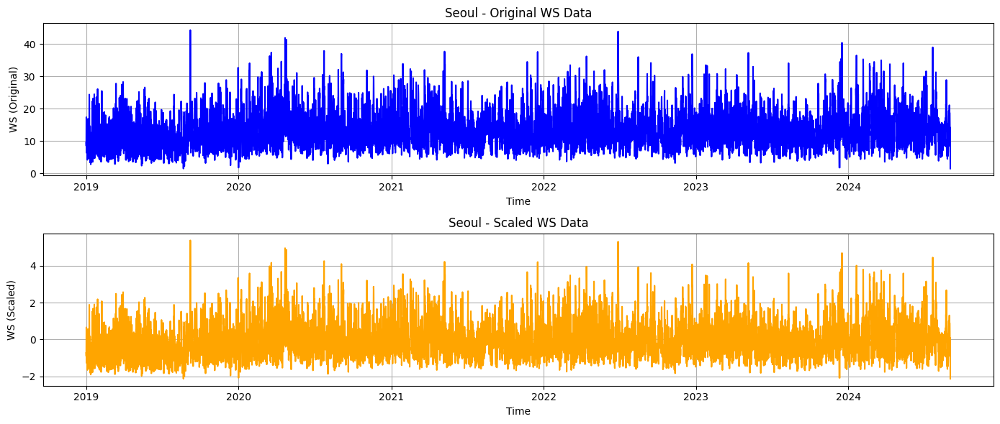

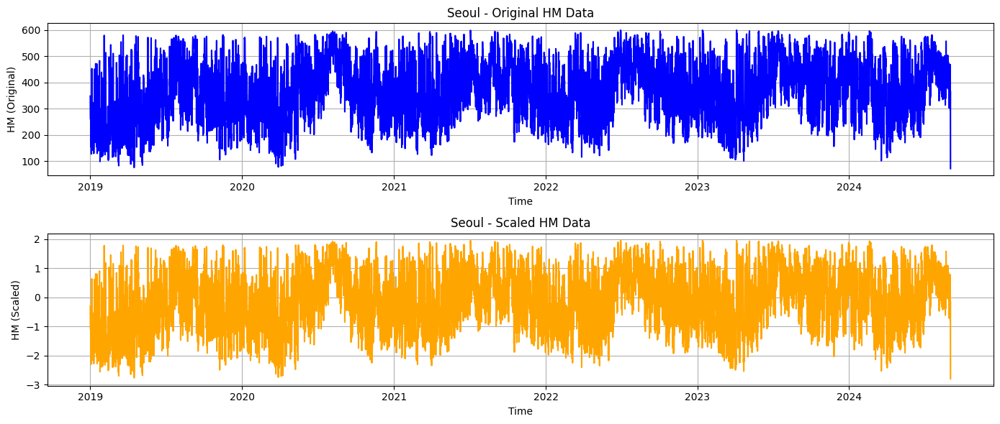

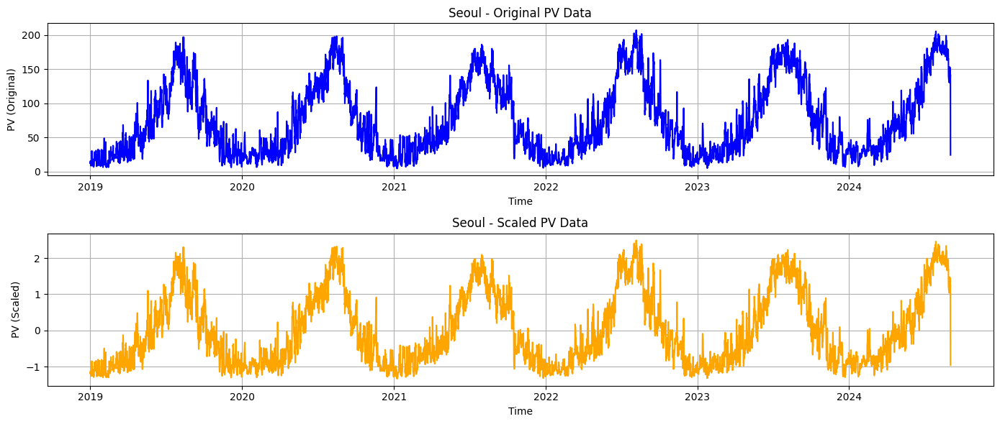

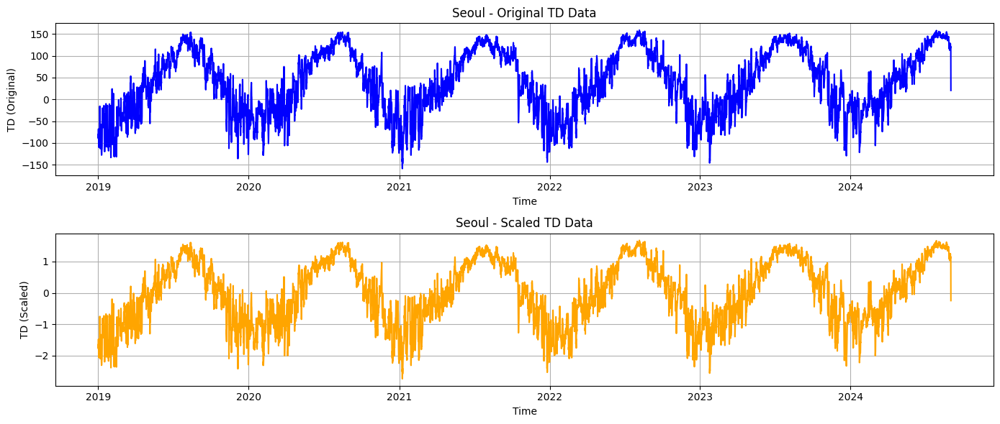

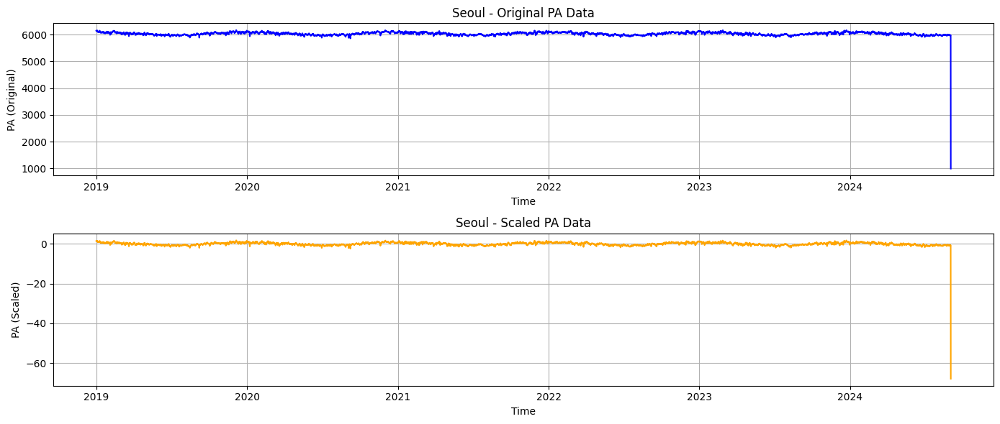

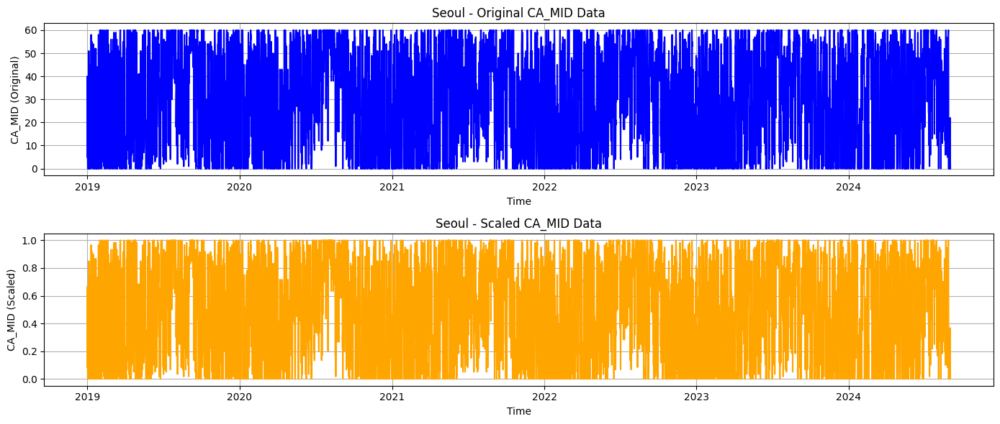

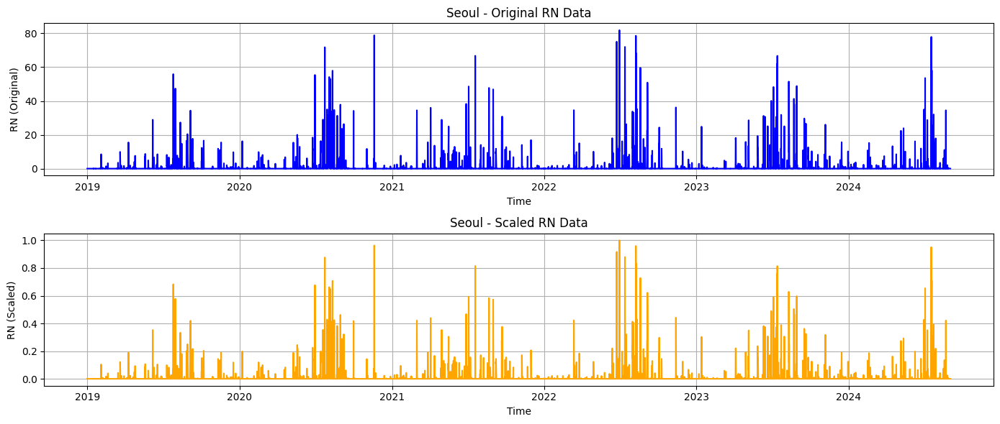

In [ ]:
# 지역별 파일
file_paths = {
    'Dongducheon': './data/preprocessed_df_98_filled_6h.csv',
    'Seoul': './data/preprocessed_df_108_filled_6h.csv',
    'Incheon': './data/preprocessed_df_112_filled_6h.csv',
    'Suwon': './data/preprocessed_df_119_filled_6h.csv',
    'Yangpyeong': './data/preprocessed_df_202_filled_6h.csv',
}

meta_data = {
    'TM': '관측시간(KST)',
    'TA': '기온(C)',
    'WS': '풍속(m/s)',
    'HM': '상대습도(%)',
    'PV': '수증기압(hPa)',
    'TD': '이슬점온도(C)',
    'PA': '현지기압(hPa)',
    'CA_MID': '중하층운량(1/10)',
    'RN': '강수량(mm)'
}

features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'RN']  # 기상 변수
minmax_features = ['CA_MID', 'RN']  # MinMaxScaler 적용할 피처들
remaining_features = list(set(features) - set(minmax_features))  # StandardScaler 적용할 피처들

# 각 지역의 데이터를 저장할 딕셔너리
region_dfs = {}
original_data = {}
scaled_data = []
scalers = {}

# 각 지역의 데이터를 읽고 처리
for region, file_path in file_paths.items():
    # 파일에서 데이터 읽기
    df = pd.read_csv(file_path)

    df['TM'] = pd.to_datetime(df['TM'], format='%Y-%m-%d %H:%M:%S')

    # 스케일링 전 데이터를 저장
    original_data[region] = df[features + ['TM']].copy()

    # 지정된 피처만 선택
    region_data = df[features].copy()
    region_data['TM'] = df['TM']  # 시간 데이터 유지

    # MinMaxScaler는 'CA_MID', 'RN' 피처에 적용
    scaler_minmax = MinMaxScaler()
    region_data[minmax_features] = scaler_minmax.fit_transform(region_data[minmax_features])

    # StandardScaler는 나머지 피처에 적용
    scaler_standard = StandardScaler()
    region_data[remaining_features] = scaler_standard.fit_transform(region_data[remaining_features])

    # 스케일링된 데이터를 다시 저장
    region_dfs[region] = region_data  # 스케일링된 데이터 저장
    scaled_data.append(region_data)   # 각 지역의 스케일링된 데이터를 리스트에 추가
    scalers[region] = {'minmax': scaler_minmax, 'standard': scaler_standard}  # 각 스케일러 저장

# 스케일링된 데이터를 3차원으로 스택 (num_samples, num_features, num_regions)
scaled_data = np.stack(scaled_data, axis=-1)

# 서울 데이터를 기준으로 시각화
df_original = original_data['Seoul']  # 스케일링 전 데이터
df_scaled = region_dfs['Seoul']       # 스케일링 후 데이터
timestamp_6h = df_original['TM']

# 각 피처에 대한 스케일링 전후의 시각화를 개별적으로 수행
for col in features:
    plt.figure(figsize=(14, 6))

    # 스케일링 전 (원본) 데이터 시각화
    plt.subplot(2, 1, 1)
    plt.plot(df_original['TM'], df_original[col], label=f'Original {col}', color='blue')
    plt.title(f'Seoul - Original {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col} (Original)')
    plt.grid(True)

    # 스케일링 후 데이터 시각화
    plt.subplot(2, 1, 2)
    plt.plot(df_scaled['TM'], df_scaled[col], label=f'Scaled {col}', color='orange')
    plt.title(f'Seoul - Scaled {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col} (Scaled)')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

In [ ]:
seq_length = 28

def sliding_windows(data_X, data_y, seq_length):
    x = []
    y = []
    for i in range(len(data_X) - seq_length):
        _x = data_X[i:(i + seq_length)]
        _y = data_y[i + seq_length]
        x.append(_x)
        y.append(_y)
    return np.array(x, dtype=np.float32), np.array(y, dtype=np.float32)

In [ ]:
# 2024년을 기준으로 데이터를 분리하기 위한 마스크 생성
train_mask = df['TM'] < '2024-01-01'
test_mask = df['TM'] >= '2024-01-01'

# X_scaled와 y_scaled로 나누기 (타겟은 강수량)
X_scaled = scaled_data[:, :-1, :]  # 입력 변수 (시간은 제외)
y_scaled = scaled_data[:, -2, :]  # 타겟 변수 (강수량)

# 먼저 train/test 데이터를 슬라이딩 윈도우 전에 나눔
X_train = X_scaled[train_mask]
y_train = y_scaled[train_mask]

X_test = X_scaled[test_mask]
y_test = y_scaled[test_mask]

# 슬라이딩 윈도우 적용 (train/test 각각에 대해)
trainX, trainY = sliding_windows(X_train, y_train, seq_length)
testX, testY = sliding_windows(X_test, y_test, seq_length)

# Train/Test 데이터를 Torch Tensor로 변환
trainX = torch.Tensor(trainX)
trainY = torch.Tensor(trainY)

testX = torch.Tensor(testX)
testY = torch.Tensor(testY)

# 데이터 크기 확인
print("Training Data X Shape:", trainX.shape)
print("Training Data Y Shape:", trainY.shape)
print("Test Data X Shape:", testX.shape)
print("Test Data Y Shape:", testY.shape)

Training Data X Shape: torch.Size([7276, 28, 8, 5])
Training Data Y Shape: torch.Size([7276, 5])
Test Data X Shape: torch.Size([949, 28, 8, 5])
Test Data Y Shape: torch.Size([949, 5])


In [ ]:
# TensorDataset 생성
train_dataset = TensorDataset(trainX, trainY)
test_dataset = TensorDataset(testX, testY)

# DataLoader를 사용하여 배치 사이즈 설정
batch_size = 64  # 미니배치 사이즈를 설정
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

##### 훈련

In [ ]:
# Hyperparameters
num_epochs = 500
learning_rate = 0.001
input_size = trainX.shape[3] * len(features)  # 입력 피처 크기 (8 * 5)
embed_size = 32
num_layers = 3
output_size = trainY.shape[1]  # 타겟 크기 (5)

In [ ]:
# GPU 사용 가능하면 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Training on device: {device}")

# 모델 초기화
model = Transformer(input_size, embed_size, output_size, num_layers).to(device)

# 손실 함수 및 최적화 기법
criterion = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, betas = (0.9, 0.999))

testX, testY = testX.to(device), testY.to(device)

Training on device: cuda


In [ ]:
best_loss_6hour = float('inf')
best_model_6hour = None

In [ ]:
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    # 배치 단위로 학습 진행
    for batch_X, batch_Y in train_loader:
        batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)

        # Forward pass
        outputs = model(batch_X)

        # 마지막 타임스텝에서 예측한 값만 사용
        outputs = outputs[:, -1, :]  # (batch_size, output_size)

        # Loss 계산
        loss = criterion(outputs, batch_Y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Running loss 업데이트
        running_loss += loss.item()

    # 매 50 에포크마다 학습 손실 출력 및 평가
    if epoch % 50 == 0:
        avg_train_loss = running_loss / len(train_loader)
        print(f"Epoch [{epoch+1}/{num_epochs}], Training Loss: {avg_train_loss:.4f}")

        # 검증 단계에서 예측 수행 및 결과 저장
        model.eval()
        val_loss = 0.0
        predicted_values = []
        true_vals = []

        with torch.no_grad():
            for batch_X, batch_Y in test_loader:
                batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)
                outputs = model(batch_X)
                outputs = outputs[:, -1, :]
                loss = criterion(outputs, batch_Y)
                val_loss += loss.item()

                predicted_values.extend(outputs.cpu().numpy())
                true_vals.extend(batch_Y.cpu().numpy())

        # 예측값과 실제값 저장
        predicted_values = np.array(predicted_values)
        true_values = np.array(true_vals)

        avg_val_loss = val_loss / len(test_loader)
        mae = mean_absolute_error(true_vals, predicted_values)
        rmse = np.sqrt(mean_squared_error(true_vals, predicted_values))
        r2 = r2_score(true_vals, predicted_values)

        print(f"Validation Loss: {avg_val_loss:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

        # 최적의 모델 저장
        if avg_val_loss < best_loss_6hour:
            best_loss_6hour = avg_val_loss
            best_model_6hour = model.state_dict()

            # 최적의 모델 저장 메시지 출력
            print(f"New best model found with Train Loss: {loss:.4f}, Validation Loss: {best_loss_6hour:.4f}")

Epoch [1/500], Training Loss: 0.0248
Validation Loss: 0.0021, MAE: 0.0228, RMSE: 0.0457, R2 Score: -0.3247
New best model found with Train Loss: 0.0035, Validation Loss: 0.0021
Epoch [51/500], Training Loss: 0.0012
Validation Loss: 0.0015, MAE: 0.0128, RMSE: 0.0379, R2 Score: 0.0710
New best model found with Train Loss: 0.0034, Validation Loss: 0.0015
Epoch [101/500], Training Loss: 0.0008
Validation Loss: 0.0017, MAE: 0.0176, RMSE: 0.0403, R2 Score: 0.0549
Epoch [151/500], Training Loss: 0.0007
Validation Loss: 0.0022, MAE: 0.0161, RMSE: 0.0465, R2 Score: -0.3459
Epoch [201/500], Training Loss: 0.0006
Validation Loss: 0.0019, MAE: 0.0132, RMSE: 0.0432, R2 Score: -0.1281
Epoch [251/500], Training Loss: 0.0005
Validation Loss: 0.0017, MAE: 0.0111, RMSE: 0.0407, R2 Score: 0.0484
Epoch [301/500], Training Loss: 0.0004
Validation Loss: 0.0016, MAE: 0.0110, RMSE: 0.0399, R2 Score: 0.0829
Epoch [351/500], Training Loss: 0.0005
Validation Loss: 0.0016, MAE: 0.0124, RMSE: 0.0400, R2 Score: 0.0

In [ ]:
# 최적의 모델 저장 경로
best_model_path = './param/best_model_6h.pth'

# 최적의 모델 저장
torch.save(best_model_6hour, best_model_path)

print(f"Best model and parameters saved at {best_model_path}")

Best model and parameters saved at ./param/best_model_6h.pth


##### 확인

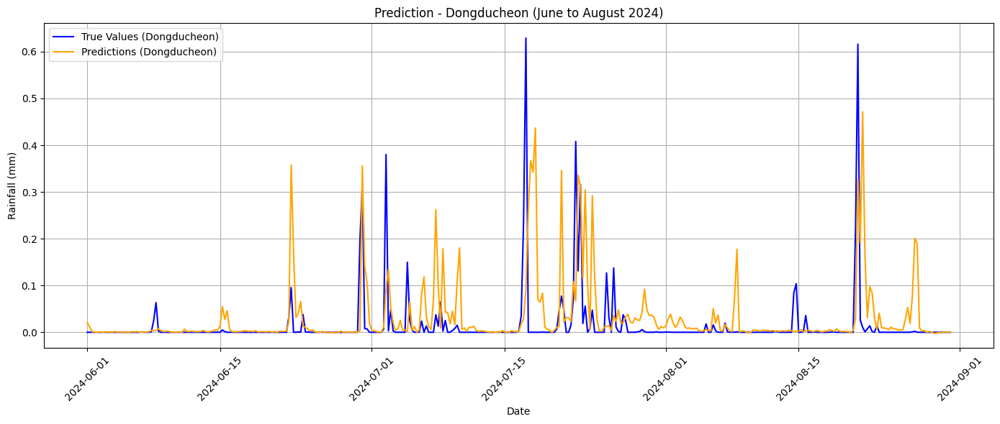

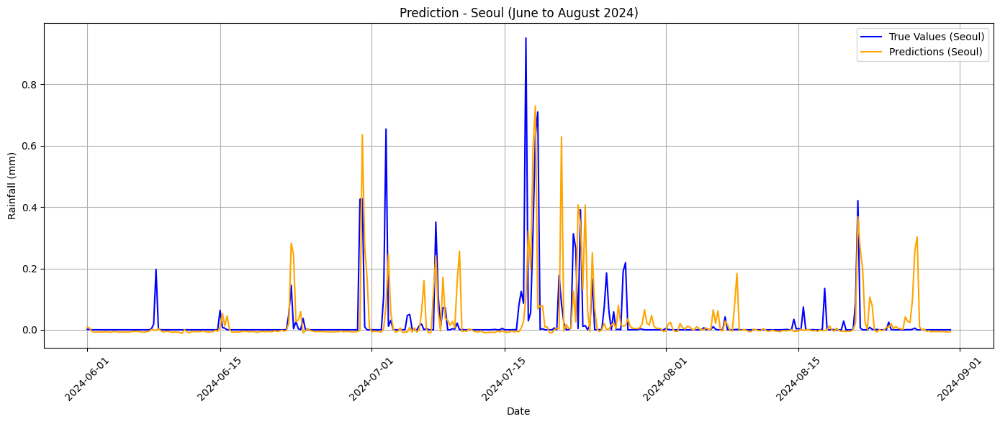

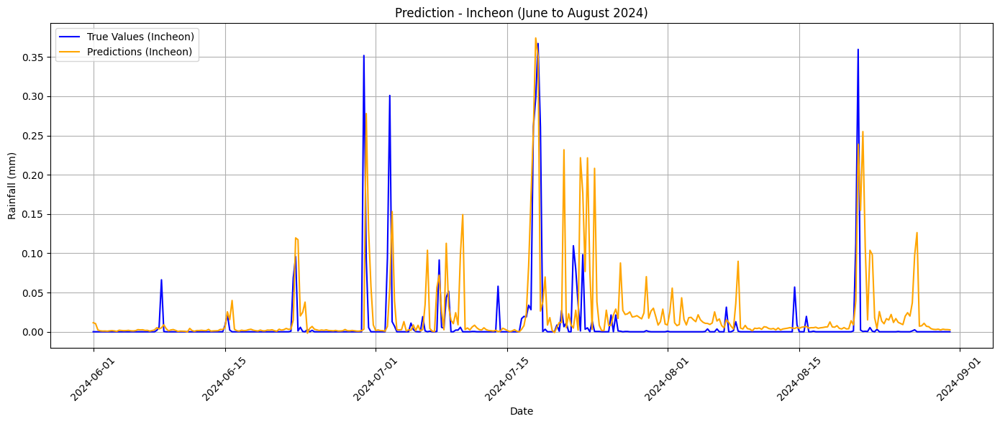

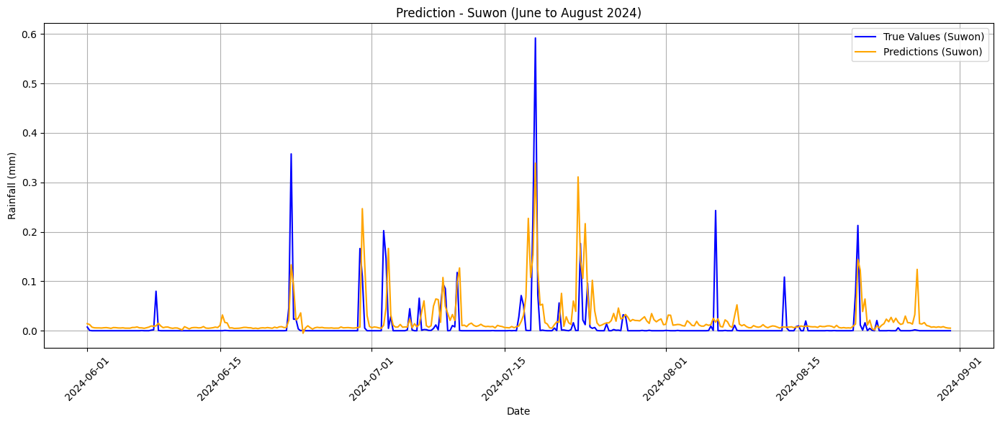

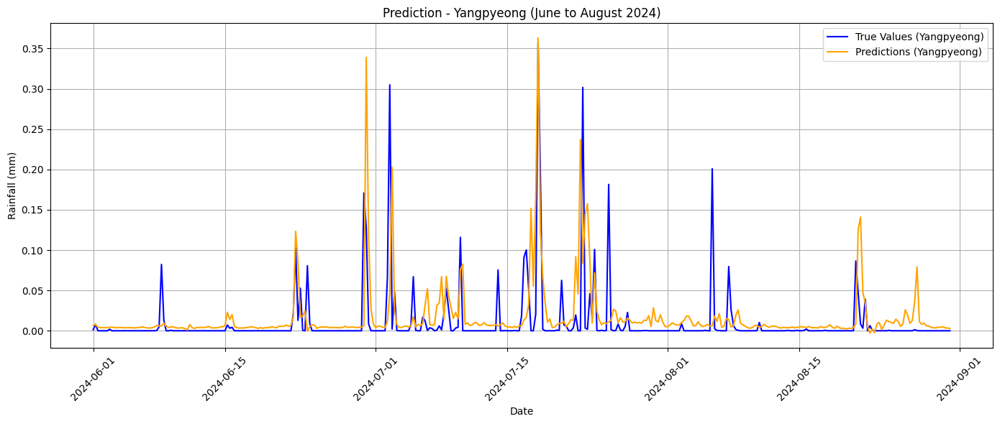

MAE: 0.0145, RMSE: 0.0438, R2 Score: -0.1017


In [ ]:
# 지역명 추출
region_names = list(file_paths.keys())
num_regions = len(region_names)

# 지역별로 그래프 그리기
for region_idx in range(num_regions):
    plt.figure(figsize=(14, 6))

    # 각 지역별 전체 기간에 해당하는 데이터 필터링
    region_df = region_dfs[region_names[region_idx]]

    # 전체 기간의 타임스탬프를 가져옴
    region_dates = timestamp_6h[-len(true_values):]

    # 2024년 6월부터 8월까지의 데이터 필터링
    mask = (region_dates >= pd.Timestamp('2024-06-01')) & (region_dates <= pd.Timestamp('2024-08-31'))
    region_dates_filtered = region_dates[mask]
    region_true_values = true_values[:, region_idx][mask]  # 해당 기간의 실제 값
    region_predictions = predicted_values[:, region_idx][mask]  # 해당 기간의 예측 값

    # 예측 및 실제 값 시각화 (2024년 6~8월)
    plt.plot(region_dates_filtered, region_true_values, label=f'True Values ({region_names[region_idx]})', color='blue')
    plt.plot(region_dates_filtered, region_predictions, label=f'Predictions ({region_names[region_idx]})', color='orange')

    # 그래프 제목과 축 설정 (지역명을 포함)
    plt.title(f'Prediction - {region_names[region_idx]} (June to August 2024)')
    plt.xlabel('Date')  # x축을 날짜로 설정
    plt.ylabel('Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)  # x축 레이블을 45도 회전
    plt.tight_layout()
    plt.show()

# 모델 성능 평가 출력 (전체 기간을 평가)
mae = mean_absolute_error(true_values, predicted_values)
rmse = np.sqrt(mean_squared_error(true_values, predicted_values))
r2 = r2_score(true_values, predicted_values)
print(f"MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

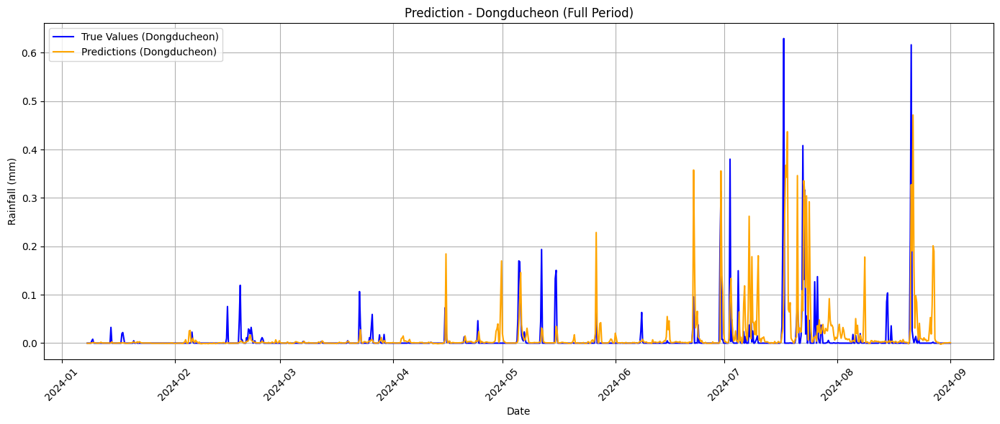

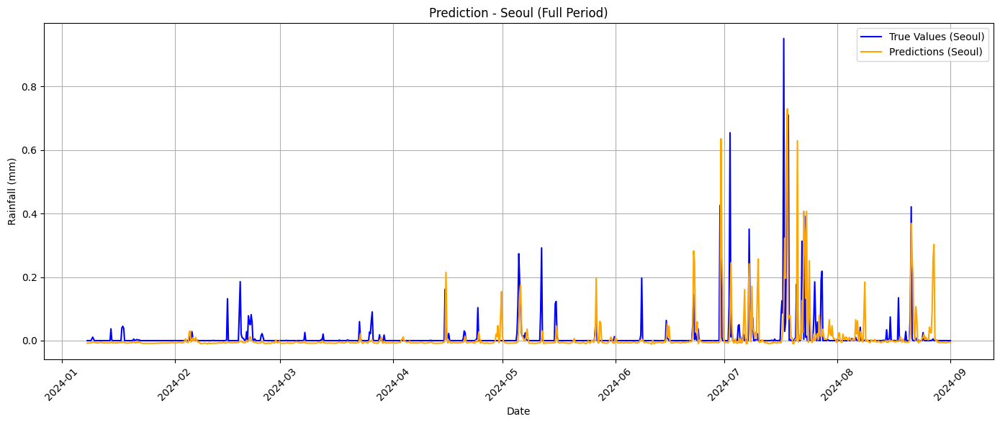

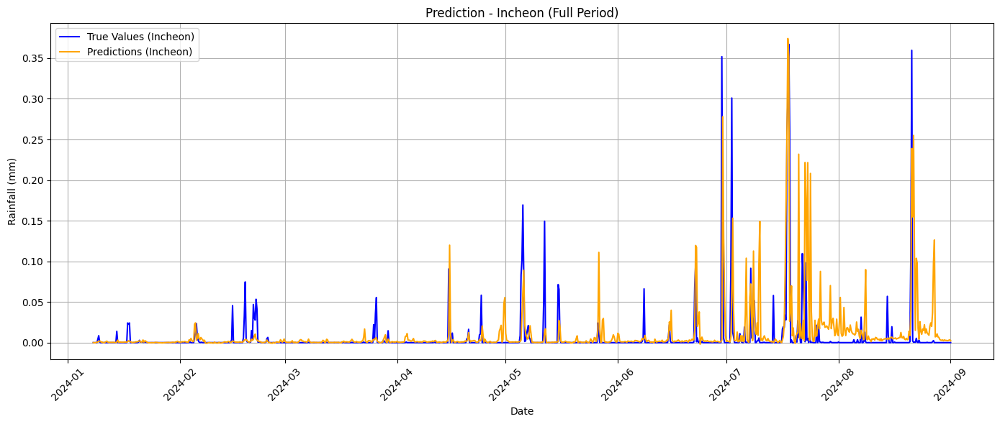

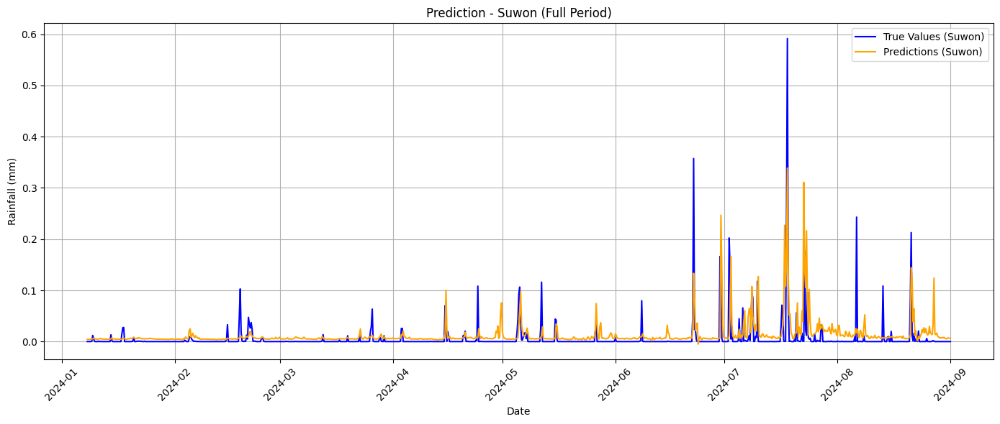

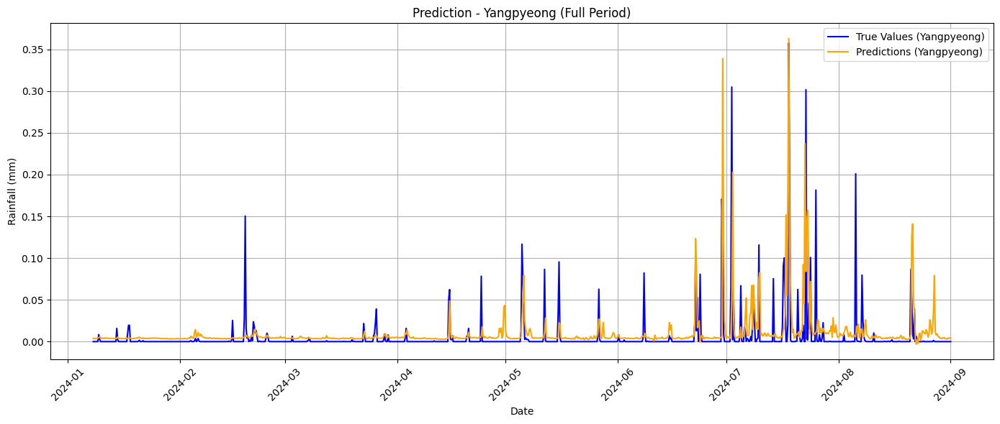

MAE: 0.0145, RMSE: 0.0438, R2 Score: -0.1017


In [ ]:
# 지역명 추출
region_names = list(file_paths.keys())
num_regions = len(region_names)

# 지역별로 그래프 그리기
for region_idx in range(num_regions):
    plt.figure(figsize=(14, 6))

    # 각 지역별 전체 기간에 해당하는 데이터 필터링
    region_df = region_dfs[region_names[region_idx]]

    # 전체 기간의 타임스탬프를 가져옴 (true_values 크기에 맞게 타임스탬프 슬라이싱)
    region_dates = timestamp_1h[-len(true_values):]
    region_true_values = true_values[:, region_idx]  # 해당 지역의 실제 값
    region_predictions = predicted_values[:, region_idx]  # 해당 지역의 예측 값

    # 예측 및 실제 값 시각화 (전체 기간)
    plt.plot(region_dates, region_true_values, label=f'True Values ({region_names[region_idx]})', color='blue')
    plt.plot(region_dates, region_predictions, label=f'Predictions ({region_names[region_idx]})', color='orange')

    # 그래프 제목과 축 설정 (지역명을 포함)
    plt.title(f'Prediction - {region_names[region_idx]} (Full Period)')
    plt.xlabel('Date')  # x축을 날짜로 설정
    plt.ylabel('Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)  # x축 레이블을 45도 회전
    plt.tight_layout()
    plt.show()

# 모델 성능 평가 출력
mae = mean_absolute_error(true_values, predicted_values)
rmse = np.sqrt(mean_squared_error(true_values, predicted_values))
r2 = r2_score(true_values, predicted_values)
print(f"MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

### 6시간 단위 예측 (2개년)

##### 데이터 불러오기

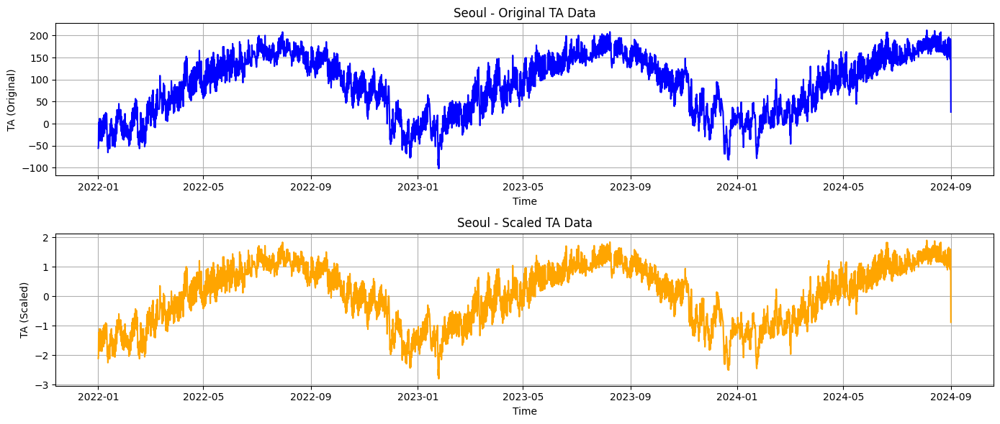

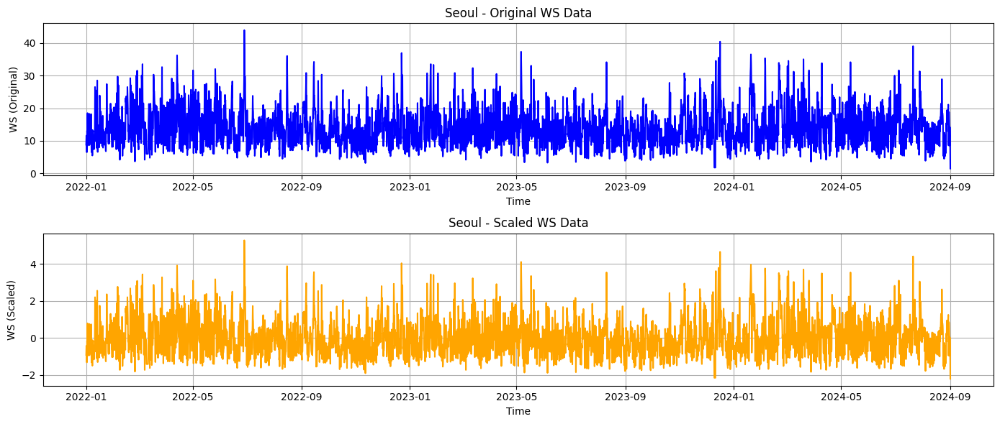

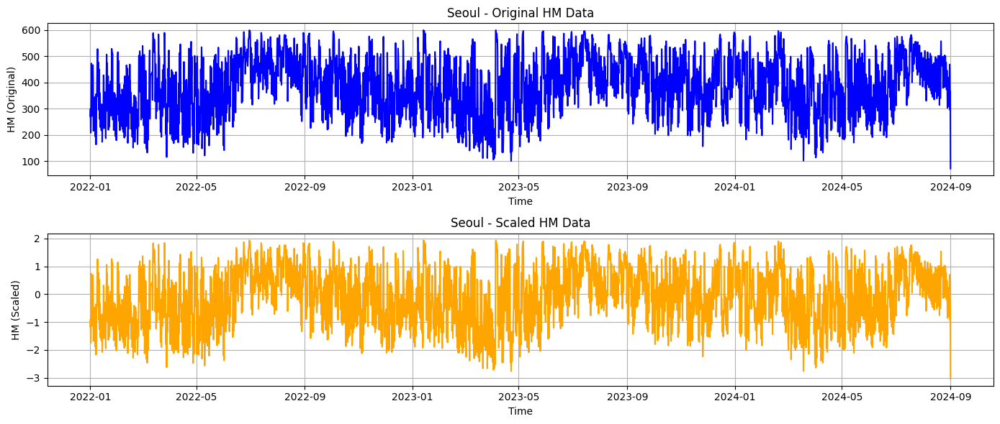

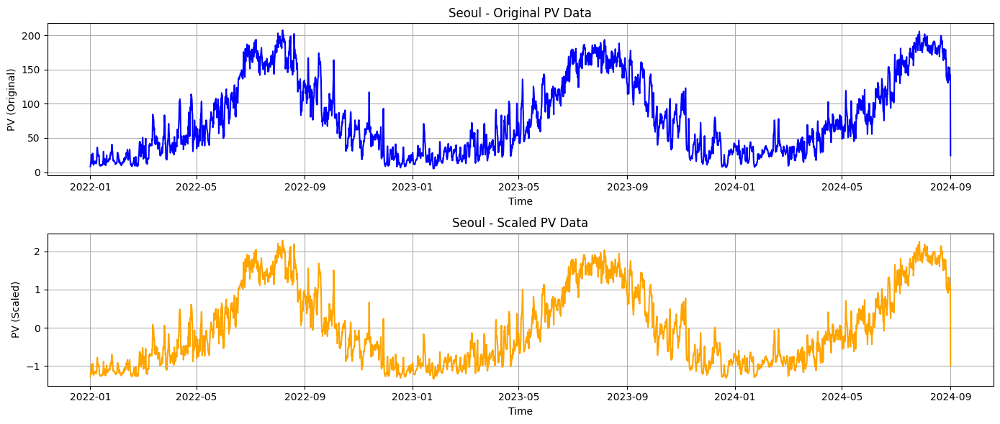

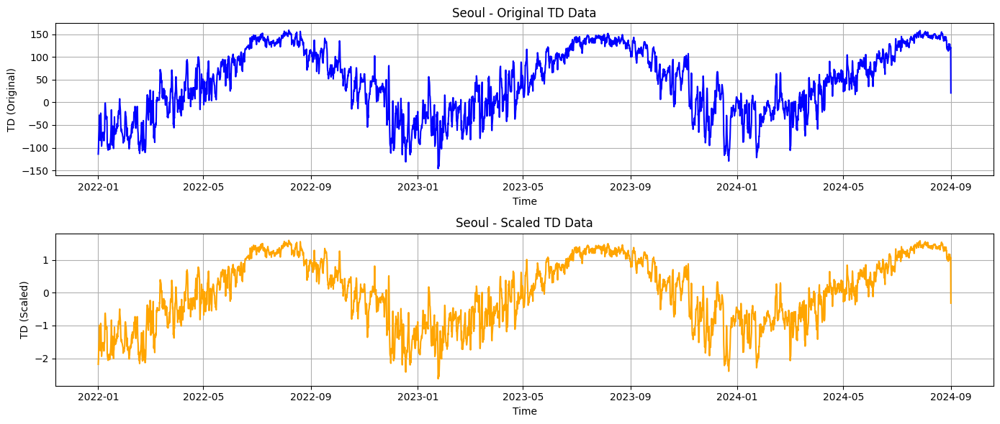

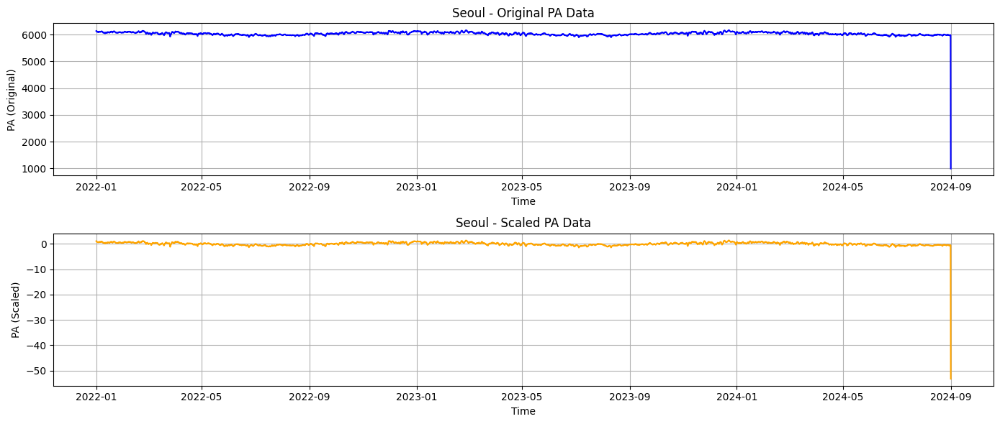

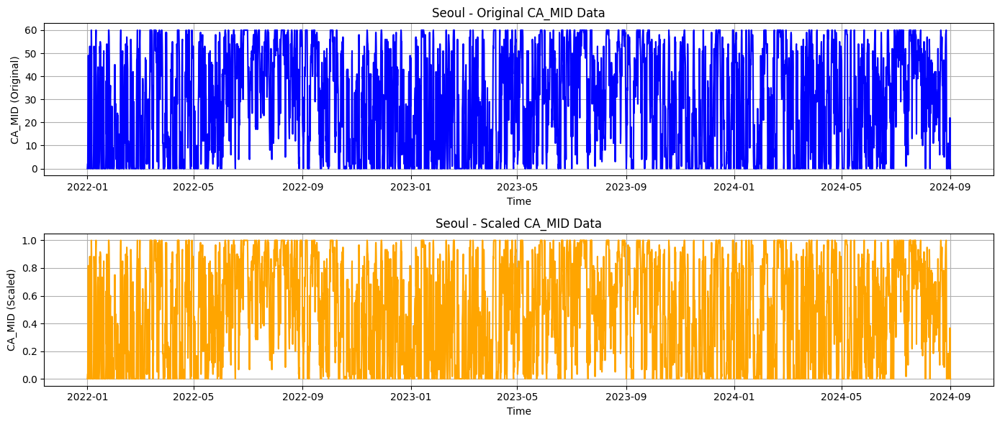

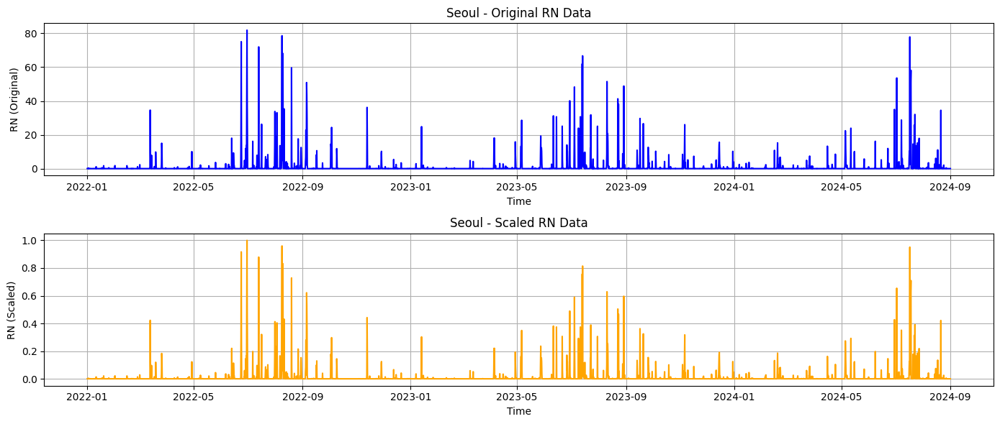

In [ ]:
# 지역별 파일
file_paths = {
    'Dongducheon': './data/preprocessed_df_98_filled_6h.csv',
    'Seoul': './data/preprocessed_df_108_filled_6h.csv',
    'Incheon': './data/preprocessed_df_112_filled_6h.csv',
    'Suwon': './data/preprocessed_df_119_filled_6h.csv',
    'Yangpyeong': './data/preprocessed_df_202_filled_6h.csv',
}

meta_data = {
    'TM': '관측시간(KST)',
    'TA': '기온(C)',
    'WS': '풍속(m/s)',
    'HM': '상대습도(%)',
    'PV': '수증기압(hPa)',
    'TD': '이슬점온도(C)',
    'PA': '현지기압(hPa)',
    'CA_MID': '중하층운량(1/10)',
    'RN': '강수량(mm)'
}

features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'RN']  # 기상 변수
minmax_features = ['CA_MID', 'RN']  # MinMaxScaler 적용할 피처들
remaining_features = list(set(features) - set(minmax_features))  # StandardScaler 적용할 피처들

# 각 지역의 데이터를 저장할 딕셔너리
region_dfs = {}
original_data = {}
scaled_data = []
scalers = {}

# 각 지역의 데이터를 읽고 처리
for region, file_path in file_paths.items():
    # 파일에서 데이터 읽기
    df = pd.read_csv(file_path)

    df['TM'] = pd.to_datetime(df['TM'], format='%Y-%m-%d %H:%M:%S')
    df = df[(df['TM'].dt.year == 2022) | (df['TM'].dt.year == 2023) | (df['TM'].dt.year == 2024)]

    # 스케일링 전 데이터를 저장
    original_data[region] = df[features + ['TM']].copy()

    # 지정된 피처만 선택
    region_data = df[features].copy()
    region_data['TM'] = df['TM']  # 시간 데이터 유지

    # MinMaxScaler는 'CA_MID', 'RN' 피처에 적용
    scaler_minmax = MinMaxScaler()
    region_data[minmax_features] = scaler_minmax.fit_transform(region_data[minmax_features])

    # StandardScaler는 나머지 피처에 적용
    scaler_standard = StandardScaler()
    region_data[remaining_features] = scaler_standard.fit_transform(region_data[remaining_features])

    # 스케일링된 데이터를 다시 저장
    region_dfs[region] = region_data  # 스케일링된 데이터 저장
    scaled_data.append(region_data)   # 각 지역의 스케일링된 데이터를 리스트에 추가
    scalers[region] = {'minmax': scaler_minmax, 'standard': scaler_standard}  # 각 스케일러 저장

# 스케일링된 데이터를 3차원으로 스택 (num_samples, num_features, num_regions)
scaled_data = np.stack(scaled_data, axis=-1)

# 서울 데이터를 기준으로 시각화
df_original = original_data['Seoul']  # 스케일링 전 데이터
df_scaled = region_dfs['Seoul']       # 스케일링 후 데이터
timestamp_6h = df_original['TM']

# 각 피처에 대한 스케일링 전후의 시각화를 개별적으로 수행
for col in features:
    plt.figure(figsize=(14, 6))

    # 스케일링 전 (원본) 데이터 시각화
    plt.subplot(2, 1, 1)
    plt.plot(df_original['TM'], df_original[col], label=f'Original {col}', color='blue')
    plt.title(f'Seoul - Original {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col} (Original)')
    plt.grid(True)

    # 스케일링 후 데이터 시각화
    plt.subplot(2, 1, 2)
    plt.plot(df_scaled['TM'], df_scaled[col], label=f'Scaled {col}', color='orange')
    plt.title(f'Seoul - Scaled {col} Data')
    plt.xlabel('Time')
    plt.ylabel(f'{col} (Scaled)')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

In [ ]:
seq_length = 28

def sliding_windows(data_X, data_y, seq_length):
    x = []
    y = []
    for i in range(len(data_X) - seq_length):
        _x = data_X[i:(i + seq_length)]
        _y = data_y[i + seq_length]
        x.append(_x)
        y.append(_y)
    return np.array(x, dtype=np.float32), np.array(y, dtype=np.float32)

In [ ]:
# 2024년을 기준으로 데이터를 분리하기 위한 마스크 생성
train_mask = df['TM'] < '2024-01-01'
test_mask = df['TM'] >= '2024-01-01'

# X_scaled와 y_scaled로 나누기 (타겟은 강수량)
X_scaled = scaled_data[:, :-1, :]  # 입력 변수 (시간은 제외)
y_scaled = scaled_data[:, -2, :]  # 타겟 변수 (강수량)

# 먼저 train/test 데이터를 슬라이딩 윈도우 전에 나눔
X_train = X_scaled[train_mask]
y_train = y_scaled[train_mask]

X_test = X_scaled[test_mask]
y_test = y_scaled[test_mask]

# 슬라이딩 윈도우 적용 (train/test 각각에 대해)
trainX, trainY = sliding_windows(X_train, y_train, seq_length)
testX, testY = sliding_windows(X_test, y_test, seq_length)

# Train/Test 데이터를 Torch Tensor로 변환
trainX = torch.Tensor(trainX)
trainY = torch.Tensor(trainY)

testX = torch.Tensor(testX)
testY = torch.Tensor(testY)

# 데이터 크기 확인
print("Training Data X Shape:", trainX.shape)
print("Training Data Y Shape:", trainY.shape)
print("Test Data X Shape:", testX.shape)
print("Test Data Y Shape:", testY.shape)

Training Data X Shape: torch.Size([2892, 28, 8, 5])
Training Data Y Shape: torch.Size([2892, 5])
Test Data X Shape: torch.Size([949, 28, 8, 5])
Test Data Y Shape: torch.Size([949, 5])


In [ ]:
# TensorDataset 생성
train_dataset = TensorDataset(trainX, trainY)
test_dataset = TensorDataset(testX, testY)

# DataLoader를 사용하여 배치 사이즈 설정
batch_size = 64  # 미니배치 사이즈를 설정
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

##### 훈련

In [ ]:
# Hyperparameters
num_epochs = 500
learning_rate = 0.001
input_size = trainX.shape[3] * len(features)  # 입력 피처 크기 (8 * 5)
embed_size = 32
num_layers = 3
output_size = trainY.shape[1]  # 타겟 크기 (5)

In [ ]:
# GPU 사용 가능하면 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Training on device: {device}")

# 모델 초기화
model = Transformer(input_size, embed_size, output_size, num_layers).to(device)

# 손실 함수 및 최적화 기법
criterion = torch.nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, betas = (0.9, 0.999))

testX, testY = testX.to(device), testY.to(device)

Training on device: cuda


In [ ]:
best_loss_6hour_2year = float('inf')
best_model_6hour_2year = None

In [ ]:
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    # 배치 단위로 학습 진행
    for batch_X, batch_Y in train_loader:
        batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)

        # Forward pass
        outputs = model(batch_X)

        # 마지막 타임스텝에서 예측한 값만 사용
        outputs = outputs[:, -1, :]  # (batch_size, output_size)

        # Loss 계산
        loss = criterion(outputs, batch_Y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Running loss 업데이트
        running_loss += loss.item()

    # 매 50 에포크마다 학습 손실 출력 및 평가
    if epoch % 50 == 0:
        avg_train_loss = running_loss / len(train_loader)
        print(f"Epoch [{epoch+1}/{num_epochs}], Training Loss: {avg_train_loss:.4f}")

        # 검증 단계에서 예측 수행 및 결과 저장
        model.eval()
        val_loss = 0.0
        predicted_values = []
        true_vals = []

        with torch.no_grad():
            for batch_X, batch_Y in test_loader:
                batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)
                outputs = model(batch_X)
                outputs = outputs[:, -1, :]
                loss = criterion(outputs, batch_Y)
                val_loss += loss.item()

                predicted_values.extend(outputs.cpu().numpy())
                true_vals.extend(batch_Y.cpu().numpy())

        # 예측값과 실제값 저장
        predicted_values = np.array(predicted_values)
        true_values = np.array(true_vals)

        avg_val_loss = val_loss / len(test_loader)
        mae = mean_absolute_error(true_vals, predicted_values)
        rmse = np.sqrt(mean_squared_error(true_vals, predicted_values))
        r2 = r2_score(true_vals, predicted_values)

        print(f"Validation Loss: {avg_val_loss:.4f}, MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

        # 최적의 모델 저장
        if avg_val_loss < best_loss_6hour_2year:
            best_loss_6hour_2year = avg_val_loss
            best_model_6hour_2year = model.state_dict()

            # 최적의 모델 저장 메시지 출력
            print(f"New best model found with Train Loss: {loss:.4f}, Validation Loss: {best_loss_6hour_2year:.4f}")

Epoch [1/500], Training Loss: 0.0581
Validation Loss: 0.0035, MAE: 0.0392, RMSE: 0.0595, R2 Score: -1.5019
New best model found with Train Loss: 0.0042, Validation Loss: 0.0035
Epoch [51/500], Training Loss: 0.0018
Validation Loss: 0.0023, MAE: 0.0217, RMSE: 0.0474, R2 Score: -0.5642
New best model found with Train Loss: 0.0077, Validation Loss: 0.0023
Epoch [101/500], Training Loss: 0.0013
Validation Loss: 0.0015, MAE: 0.0158, RMSE: 0.0391, R2 Score: 0.0069
New best model found with Train Loss: 0.0031, Validation Loss: 0.0015
Epoch [151/500], Training Loss: 0.0008
Validation Loss: 0.0015, MAE: 0.0134, RMSE: 0.0382, R2 Score: 0.0632
New best model found with Train Loss: 0.0027, Validation Loss: 0.0015
Epoch [201/500], Training Loss: 0.0007
Validation Loss: 0.0014, MAE: 0.0138, RMSE: 0.0370, R2 Score: 0.1654
New best model found with Train Loss: 0.0032, Validation Loss: 0.0014
Epoch [251/500], Training Loss: 0.0006
Validation Loss: 0.0013, MAE: 0.0106, RMSE: 0.0359, R2 Score: 0.2567
New

In [ ]:
# 최적의 모델 저장 경로
best_model_path = './param/best_model_6h_2y.pth'

# 최적의 모델 저장
torch.save(best_model_6hour_2year, best_model_path)

print(f"Best model and parameters saved at {best_model_path}")

Best model and parameters saved at ./param/best_model_6h_2y.pth


##### 확인

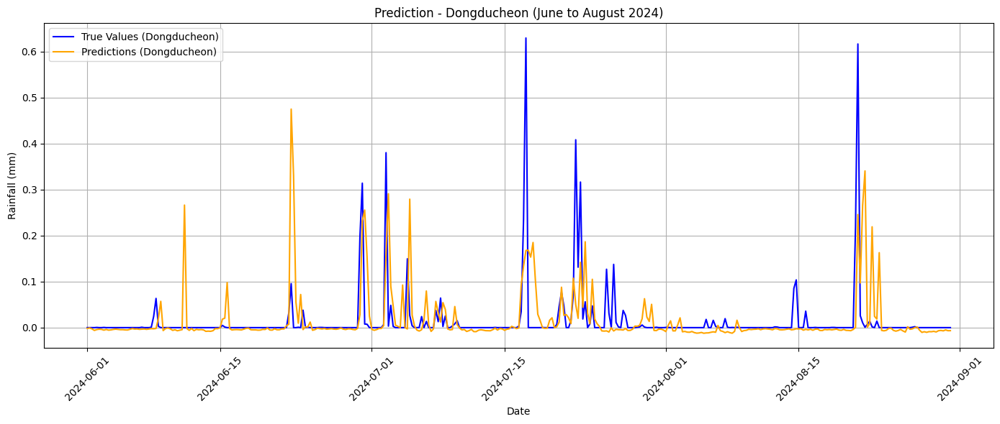

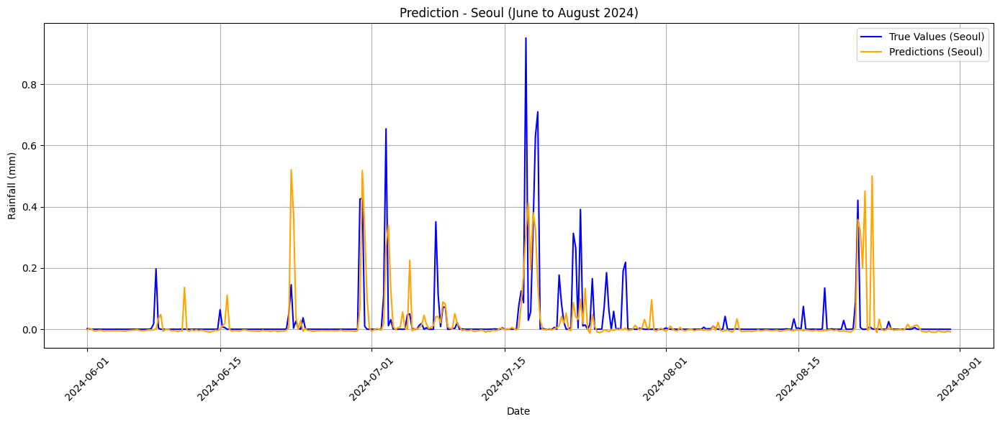

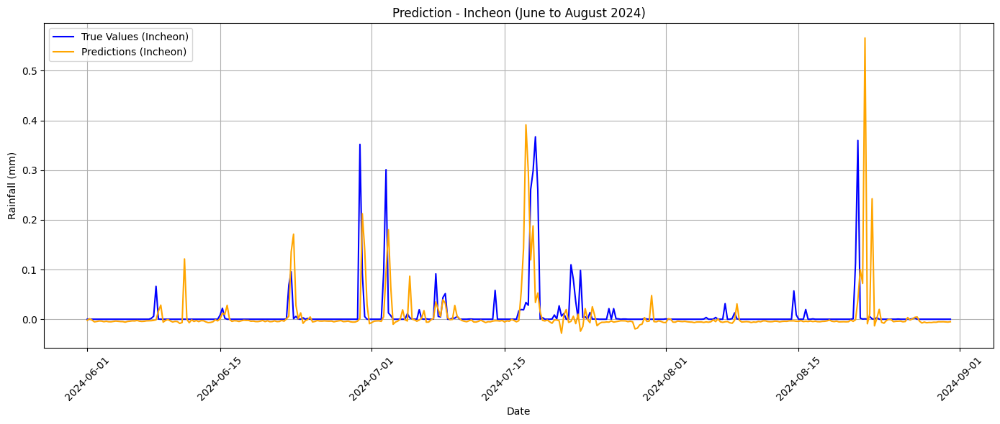

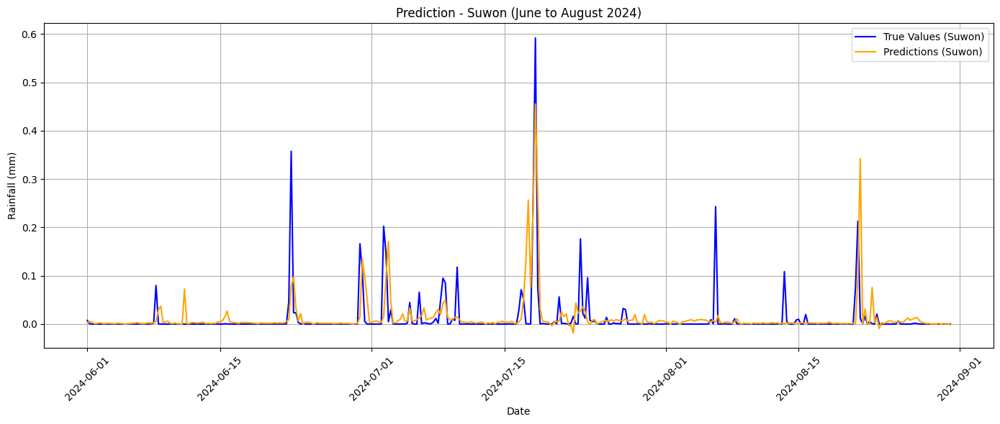

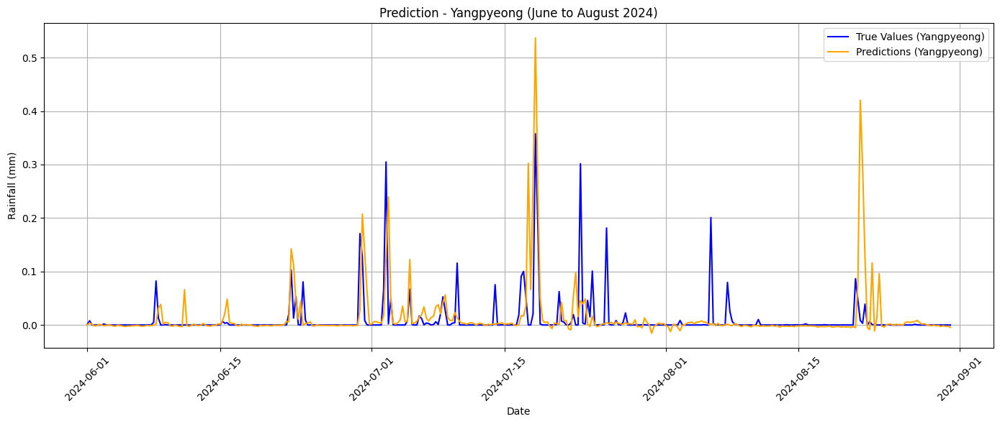

MAE: 0.0122, RMSE: 0.0420, R2 Score: -0.1450


In [ ]:
# 지역명 추출
region_names = list(file_paths.keys())
num_regions = len(region_names)

# 지역별로 그래프 그리기
for region_idx in range(num_regions):
    plt.figure(figsize=(14, 6))

    # 각 지역별 전체 기간에 해당하는 데이터 필터링
    region_df = region_dfs[region_names[region_idx]]

    # 전체 기간의 타임스탬프를 가져옴
    region_dates = timestamp_6h[-len(true_values):]

    # 2024년 6월부터 8월까지의 데이터 필터링
    mask = (region_dates >= pd.Timestamp('2024-06-01')) & (region_dates <= pd.Timestamp('2024-08-31'))
    region_dates_filtered = region_dates[mask]
    region_true_values = true_values[:, region_idx][mask]  # 해당 기간의 실제 값
    region_predictions = predicted_values[:, region_idx][mask]  # 해당 기간의 예측 값

    # 예측 및 실제 값 시각화 (2024년 6~8월)
    plt.plot(region_dates_filtered, region_true_values, label=f'True Values ({region_names[region_idx]})', color='blue')
    plt.plot(region_dates_filtered, region_predictions, label=f'Predictions ({region_names[region_idx]})', color='orange')

    # 그래프 제목과 축 설정 (지역명을 포함)
    plt.title(f'Prediction - {region_names[region_idx]} (June to August 2024)')
    plt.xlabel('Date')  # x축을 날짜로 설정
    plt.ylabel('Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)  # x축 레이블을 45도 회전
    plt.tight_layout()
    plt.show()

# 모델 성능 평가 출력 (전체 기간을 평가)
mae = mean_absolute_error(true_values, predicted_values)
rmse = np.sqrt(mean_squared_error(true_values, predicted_values))
r2 = r2_score(true_values, predicted_values)
print(f"MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

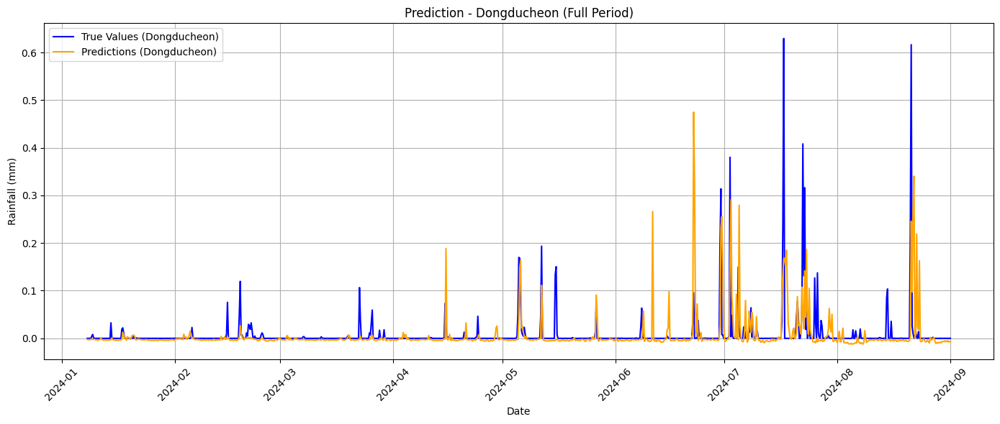

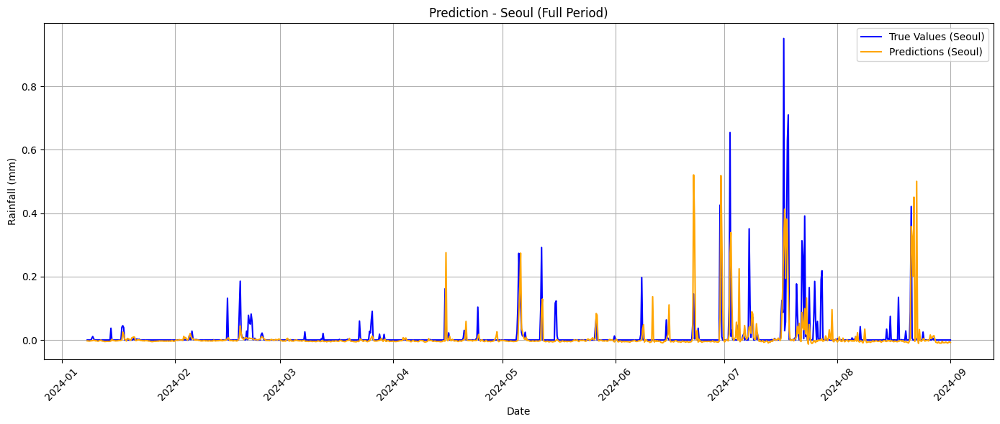

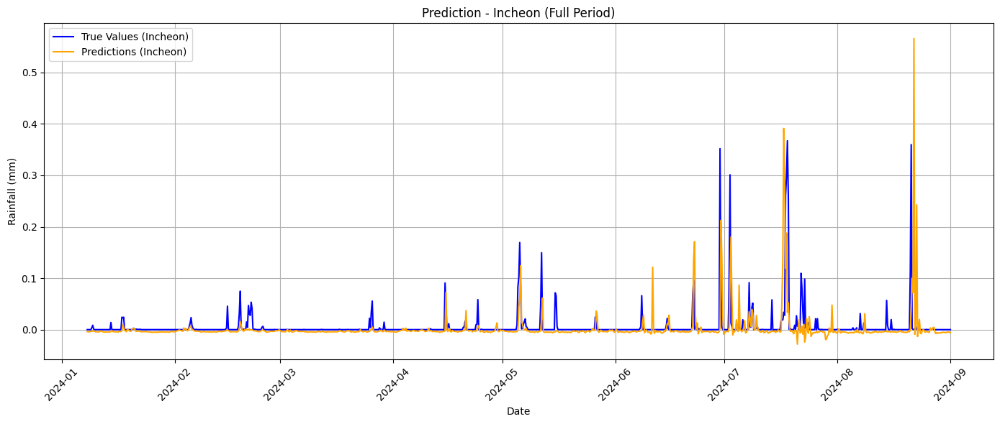

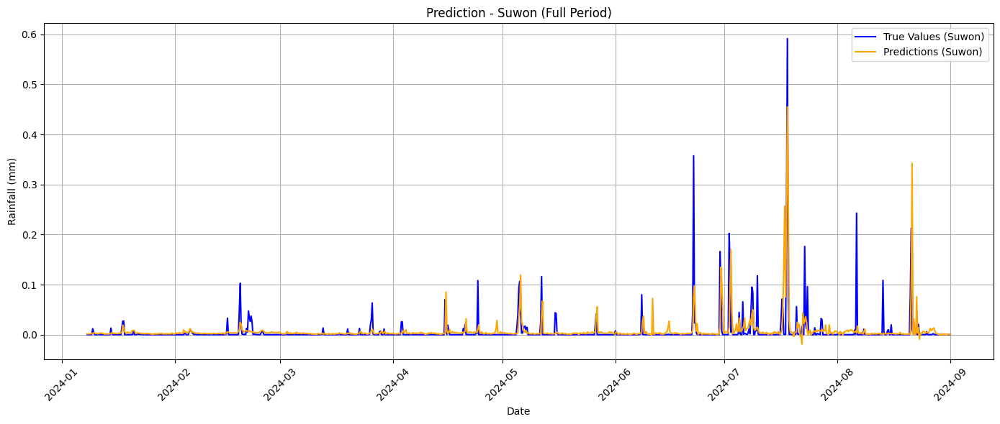

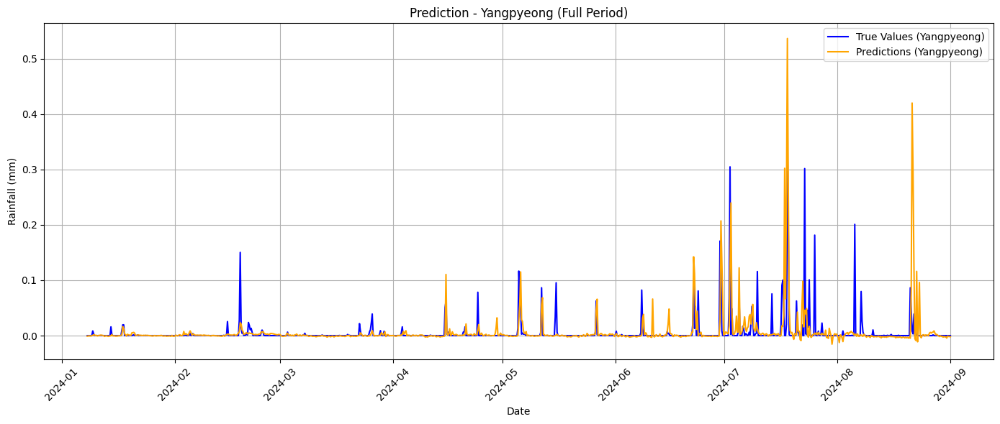

MAE: 0.0122, RMSE: 0.0420, R2 Score: -0.1450


In [ ]:
# 지역명 추출
region_names = list(file_paths.keys())
num_regions = len(region_names)

# 지역별로 그래프 그리기
for region_idx in range(num_regions):
    plt.figure(figsize=(14, 6))

    # 각 지역별 전체 기간에 해당하는 데이터 필터링
    region_df = region_dfs[region_names[region_idx]]

    # 전체 기간의 타임스탬프를 가져옴 (true_values 크기에 맞게 타임스탬프 슬라이싱)
    region_dates = timestamp_1h[-len(true_values):]
    region_true_values = true_values[:, region_idx]  # 해당 지역의 실제 값
    region_predictions = predicted_values[:, region_idx]  # 해당 지역의 예측 값

    # 예측 및 실제 값 시각화 (전체 기간)
    plt.plot(region_dates, region_true_values, label=f'True Values ({region_names[region_idx]})', color='blue')
    plt.plot(region_dates, region_predictions, label=f'Predictions ({region_names[region_idx]})', color='orange')

    # 그래프 제목과 축 설정 (지역명을 포함)
    plt.title(f'Prediction - {region_names[region_idx]} (Full Period)')
    plt.xlabel('Date')  # x축을 날짜로 설정
    plt.ylabel('Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)  # x축 레이블을 45도 회전
    plt.tight_layout()
    plt.show()

# 모델 성능 평가 출력
mae = mean_absolute_error(true_values, predicted_values)
rmse = np.sqrt(mean_squared_error(true_values, predicted_values))
r2 = r2_score(true_values, predicted_values)
print(f"MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

### 레이블 분류

##### 데이터 불러오기

In [ ]:
# 지역별 파일
file_paths = {
    'Dongducheon': './data/preprocessed_df_98_filled_6h.csv',
    'Seoul': './data/preprocessed_df_108_filled_6h.csv',
    'Incheon': './data/preprocessed_df_112_filled_6h.csv',
    'Suwon': './data/preprocessed_df_119_filled_6h.csv',
    'Yangpyeong': './data/preprocessed_df_202_filled_6h.csv',
}

# 1시간 단위 데이터 불러오기 (카테고리화된 데이터 사용)
region_dfs = {
    'Dongducheon': pd.read_csv('./data/preprocessed_df_98_filled_with_category.csv'),
    'Seoul': pd.read_csv('./data/preprocessed_df_108_filled_with_category.csv'),
    'Incheon': pd.read_csv('./data/preprocessed_df_112_filled_with_category.csv'),
    'Suwon': pd.read_csv('./data/preprocessed_df_119_filled_with_category.csv'),
    'Yangpyeong': pd.read_csv('./data/preprocessed_df_202_filled_with_category.csv')
}

# 강수량(RN) 카테고리를 숫자로 변환하여 사용하지 않는다면 그대로 진행
features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'RN', 'RN_Category']

# 각 지역의 데이터를 저장할 딕셔너리
region_dfs_scaled = {}
original_data = {}
scaled_data = []
scalers = {}

# 각 지역의 데이터를 읽고 처리
for region, df in region_dfs.items():
    # TM을 datetime 형식으로 변환
    df['TM'] = pd.to_datetime(df['TM'], format='%Y-%m-%d %H:%M:%S')

    # 스케일링 전 데이터를 저장
    original_data[region] = df[features + ['TM']].copy()

    # 지정된 피처만 선택
    region_data = df[features].copy()
    region_data['TM'] = df['TM']  # 시간 데이터 유지
    region_data['RN_Category'] = df['RN_Category']

    # MinMaxScaler는 'CA_MID', 'RN' 피처에 적용
    scaler_minmax = MinMaxScaler()
    region_data[['CA_MID', 'RN']] = scaler_minmax.fit_transform(region_data[['CA_MID', 'RN']])

    # StandardScaler는 나머지 피처에 적용
    scaler_standard = StandardScaler()
    remaining_features = list(set(features) - {'CA_MID', 'RN', 'RN_Category'})
    region_data[remaining_features] = scaler_standard.fit_transform(region_data[remaining_features])

    # 스케일링된 데이터를 다시 저장
    region_dfs_scaled[region] = region_data  # 스케일링된 데이터 저장
    scaled_data.append(region_data)  # 각 지역의 스케일링된 데이터를 리스트에 추가
    scalers[region] = {'minmax': scaler_minmax, 'standard': scaler_standard}  # 각 스케일러 저장

# 스케일링된 데이터를 3차원으로 스택 (num_samples, num_features, num_regions)
scaled_data = np.stack(scaled_data, axis=-1)

# 서울 데이터를 기준으로 시각화
df_original = original_data['Seoul']  # 스케일링 전 데이터
df_scaled = region_dfs_scaled['Seoul']  # 스케일링 후 데이터
timestamp_1h = df_original['TM']

In [ ]:
seq_length = 28

def sliding_windows(data_X, data_y, seq_length):
    x = []
    y = []
    for i in range(len(data_X) - seq_length):
        _x = data_X[i:(i + seq_length)]
        _y = data_y[i + seq_length]
        x.append(_x)
        y.append(_y)
    return np.array(x, dtype=np.float32), np.array(y, dtype=np.float32)

In [ ]:
# 2024년을 기준으로 데이터를 분리하기 위한 마스크 생성
train_mask = df['TM'] < '2024-01-01'
test_mask = df['TM'] >= '2024-01-01'

# X_scaled와 y_scaled로 나누기 (타겟은 강수량)
X_scaled = scaled_data[:, :-1, :]  # 입력 변수 (시간은 제외)
y_scaled = scaled_data[:, -2, :]  # 타겟 변수 (강수량 범주)

# 먼저 train/test 데이터를 슬라이딩 윈도우 전에 나눔
X_train = X_scaled[train_mask]
y_train = y_scaled[train_mask]

X_test = X_scaled[test_mask]
y_test = y_scaled[test_mask]

# 슬라이딩 윈도우 적용 (train/test 각각에 대해)
trainX, trainY = sliding_windows(X_train, y_train, seq_length)
testX, testY = sliding_windows(X_test, y_test, seq_length)

# Train/Test 데이터를 Torch Tensor로 변환
trainX = torch.Tensor(trainX)
trainY = torch.Tensor(trainY)

testX = torch.Tensor(testX)
testY = torch.Tensor(testY)

# 데이터 크기 확인
print("Training Data X Shape:", trainX.shape)
print("Training Data Y Shape:", trainY.shape)
print("Test Data X Shape:", testX.shape)
print("Test Data Y Shape:", testY.shape)

Training Data X Shape: torch.Size([43796, 28, 9, 5])
Training Data Y Shape: torch.Size([43796, 5])
Test Data X Shape: torch.Size([5829, 28, 9, 5])
Test Data Y Shape: torch.Size([5829, 5])


In [ ]:
# TensorDataset 생성
train_dataset = TensorDataset(trainX, trainY)
test_dataset = TensorDataset(testX, testY)

# DataLoader를 사용하여 배치 사이즈 설정
batch_size = 64  # 미니배치 사이즈를 설정
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

##### 아키텍쳐

In [ ]:
class Transformer(nn.Module):
    def __init__(self, input_dim, emb_dim, out_dim, num_encoder):
        super().__init__()
        self.input_dim = input_dim
        self.emb_dim = emb_dim
        self.input_layer = nn.Linear(input_dim, emb_dim, bias=True)
        self.encoder_layers = nn.ModuleList([EncoderBlock(emb_dim) for _ in range(num_encoder)])
        self.output_layer = nn.Linear(emb_dim, out_dim, bias=True)

    def forward(self, x):
        batch_size, seq_length, num_features, num_regions = x.shape
        x = x.view(batch_size, seq_length, -1)
        x = self.input_layer(x)
        for l in self.encoder_layers: # batch_size, seq_length, 32
            x = l(x)
        x = self.output_layer(x) # batch_size, seq_length, 20
        x = x.view(batch_size, seq_length, num_regions, 4)
        return x

##### 훈련

In [ ]:
# Hyperparameters
num_epochs = 500
learning_rate = 0.001
input_size = trainX.shape[3] * len(features)  # 입력 피처 크기 (8 * 5)
embed_size = 32
num_layers = 3
output_size = trainY.shape[1] * 4  # 타겟 크기 (5 * 4)

In [ ]:
# GPU 사용 가능하면 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Training on device: {device}")

# 모델 초기화
model = Transformer(input_size, embed_size, output_size, num_layers).to(device)

# 손실 함수 및 최적화 기법
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

testX, testY = testX.to(device), testY.to(device)

Training on device: cuda


In [ ]:
best_loss_category = float('inf')
best_model_category = None

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

predicted_values = []
true_values = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for batch_X, batch_Y in train_loader:
        batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)

        # Forward pass
        outputs = model(batch_X)
        outputs = outputs[:, -1, :, :]  # (batch_size, 5, 4) 마지막 타임스텝에서 각 지역별로 4개의 클래스 확률

        # Loss 계산 (CrossEntropyLoss)
        loss = 0
        for region_idx in range(5):  # 각 지역에 대해 개별적으로 CrossEntropy 계산
            loss += criterion(outputs[:, region_idx, :], batch_Y[:, region_idx].long())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    # 매 50 에포크마다 학습 손실 출력 및 검증
    if epoch % 50 == 0:
        avg_train_loss = running_loss / len(train_loader)
        print(f"Epoch [{epoch+1}/{num_epochs}], Training Loss: {avg_train_loss:.4f}")

        # 검증 단계에서 예측 수행 및 결과 저장
        model.eval()
        val_loss = 0.0
        all_preds = []
        all_true = []

        with torch.no_grad():
            for batch_X, batch_Y in test_loader:
                batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)
                outputs = model(batch_X)
                outputs = outputs[:, -1, :, :]
                loss = 0
                for region_idx in range(5):
                    loss += criterion(outputs[:, region_idx, :], batch_Y[:, region_idx].long())
                val_loss += loss.item()

                # 예측된 클래스 얻기 (softmax 후 argmax로 예측)
                for region_idx in range(5):
                    _, predicted = torch.max(outputs[:, region_idx, :], 1)
                    all_preds.extend(predicted.cpu().numpy())
                    all_true.extend(batch_Y[:, region_idx].cpu().numpy())

        # 예측값 및 실제값 저장
        predicted_values = np.array(all_preds).reshape(-1, 5)  # 지역별로 reshape
        true_values = np.array(all_true).reshape(-1, 5)

        # 분류 지표 계산 (정확도, F1 점수 등)
        avg_val_loss = val_loss / len(test_loader)
        accuracy = accuracy_score(all_true, all_preds)
        precision = precision_score(all_true, all_preds, average='macro')
        recall = recall_score(all_true, all_preds, average='macro')
        f1 = f1_score(all_true, all_preds, average='macro')

        print(f"Validation Loss: {avg_val_loss:.4f}, Accuracy: {accuracy:.4f}, F1 Score: {f1:.4f}")

        # 최적의 모델 저장
        if avg_val_loss < best_loss_category:
            best_loss_category = avg_val_loss
            best_model_category = model.state_dict()
            print(f"New best model found with Validation Loss: {best_loss_category:.4f}")

Epoch [1/500], Training Loss: 0.7503
Validation Loss: 0.8640, Accuracy: 0.9350, F1 Score: 0.5246
New best model found with Validation Loss: 0.8640
Epoch [51/500], Training Loss: 0.6685
Validation Loss: 0.8760, Accuracy: 0.9322, F1 Score: 0.5464
Epoch [101/500], Training Loss: 0.6356
Validation Loss: 0.9115, Accuracy: 0.9310, F1 Score: 0.5176
Epoch [151/500], Training Loss: 0.6164
Validation Loss: 0.9432, Accuracy: 0.9324, F1 Score: 0.5380
Epoch [201/500], Training Loss: 0.5988
Validation Loss: 0.9430, Accuracy: 0.9328, F1 Score: 0.5381


KeyboardInterrupt: 

In [ ]:
# 최적의 모델 저장 경로
best_model_path = './param/best_model_category.pth'

# 최적의 모델 저장
torch.save(best_model_category, best_model_path)

print(f"Best model and parameters saved at {best_model_path}")

Best model and parameters saved at ./param/best_model_category.pth


### 레이블 분류 2

#### 모델 학습

##### 첫번째 기본

In [ ]:
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# 모델 학습 함수
def train_model(model, X_train, y_train, batch_size=64, epochs=100, learning_rate=0.001, save_interval=10, save_path='best_model.pth'):
    # 손실 함수 및 옵티마이저 설정
    criterion = nn.CrossEntropyLoss()  # 분류 문제이므로 CrossEntropyLoss 사용
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # 데이터를 DataLoader로 변환하여 배치 단위로 처리
    train_dataset = TensorDataset(torch.Tensor(X_train), torch.Tensor(y_train).long())
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    # GPU 사용 여부 확인
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)  # 모델을 GPU로 이동

    # 최상의 성능을 기록하기 위한 변수
    best_loss = float('inf')

    # 학습 루프
    for epoch in range(epochs):
        model.train()  # 모델을 학습 모드로 설정
        epoch_loss = 0.0  # 에포크마다 손실을 누적할 변수

        for batch_X, batch_y in train_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)  # 데이터를 GPU로 이동

            optimizer.zero_grad()

            # 모델의 예측값 계산
            outputs = model(batch_X)  # [batch_size, num_classes]

            # 마지막 타임스텝의 레이블만 사용 (batch_y의 마지막 타임스텝 레이블 추출)
            batch_y = batch_y[:, -1]  # [batch_size] -> 1D 타겟으로 변경

            # 손실 계산
            loss = criterion(outputs, batch_y)

            # 역전파를 통한 가중치 업데이트
            loss.backward()
            optimizer.step()

            # 손실 값을 배치 크기에 맞게 누적
            epoch_loss += loss.item() * batch_X.size(0)

        # 전체 학습 데이터셋에 대한 평균 손실 계산 및 출력
        epoch_loss /= len(train_loader.dataset)
        print(f'Epoch {epoch+1}/{epochs}, Loss: {epoch_loss:.4f}')

        # 최적의 모델 저장 (현재 손실이 가장 낮은 경우)
        if epoch_loss < best_loss:
            best_loss = epoch_loss
            torch.save(model.state_dict(), save_path)
            print(f"Best model saved at Epoch {epoch+1} with loss: {best_loss:.4f}")

        # 일정 간격마다 모델 저장
        if (epoch + 1) % save_interval == 0:
            torch.save(model.state_dict(), f"model_epoch_{epoch+1}.pth")
            print(f"Model saved at Epoch {epoch+1}")

# 모델 생성 및 학습 호출
model = create_model(input_dim=len(features))
train_model(model, X_train, y_train, epochs=100, learning_rate=0.001, save_interval=10, save_path='best_rainfall_model.pth')

Epoch 1/100, Loss: 0.3836
Best model saved at Epoch 1 with loss: 0.3836
Epoch 2/100, Loss: 0.3665
Best model saved at Epoch 2 with loss: 0.3665
Epoch 3/100, Loss: 0.3569
Best model saved at Epoch 3 with loss: 0.3569
Epoch 4/100, Loss: 0.3530
Best model saved at Epoch 4 with loss: 0.3530
Epoch 5/100, Loss: 0.3439
Best model saved at Epoch 5 with loss: 0.3439
Epoch 6/100, Loss: 0.3362
Best model saved at Epoch 6 with loss: 0.3362
Epoch 7/100, Loss: 0.3260
Best model saved at Epoch 7 with loss: 0.3260
Epoch 8/100, Loss: 0.3211
Best model saved at Epoch 8 with loss: 0.3211
Epoch 9/100, Loss: 0.3112
Best model saved at Epoch 9 with loss: 0.3112
Epoch 10/100, Loss: 0.3037
Best model saved at Epoch 10 with loss: 0.3037
Model saved at Epoch 10
Epoch 11/100, Loss: 0.2995
Best model saved at Epoch 11 with loss: 0.2995
Epoch 12/100, Loss: 0.2947
Best model saved at Epoch 12 with loss: 0.2947
Epoch 13/100, Loss: 0.2873
Best model saved at Epoch 13 with loss: 0.2873
Epoch 14/100, Loss: 0.2803
Best 

KeyboardInterrupt: 

##### 가중치 부여

In [ ]:
import torch
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# GPU 사용 여부 확인
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# 모델 학습 함수 (클래스 가중치 적용)
def train_model_with_weights(model, X_train, y_train, class_weights, batch_size=64, epochs=100, learning_rate=0.001, save_interval=10, save_path='best_model_with_weights.pth'):
    criterion = torch.nn.CrossEntropyLoss(weight=class_weights)  # 가중치 적용된 손실 함수
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # 데이터를 DataLoader로 변환하여 배치 단위로 처리
    train_dataset = TensorDataset(torch.Tensor(X_train), torch.Tensor(y_train).long())
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    model.to(device)  # 모델을 GPU로 이동

    best_loss = float('inf')

    for epoch in range(epochs):
        model.train()  # 학습 모드 설정
        epoch_loss = 0.0

        for batch_X, batch_y in train_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)
            optimizer.zero_grad()

            outputs = model(batch_X)
            batch_y = batch_y[:, -1]  # 마지막 타임스텝의 레이블 사용

            # 손실 계산 및 가중치 적용
            loss = criterion(outputs, batch_y)

            loss.backward()
            optimizer.step()

            epoch_loss += loss.item() * batch_X.size(0)

        epoch_loss /= len(train_loader.dataset)
        print(f'Epoch {epoch+1}/{epochs}, Loss: {epoch_loss:.4f}')

        if epoch_loss < best_loss:
            best_loss = epoch_loss
            torch.save(model.state_dict(), save_path)
            print(f"Best model saved at Epoch {epoch+1} with loss: {best_loss:.4f}")

# 클래스 가중치 계산
def calculate_class_weights(y_train):
    class_counts = torch.bincount(torch.Tensor(y_train).long().flatten())  # 각 클래스의 빈도 계산
    # class_weights = 1.0 / class_counts  # 클래스별 가중치 계산 (샘플 수의 역수)
    class_weights = torch.tensor([0.1, 2.0, 5.0, 10.0]).to(device)
    return class_weights

# 모델 생성 및 학습
model = create_model(input_dim=len(features))

# 클래스 가중치 계산
class_weights = calculate_class_weights(y_train).to(device)  # 가중치를 GPU로 이동
print("Class weights:", class_weights)

# 가중치를 적용하여 모델 학습
train_model_with_weights(model, X_train, y_train, class_weights, batch_size=64, epochs=100, learning_rate=0.001, save_interval=10, save_path='best_model_with_weights.pth')

Class weights: tensor([ 0.1000,  2.0000,  5.0000, 10.0000], device='cuda:0')
Epoch 1/100, Loss: 1.0840
Best model saved at Epoch 1 with loss: 1.0840
Epoch 2/100, Loss: 1.0482
Best model saved at Epoch 2 with loss: 1.0482
Epoch 3/100, Loss: 1.0300
Best model saved at Epoch 3 with loss: 1.0300
Epoch 4/100, Loss: 1.0201
Best model saved at Epoch 4 with loss: 1.0201
Epoch 5/100, Loss: 1.0055
Best model saved at Epoch 5 with loss: 1.0055
Epoch 6/100, Loss: 0.9882
Best model saved at Epoch 6 with loss: 0.9882
Epoch 7/100, Loss: 0.9730
Best model saved at Epoch 7 with loss: 0.9730
Epoch 8/100, Loss: 0.9692
Best model saved at Epoch 8 with loss: 0.9692


KeyboardInterrupt: 

##### 가중치 부여/ 3,4 합치기

In [ ]:
# 모델 학습 함수 (수동 가중치 적용 및 학습률/배치 크기 조정)
def train_model_with_manual_weights(model, X_train, y_train, class_weights, batch_size=32, epochs=100, learning_rate=0.0001, save_interval=10, save_path='best_model_with_manual_weights.pth'):
    criterion = torch.nn.CrossEntropyLoss(weight=class_weights)  # 수동 가중치 적용된 손실 함수
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # 데이터를 DataLoader로 변환하여 배치 단위로 처리
    train_dataset = TensorDataset(torch.Tensor(X_train), torch.Tensor(y_train).long())
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

    model.to(device)  # 모델을 GPU로 이동

    best_loss = float('inf')

    for epoch in range(epochs):
        model.train()  # 학습 모드 설정
        epoch_loss = 0.0

        for batch_X, batch_y in train_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)
            optimizer.zero_grad()

            outputs = model(batch_X)

            # CrossEntropyLoss는 Long 타입의 타겟을 기대하므로, 타겟의 자료형을 Long으로 변환
            batch_y = batch_y[:, -1].long()  # 마지막 타임스텝의 레이블 사용

            # 손실 계산 및 수동 가중치 적용
            loss = criterion(outputs, batch_y)

            loss.backward()
            optimizer.step()

            epoch_loss += loss.item() * batch_X.size(0)

        epoch_loss /= len(train_loader.dataset)
        print(f'Epoch {epoch+1}/{epochs}, Loss: {epoch_loss:.4f}')

        if epoch_loss < best_loss:
            best_loss = epoch_loss
            torch.save(model.state_dict(), save_path)
            print(f"Best model saved at Epoch {epoch+1} with loss: {best_loss:.4f}")

# 수동으로 클래스 가중치 설정
def calculate_manual_class_weights():
    # 수동으로 설정한 가중치 (클래스 0, 1, 2, 3)
    manual_class_weights = torch.tensor([0.05, 3.0, 10.0, 15.0], dtype=torch.float32)
    return manual_class_weights.to(device)

# 모델 생성 및 학습 실행
model = create_model(input_dim=len(features))  # 모델 정의

# 수동 가중치 계산
manual_class_weights = calculate_manual_class_weights()
print("Manual class weights:", manual_class_weights)

# 수동 가중치를 적용하여 모델 학습
train_model_with_manual_weights(
    model,
    X_train,
    y_train,
    manual_class_weights,
    batch_size=32,
    epochs=100,
    learning_rate=0.0001,
    save_interval=10,
    save_path='best_model_with_manual_weights.pth'
)

Manual class weights: tensor([ 0.0500,  3.0000, 10.0000, 15.0000], device='cuda:0')
Epoch 1/100, Loss: 0.8608
Best model saved at Epoch 1 with loss: 0.8608
Epoch 2/100, Loss: 0.8274
Best model saved at Epoch 2 with loss: 0.8274
Epoch 3/100, Loss: 0.8196
Best model saved at Epoch 3 with loss: 0.8196
Epoch 4/100, Loss: 0.8061
Best model saved at Epoch 4 with loss: 0.8061
Epoch 5/100, Loss: 0.7999
Best model saved at Epoch 5 with loss: 0.7999
Epoch 6/100, Loss: 0.7995
Best model saved at Epoch 6 with loss: 0.7995
Epoch 7/100, Loss: 0.7866
Best model saved at Epoch 7 with loss: 0.7866
Epoch 8/100, Loss: 0.7738
Best model saved at Epoch 8 with loss: 0.7738
Epoch 9/100, Loss: 0.7774
Epoch 10/100, Loss: 0.7626
Best model saved at Epoch 10 with loss: 0.7626
Epoch 11/100, Loss: 0.7514
Best model saved at Epoch 11 with loss: 0.7514
Epoch 12/100, Loss: 0.7576
Epoch 13/100, Loss: 0.7359
Best model saved at Epoch 13 with loss: 0.7359
Epoch 14/100, Loss: 0.7291
Best model saved at Epoch 14 with loss

#### 모델 평가

##### 기본 학습 모델 평가

In [ ]:
import torch
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import classification_report, confusion_matrix

# 저장된 최적 모델 불러오기
def load_best_model(model, model_path='best_rainfall_model.pth'):
    model.load_state_dict(torch.load(model_path, weights_only=True))
    return model

# 모델 평가 함수 (배치 단위 처리)
def evaluate_model(model, X_test, y_test, batch_size=64):
    model.eval()  # 평가 모드로 전환
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    # DataLoader로 배치 단위로 테스트 데이터 처리
    test_dataset = TensorDataset(torch.Tensor(X_test), torch.Tensor(y_test).long())
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    all_preds = []
    all_labels = []

    with torch.no_grad():  # 평가 시에는 역전파가 필요 없으므로 no_grad 사용
        for batch_X, batch_y in test_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)

            outputs = model(batch_X)
            _, predicted = torch.max(outputs, 1)  # 가장 높은 값의 클래스를 예측
            all_preds.extend(predicted.cpu().numpy())  # 예측 결과 저장
            all_labels.extend(batch_y[:, -1].cpu().numpy())  # 실제 타겟 저장 (마지막 타임스텝)

    # 성능 평가
    print("Classification Report:\n", classification_report(all_labels, all_preds))
    print("Confusion Matrix:\n", confusion_matrix(all_labels, all_preds))

# 모델 생성 및 평가 호출
model = create_model(input_dim=len(features))  # 모델 정의
model = load_best_model(model, model_path='best_rainfall_model.pth')  # 최적 모델 불러오기
evaluate_model(model, X_test, y_test, batch_size=64)  # 배치 크기 64로 평가

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.96      0.96      7824
           1       0.44      0.45      0.44       632
           2       0.36      0.07      0.11       119
           3       0.00      0.00      0.00        16
           4       0.00      0.00      0.00         1

    accuracy                           0.91      8592
   macro avg       0.35      0.30      0.30      8592
weighted avg       0.90      0.91      0.90      8592

Confusion Matrix:
 [[7521  299    4    0    0]
 [ 340  283    9    0    0]
 [  54   57    8    0    0]
 [   9    6    1    0    0]
 [   1    0    0    0    0]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


##### 가중치 학습 모델 평가

In [ ]:
import torch
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import classification_report, confusion_matrix

# 저장된 최적 모델 불러오기
def load_best_model(model, model_path='best_model_with_weights.pth'):
    model.load_state_dict(torch.load(model_path))  # weights_only=True는 제거
    return model

# 모델 평가 함수 (배치 단위 처리)
def evaluate_model(model, X_test, y_test, batch_size=64):
    model.eval()  # 평가 모드로 전환
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    # DataLoader로 배치 단위로 테스트 데이터 처리
    test_dataset = TensorDataset(torch.Tensor(X_test), torch.Tensor(y_test).long())
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    all_preds = []
    all_labels = []

    with torch.no_grad():  # 평가 시에는 역전파가 필요 없으므로 no_grad 사용
        for batch_X, batch_y in test_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)

            outputs = model(batch_X)
            _, predicted = torch.max(outputs, 1)  # 가장 높은 값의 클래스를 예측
            all_preds.extend(predicted.cpu().numpy())  # 예측 결과 저장
            all_labels.extend(batch_y[:, -1].cpu().numpy())  # 실제 타겟 저장 (마지막 타임스텝만 평가)

    # 성능 평가
    print("Classification Report:\n", classification_report(all_labels, all_preds))
    print("Confusion Matrix:\n", confusion_matrix(all_labels, all_preds))

# 모델 생성 및 평가 호출
model = create_model(input_dim=len(features))  # 모델 정의
model = load_best_model(model, model_path='best_model_with_weights.pth')  # 최적 모델 불러오기
evaluate_model(model, X_test, y_test, batch_size=64)  # 배치 크기 64로 평가

NameError: name 'create_model' is not defined

##### 가중치 학습 모델 평가 / 3,4 합치기

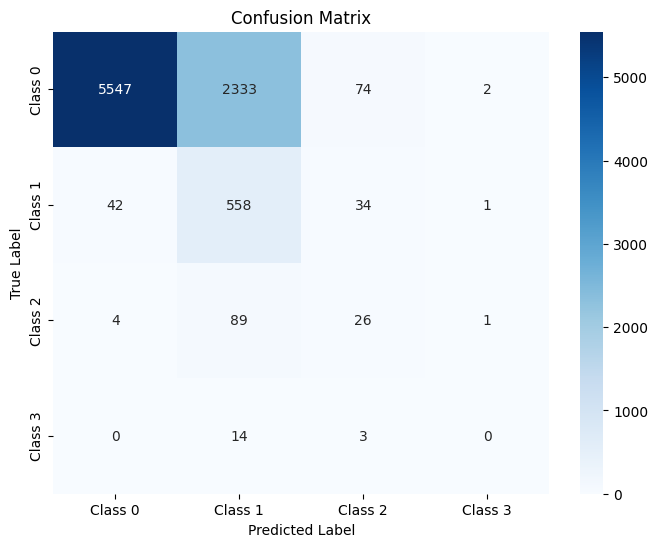

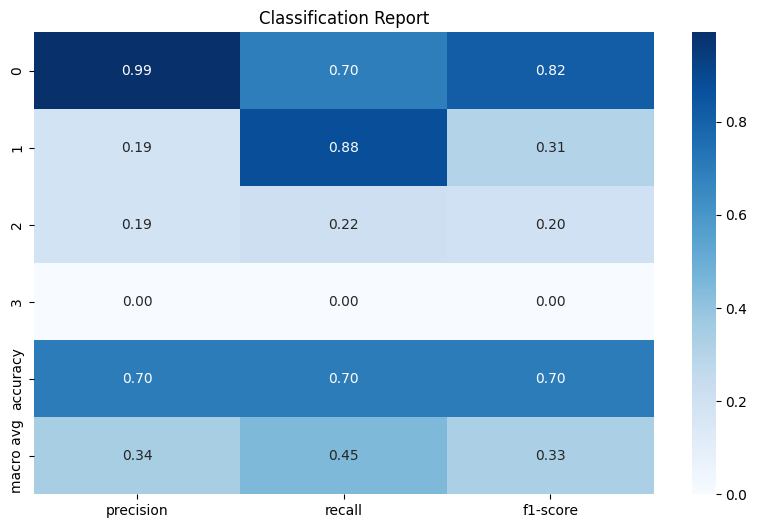

In [ ]:
import torch
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 저장된 최적 모델 불러오기
def load_best_model(model, model_path='best_model_with_manual_weights.pth'):
    model.load_state_dict(torch.load(model_path, weights_only=True))
    return model

# 모델 평가 함수 (배치 단위 처리)
def evaluate_model(model, X_test, y_test, batch_size=64):
    model.eval()  # 평가 모드로 전환
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    # DataLoader로 배치 단위로 테스트 데이터 처리
    test_dataset = TensorDataset(torch.Tensor(X_test), torch.Tensor(y_test).long())
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    all_preds = []
    all_labels = []

    with torch.no_grad():  # 평가 시에는 역전파가 필요 없으므로 no_grad 사용
        for batch_X, batch_y in test_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)

            outputs = model(batch_X)
            _, predicted = torch.max(outputs, 1)  # 가장 높은 값의 클래스를 예측
            all_preds.extend(predicted.cpu().numpy())  # 예측 결과 저장
            all_labels.extend(batch_y[:, -1].cpu().numpy())  # 실제 타겟 저장 (마지막 타임스텝)

    return all_labels, all_preds

# Confusion Matrix 시각화 함수
def plot_confusion_matrix(y_true, y_pred, class_names):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

# Classification Report 시각화 함수
def plot_classification_report(y_true, y_pred):
    report = classification_report(y_true, y_pred, output_dict=True)
    report_df = pd.DataFrame(report).transpose()

    plt.figure(figsize=(10, 6))
    sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap="Blues", fmt=".2f")
    plt.title("Classification Report")
    plt.show()

# 모델 생성 및 평가 호출
model = create_model(input_dim=len(features))  # 모델 정의
model = load_best_model(model, model_path='best_model_with_manual_weights.pth')  # 최적 모델 불러오기

# 평가 실행
all_labels, all_preds = evaluate_model(model, X_test, y_test, batch_size=64)

# 시각화
class_names = ['Class 0', 'Class 1', 'Class 2', 'Class 3']

# Confusion Matrix 시각화
plot_confusion_matrix(all_labels, all_preds, class_names)

# Classification Report 시각화
plot_classification_report(all_labels, all_preds)

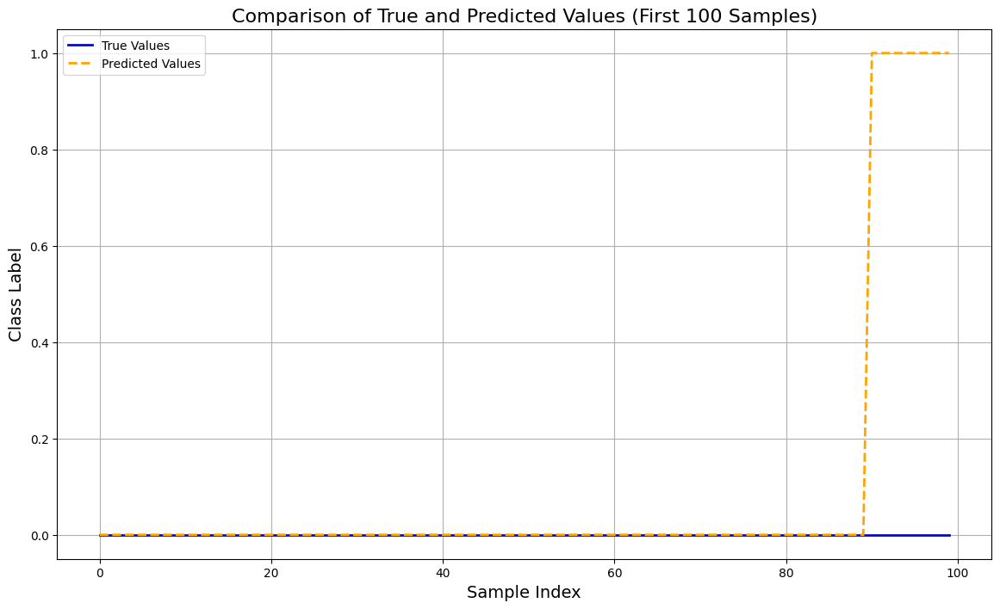

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# 실제값과 예측값을 라인 그래프로 시각화하는 함수
def plot_predictions(y_true, y_pred, num_samples=100):
    plt.figure(figsize=(14, 8))

    # 실제값 그리기
    plt.plot(y_true[:num_samples], label="True Values", color='blue', linewidth=2)

    # 예측값 그리기
    plt.plot(y_pred[:num_samples], label="Predicted Values", color='orange', linestyle='--', linewidth=2)

    # 그래프 꾸미기
    plt.title(f"Comparison of True and Predicted Values (First {num_samples} Samples)", fontsize=16)
    plt.xlabel("Sample Index", fontsize=14)
    plt.ylabel("Class Label", fontsize=14)
    plt.legend()
    plt.grid(True)
    plt.show()

# 시각화를 위한 샘플 수 설정
num_samples_to_plot = 100

# 실제값과 예측값을 그래프로 시각화
plot_predictions(all_labels, all_preds, num_samples=num_samples_to_plot)

### quantile prediction 1

In [14]:
# 서울 데이터를 불러오기
file_path = './data/preprocessed_df_108_filled.csv'
df_seoul = pd.read_csv(file_path)

# RN 컬럼의 99% 분위수 계산
rn_90_quantile = df_seoul['RN'].quantile(0.99)

# 결과 출력
print(f"서울 지역의 강수량(RN) 99% 분위수: {rn_90_quantile:.4f}")

서울 지역의 강수량(RN) 99% 분위수: 4.5000


##### 데이터 불러오기

In [16]:
# 지역별 파일
file_paths = {
    'Dongducheon': './data/preprocessed_df_98_filled.csv',
    'Seoul': './data/preprocessed_df_108_filled.csv',
    'Incheon': './data/preprocessed_df_112_filled.csv',
    'Suwon': './data/preprocessed_df_119_filled.csv',
    'Yangpyeong': './data/preprocessed_df_202_filled.csv',
}

meta_data = {
    'TM': '관측시간(KST)',
    'TA': '기온(C)',
    'WS': '풍속(m/s)',
    'HM': '상대습도(%)',
    'PV': '수증기압(hPa)',
    'TD': '이슬점온도(C)',
    'PA': '현지기압(hPa)',
    'CA_MID': '중하층운량(1/10)',
    'RN': '강수량(mm)'
}

features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'RN']  # 기상 변수
minmax_features = ['CA_MID', 'RN']  # MinMaxScaler 적용할 피처들
remaining_features = list(set(features) - set(minmax_features))  # StandardScaler 적용할 피처들

# 각 지역의 데이터를 저장할 딕셔너리
region_dfs = {}
original_data = {}
scaled_data = []
scalers = {}

# 각 지역의 데이터를 읽고 처리
for region, file_path in file_paths.items():
    # 파일에서 데이터 읽기
    df = pd.read_csv(file_path)

    df['TM'] = pd.to_datetime(df['TM'], format='%Y-%m-%d %H:%M:%S')
    df = df[(df['TM'].dt.year == 2022) | (df['TM'].dt.year == 2023) | (df['TM'].dt.year == 2024)]

    # 스케일링 전 데이터를 저장
    original_data[region] = df[features + ['TM']].copy()

    # 지정된 피처만 선택
    region_data = df[features].copy()
    region_data['TM'] = df['TM']  # 시간 데이터 유지

    # MinMaxScaler는 'CA_MID', 'RN' 피처에 적용
    scaler_minmax = MinMaxScaler()
    region_data[minmax_features] = scaler_minmax.fit_transform(region_data[minmax_features])

    # StandardScaler는 나머지 피처에 적용
    scaler_standard = StandardScaler()
    region_data[remaining_features] = scaler_standard.fit_transform(region_data[remaining_features])

    # 스케일링된 데이터를 다시 저장
    region_dfs[region] = region_data  # 스케일링된 데이터 저장
    scaled_data.append(region_data)   # 각 지역의 스케일링된 데이터를 리스트에 추가
    scalers[region] = {'minmax': scaler_minmax, 'standard': scaler_standard}  # 각 스케일러 저장

# 스케일링된 데이터를 3차원으로 스택 (num_samples, num_features, num_regions)
scaled_data = np.stack(scaled_data, axis=-1)

# 서울 데이터를 기준으로 시각화
df_original = original_data['Seoul']  # 스케일링 전 데이터
df_scaled = region_dfs['Seoul']       # 스케일링 후 데이터
timestamp_1h = df_original['TM']

In [17]:
seq_length = 28

def sliding_windows(data_X, data_y, seq_length):
    x = []
    y = []
    for i in range(len(data_X) - seq_length):
        _x = data_X[i:(i + seq_length)]
        _y = data_y[i + seq_length]
        x.append(_x)
        y.append(_y)
    return np.array(x, dtype=np.float32), np.array(y, dtype=np.float32)

In [18]:
# 2024년을 기준으로 데이터를 분리하기 위한 마스크 생성
train_mask = df['TM'] < '2024-01-01'
test_mask = df['TM'] >= '2024-01-01'

# X_scaled와 y_scaled로 나누기 (타겟은 강수량)
X_scaled = scaled_data[:, :-1, :]  # 입력 변수 (시간은 제외)
y_scaled = scaled_data[:, -2, :]  # 타겟 변수 (강수량)

# 먼저 train/test 데이터를 슬라이딩 윈도우 전에 나눔
X_train = X_scaled[train_mask]
y_train = y_scaled[train_mask]

X_test = X_scaled[test_mask]
y_test = y_scaled[test_mask]

# 슬라이딩 윈도우 적용 (train/test 각각에 대해)
trainX, trainY = sliding_windows(X_train, y_train, seq_length)
testX, testY = sliding_windows(X_test, y_test, seq_length)

# Train/Test 데이터를 Torch Tensor로 변환
trainX = torch.Tensor(trainX)
trainY = torch.Tensor(trainY)

testX = torch.Tensor(testX)
testY = torch.Tensor(testY)

# 데이터 크기 확인
print("Training Data X Shape:", trainX.shape)
print("Training Data Y Shape:", trainY.shape)
print("Test Data X Shape:", testX.shape)
print("Test Data Y Shape:", testY.shape)

Training Data X Shape: torch.Size([17492, 28, 8, 5])
Training Data Y Shape: torch.Size([17492, 5])
Test Data X Shape: torch.Size([5829, 28, 8, 5])
Test Data Y Shape: torch.Size([5829, 5])


In [19]:
# TensorDataset 생성
train_dataset = TensorDataset(trainX, trainY)
test_dataset = TensorDataset(testX, testY)

# DataLoader를 사용하여 배치 사이즈 설정
batch_size = 64  # 미니배치 사이즈를 설정
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

##### 훈련

In [20]:
best_loss_quantile = float('inf')
best_model_quantile = None

In [27]:
# Hyperparameters
num_epochs = 1000
learning_rate = 0.001
input_size = trainX.shape[3] * len(features)  # 입력 피처 크기 (8 * 5)
embed_size = 32
num_layers = 3
output_size = trainY.shape[1]  # 타겟 크기 (5)
quantile = 0.9

In [23]:
# GPU 사용 가능하면 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Training on device: {device}")

Training on device: cuda


In [28]:
# Pinball Loss 함수 정의
def pinball_loss(y_true, y_pred, quantile):
    errors = y_true - y_pred
    loss = torch.max((quantile - 1) * errors, quantile * errors)
    return loss.mean()

# 모델 및 손실 함수, 최적화 기법 설정
model = Transformer(input_size, embed_size, output_size, num_layers).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for batch_X, batch_Y in train_loader:
        batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)

        # Forward pass
        outputs = model(batch_X)  # (batch_size, num_regions)
        outputs = outputs[:, -1, :]

        # Pinball Loss 계산 (분위수 예측)
        loss = 0
        for region_idx in range(output_size):  # 각 지역에 대해 개별적으로 Pinball Loss 계산
            loss += pinball_loss(batch_Y[:, region_idx], outputs[:, region_idx], quantile)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    # 매 50 에포크마다 학습 손실 출력 및 평가
    if epoch % 50 == 0:
        avg_train_loss = running_loss / len(train_loader)
        print(f"Epoch [{epoch+1}/{num_epochs}], Training Loss: {avg_train_loss:.4f}")

        # 검증 단계에서 예측 수행 및 결과 저장
        model.eval()
        val_loss = 0.0
        predicted_values = []
        true_vals = []

        with torch.no_grad():
            for batch_X, batch_Y in test_loader:
                batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)
                outputs = model(batch_X)
                outputs = outputs[:, -1, :]  # 마지막 타임스텝만 사용

                # Pinball Loss 계산 (검증 데이터에 대해)
                loss = 0
                for region_idx in range(output_size):
                    loss += pinball_loss(batch_Y[:, region_idx], outputs[:, region_idx], quantile)
                val_loss += loss.item()

                predicted_values.extend(outputs.cpu().numpy())
                true_vals.extend(batch_Y.cpu().numpy())

        # 예측값과 실제값 저장
        predicted_values = np.array(predicted_values)
        true_values = np.array(true_vals)

        avg_val_loss = val_loss / len(test_loader)

        print(f"Validation Loss: {avg_val_loss:.4f}")

        # 최적의 모델 저장
        if avg_val_loss < best_loss_quantile:
            best_loss_quantile = avg_val_loss
            best_model_quantile = model.state_dict()

            # 최적의 모델 저장 메시지 출력
            print(f"New best model found with Train Loss: {loss:.4f}, Validation Loss: {best_loss_quantile:.4f}")

Epoch [1/1000], Training Loss: 0.1011
Validation Loss: 0.0345
Epoch [51/1000], Training Loss: 0.0076
Validation Loss: 0.0076
Epoch [101/1000], Training Loss: 0.0064
Validation Loss: 0.0078
Epoch [151/1000], Training Loss: 0.0064
Validation Loss: 0.0076
Epoch [201/1000], Training Loss: 0.0055
Validation Loss: 0.0071
Epoch [251/1000], Training Loss: 0.0051
Validation Loss: 0.0073


KeyboardInterrupt: 

In [29]:
# 최적의 모델 저장
best_model_path = './param/best_model_quantile.pth'
torch.save(best_model_quantile, best_model_path)
print(f"Best model saved at {best_model_path}")

Best model saved at ./param/best_model_quantile.pth


##### 확인

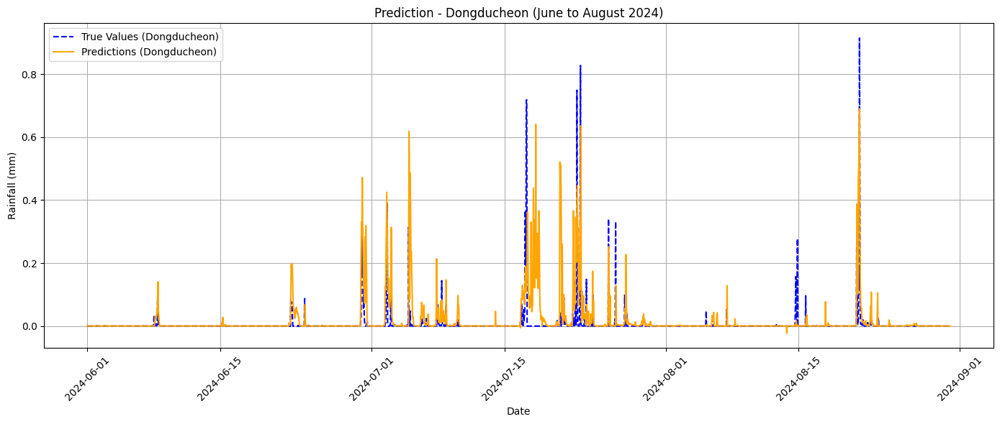

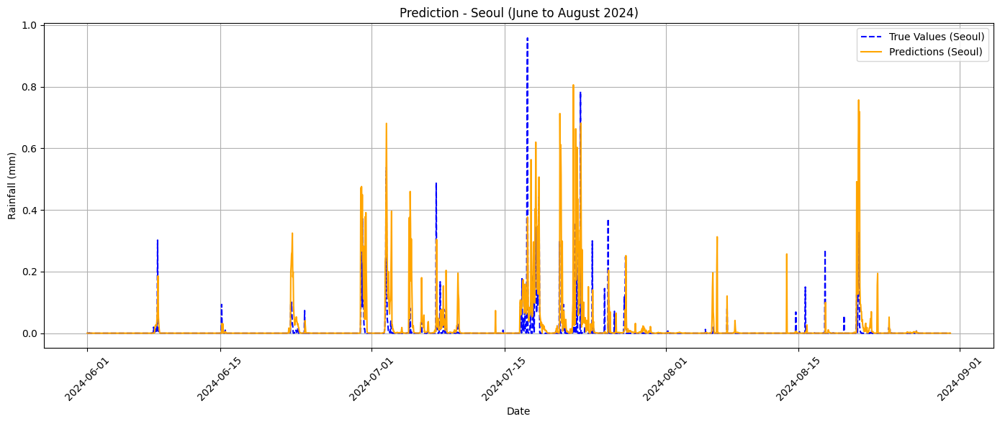

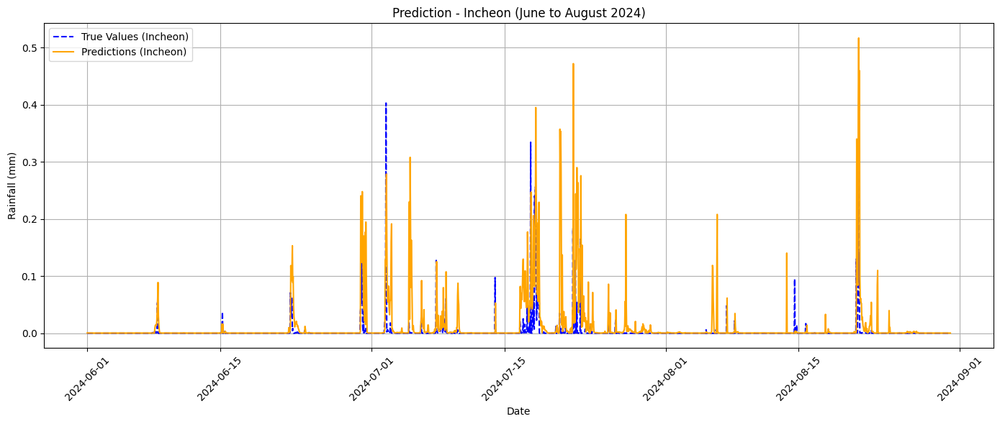

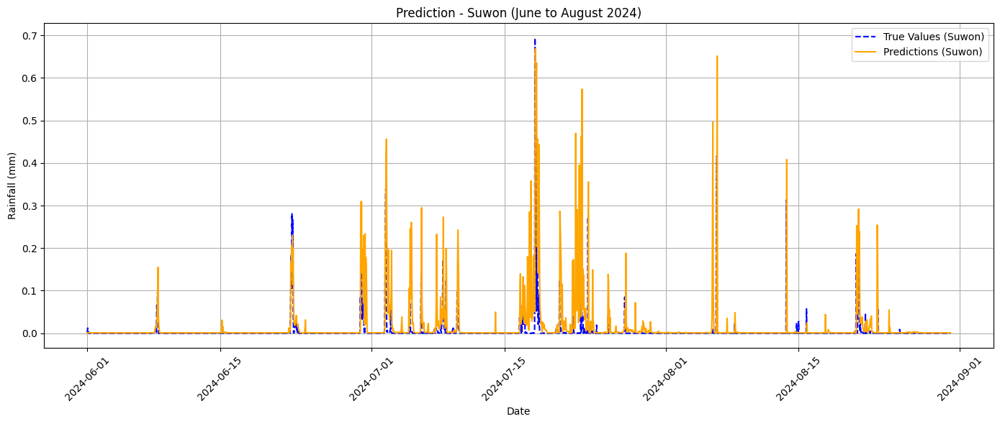

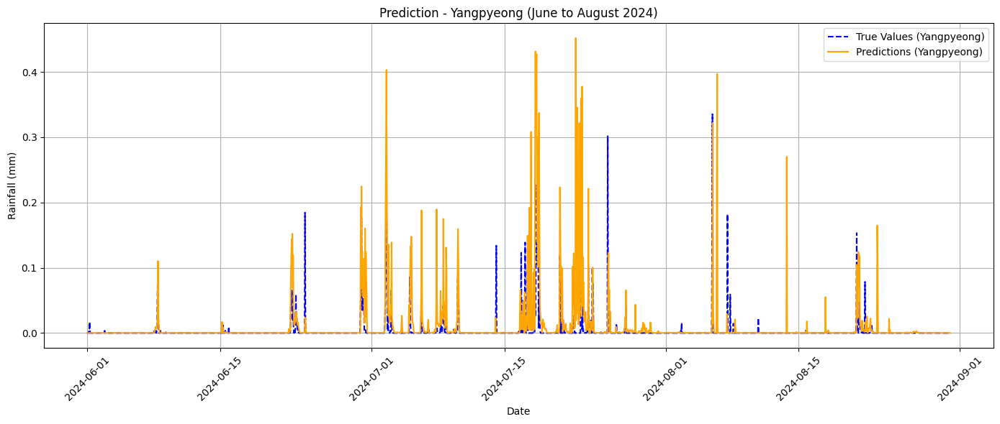

MAE: 0.0078, RMSE: 0.0367, R2 Score: -1.2824


In [30]:
# 지역명 추출
region_names = list(file_paths.keys())
num_regions = len(region_names)

# 지역별로 그래프 그리기
for region_idx in range(num_regions):
    plt.figure(figsize=(14, 6))

    # 각 지역별 전체 기간에 해당하는 데이터 필터링
    region_df = region_dfs[region_names[region_idx]]

    # 전체 기간의 타임스탬프를 가져옴
    region_dates = timestamp_1h[-len(true_values):]

    # 2024년 6월부터 8월까지의 데이터 필터링
    mask = (region_dates >= pd.Timestamp('2024-06-01')) & (region_dates <= pd.Timestamp('2024-08-31'))
    region_dates_filtered = region_dates[mask]

    # 해당 기간의 실제 값과 예측 값
    region_true_values = true_values[mask, region_idx]  # 해당 기간의 실제 값
    region_predictions = predicted_values[mask, region_idx]  # 해당 기간의 예측 값

    # 예측 및 실제 값 시각화 (2024년 6~8월)
    plt.plot(region_dates_filtered, region_true_values, label=f'True Values ({region_names[region_idx]})', color='blue', linestyle='dashed')
    plt.plot(region_dates_filtered, region_predictions, label=f'Predictions ({region_names[region_idx]})', color='orange')

    # 그래프 제목과 축 설정 (지역명을 포함)
    plt.title(f'Prediction - {region_names[region_idx]} (June to August 2024)')
    plt.xlabel('Date')  # x축을 날짜로 설정
    plt.ylabel('Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)  # x축 레이블을 45도 회전
    plt.tight_layout()
    plt.show()

# 모델 성능 평가 출력 (전체 기간을 평가)
true_values_flat = true_values.flatten()
predicted_values_flat = predicted_values.flatten()

mae = mean_absolute_error(true_values_flat, predicted_values_flat)
rmse = np.sqrt(mean_squared_error(true_values_flat, predicted_values_flat))
r2 = r2_score(true_values_flat, predicted_values_flat)

print(f"MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

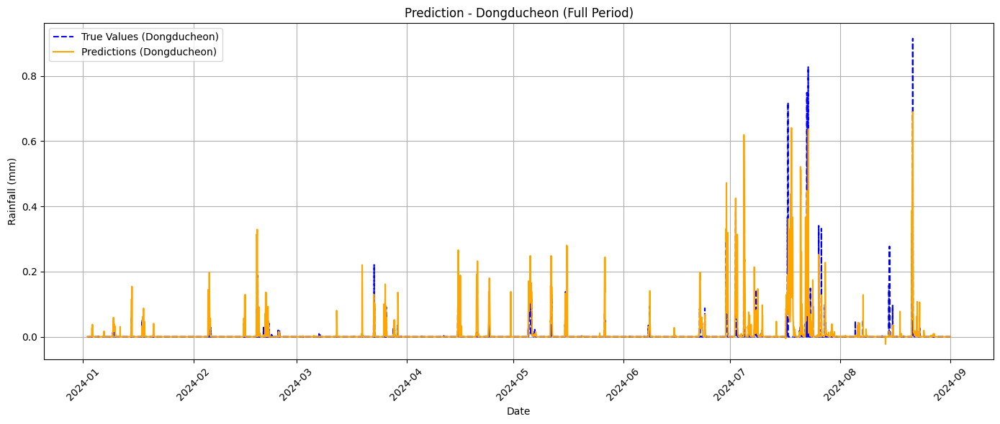

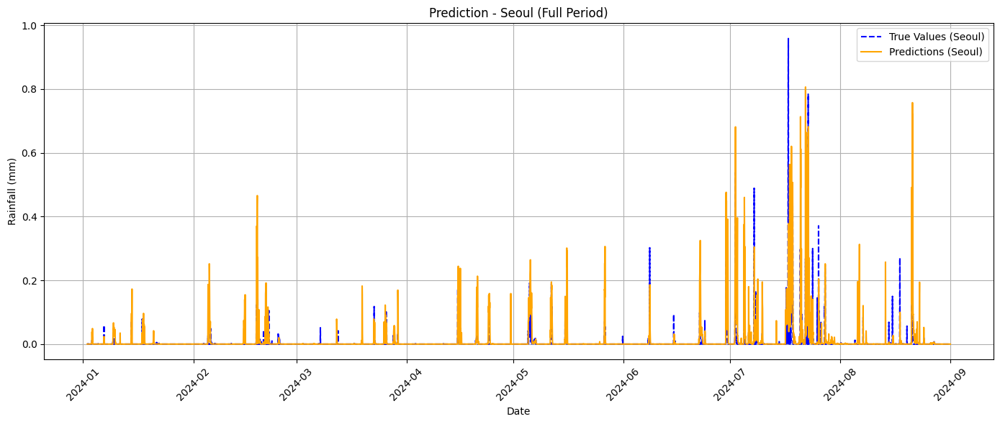

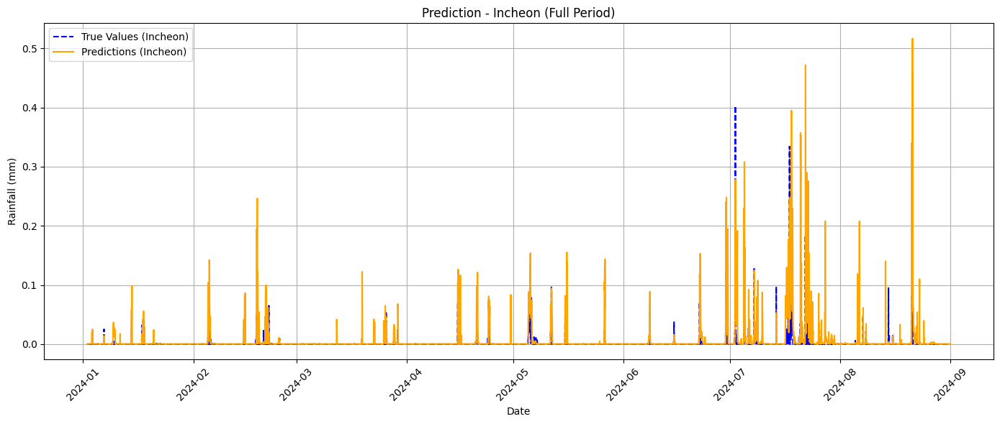

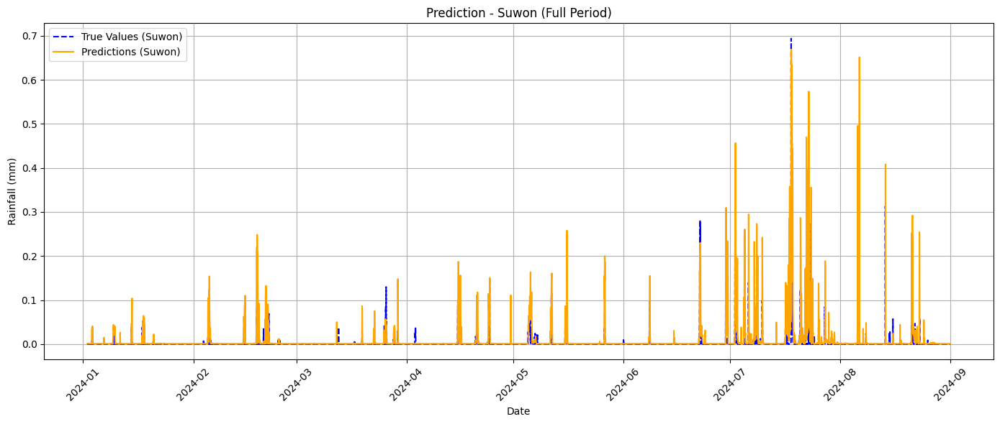

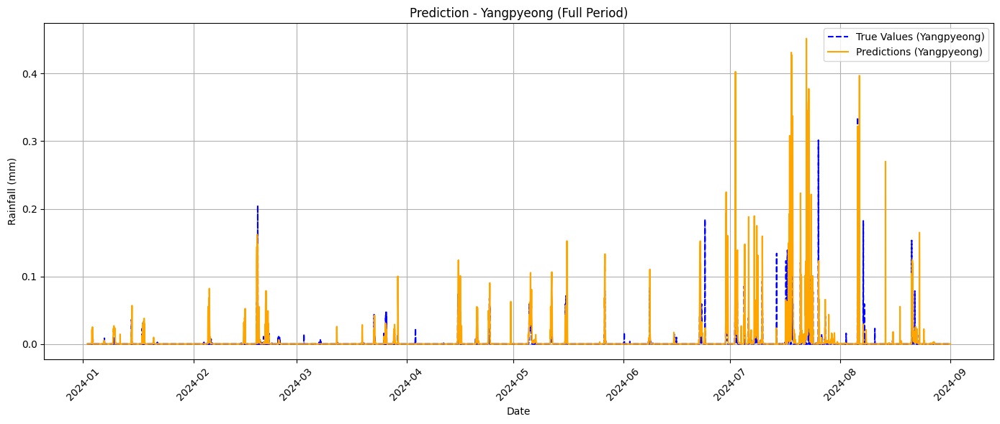

MAE: 0.0078, RMSE: 0.0367, R2 Score: -1.2824


In [31]:
# 지역명 추출
region_names = list(file_paths.keys())
num_regions = len(region_names)

# 지역별로 그래프 그리기 (전체 기간에 대해)
for region_idx in range(num_regions):
    plt.figure(figsize=(14, 6))

    # 각 지역별 전체 기간에 해당하는 데이터 필터링
    region_df = region_dfs[region_names[region_idx]]

    # 전체 기간의 타임스탬프를 가져옴
    region_dates = timestamp_1h[-len(true_values):]

    # 전체 기간의 실제 값과 예측 값
    region_true_values = true_values[:, region_idx]  # 전체 기간의 실제 값
    region_predictions = predicted_values[:, region_idx]  # 전체 기간의 예측 값

    # 예측 및 실제 값 시각화 (전체 기간)
    plt.plot(region_dates, region_true_values, label=f'True Values ({region_names[region_idx]})', color='blue', linestyle='dashed')
    plt.plot(region_dates, region_predictions, label=f'Predictions ({region_names[region_idx]})', color='orange')

    # 그래프 제목과 축 설정 (지역명을 포함)
    plt.title(f'Prediction - {region_names[region_idx]} (Full Period)')
    plt.xlabel('Date')  # x축을 날짜로 설정
    plt.ylabel('Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)  # x축 레이블을 45도 회전
    plt.tight_layout()
    plt.show()

# 모델 성능 평가 출력 (전체 기간을 평가)
true_values_flat = true_values.flatten()
predicted_values_flat = predicted_values.flatten()

mae = mean_absolute_error(true_values_flat, predicted_values_flat)
rmse = np.sqrt(mean_squared_error(true_values_flat, predicted_values_flat))
r2 = r2_score(true_values_flat, predicted_values_flat)

print(f"MAE: {mae:.4f}, RMSE: {rmse:.4f}, R2 Score: {r2:.4f}")

### quantile prediction 2

##### 데이터 불러오기

In [ ]:
# 지역별 파일
file_paths = {
    'Dongducheon': './data/preprocessed_df_98_filled.csv',
    'Seoul': './data/preprocessed_df_108_filled.csv',
    'Incheon': './data/preprocessed_df_112_filled.csv',
    'Suwon': './data/preprocessed_df_119_filled.csv',
    'Yangpyeong': './data/preprocessed_df_202_filled.csv',
}

meta_data = {
    'TM': '관측시간(KST)',
    'TA': '기온(C)',
    'WS': '풍속(m/s)',
    'HM': '상대습도(%)',
    'PV': '수증기압(hPa)',
    'TD': '이슬점온도(C)',
    'PA': '현지기압(hPa)',
    'CA_MID': '중하층운량(1/10)',
    'RN': '강수량(mm)'
}

features = ['TA', 'WS', 'HM', 'PV', 'TD', 'PA', 'CA_MID', 'RN']  # 기상 변수
minmax_features = ['CA_MID', 'RN']  # MinMaxScaler 적용할 피처들
remaining_features = list(set(features) - set(minmax_features))  # StandardScaler 적용할 피처들

# 각 지역의 데이터를 저장할 딕셔너리
region_dfs = {}
original_data = {}
scaled_data = []
scalers = {}

# 각 지역의 데이터를 읽고 처리
for region, file_path in file_paths.items():
    # 파일에서 데이터 읽기
    df = pd.read_csv(file_path)

    df['TM'] = pd.to_datetime(df['TM'], format='%Y-%m-%d %H:%M:%S')
    df = df[(df['TM'].dt.year == 2022) | (df['TM'].dt.year == 2023) | (df['TM'].dt.year == 2024)]

    # 스케일링 전 데이터를 저장
    original_data[region] = df[features + ['TM']].copy()

    # 지정된 피처만 선택
    region_data = df[features].copy()
    region_data['TM'] = df['TM']  # 시간 데이터 유지

    # MinMaxScaler는 'CA_MID', 'RN' 피처에 적용
    scaler_minmax = MinMaxScaler()
    region_data[minmax_features] = scaler_minmax.fit_transform(region_data[minmax_features])

    # StandardScaler는 나머지 피처에 적용
    scaler_standard = StandardScaler()
    region_data[remaining_features] = scaler_standard.fit_transform(region_data[remaining_features])

    # 스케일링된 데이터를 다시 저장
    region_dfs[region] = region_data  # 스케일링된 데이터 저장
    scaled_data.append(region_data)   # 각 지역의 스케일링된 데이터를 리스트에 추가
    scalers[region] = {'minmax': scaler_minmax, 'standard': scaler_standard}  # 각 스케일러 저장

# 스케일링된 데이터를 3차원으로 스택 (num_samples, num_features, num_regions)
scaled_data = np.stack(scaled_data, axis=-1)

# 서울 데이터를 기준으로 시각화
df_original = original_data['Seoul']  # 스케일링 전 데이터
df_scaled = region_dfs['Seoul']       # 스케일링 후 데이터
timestamp_1h = df_original['TM']

In [ ]:
seq_length = 28

def sliding_windows(data_X, data_y, seq_length):
    x = []
    y = []
    for i in range(len(data_X) - seq_length):
        _x = data_X[i:(i + seq_length)]
        _y = data_y[i + seq_length]
        x.append(_x)
        y.append(_y)
    return np.array(x, dtype=np.float32), np.array(y, dtype=np.float32)

In [ ]:
# 2024년을 기준으로 데이터를 분리하기 위한 마스크 생성
train_mask = df['TM'] < '2024-01-01'
test_mask = df['TM'] >= '2024-01-01'

# X_scaled와 y_scaled로 나누기 (타겟은 강수량)
X_scaled = scaled_data[:, :-1, :]  # 입력 변수 (시간은 제외)
y_scaled = scaled_data[:, -2, :]  # 타겟 변수 (강수량)

# 먼저 train/test 데이터를 슬라이딩 윈도우 전에 나눔
X_train = X_scaled[train_mask]
y_train = y_scaled[train_mask]

X_test = X_scaled[test_mask]
y_test = y_scaled[test_mask]

# 슬라이딩 윈도우 적용 (train/test 각각에 대해)
trainX, trainY = sliding_windows(X_train, y_train, seq_length)
testX, testY = sliding_windows(X_test, y_test, seq_length)

# Train/Test 데이터를 Torch Tensor로 변환
trainX = torch.Tensor(trainX)
trainY = torch.Tensor(trainY)

testX = torch.Tensor(testX)
testY = torch.Tensor(testY)

# 데이터 크기 확인
print("Training Data X Shape:", trainX.shape)
print("Training Data Y Shape:", trainY.shape)
print("Test Data X Shape:", testX.shape)
print("Test Data Y Shape:", testY.shape)

Training Data X Shape: torch.Size([17492, 28, 8, 5])
Training Data Y Shape: torch.Size([17492, 5])
Test Data X Shape: torch.Size([5829, 28, 8, 5])
Test Data Y Shape: torch.Size([5829, 5])


In [ ]:
# TensorDataset 생성
train_dataset = TensorDataset(trainX, trainY)
test_dataset = TensorDataset(testX, testY)

# DataLoader를 사용하여 배치 사이즈 설정
batch_size = 64  # 미니배치 사이즈를 설정
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

#####훈련

In [ ]:
# Define Quantile Loss Function
class QuantileLoss(nn.Module):
    def __init__(self, quantiles):
        super(QuantileLoss, self).__init__()
        self.quantiles = quantiles

    def forward(self, preds, target):
        assert not target.requires_grad
        losses = []
        for i, q in enumerate(self.quantiles):
            errors = target - preds[:, i]
            losses.append(
                torch.max((q - 1) * errors, q * errors).unsqueeze(1)
            )
        loss = torch.mean(torch.sum(torch.cat(losses, dim=1), dim=1))
        return loss

# Define the Transformer model adjusted for quantile regression
class AttentionBlock(nn.Module):
    def __init__(self, d_model, n_heads):
        super(AttentionBlock, self).__init__()
        self.multihead_attn = nn.MultiheadAttention(embed_dim=d_model, num_heads=n_heads)
        self.layernorm1 = nn.LayerNorm(d_model)
        self.ffn = nn.Sequential(
            nn.Linear(d_model, d_model * 2),
            nn.GELU(),
            nn.Linear(d_model * 2, d_model),
        )
        self.layernorm2 = nn.LayerNorm(d_model)

    def forward(self, x):
        attn_output, _ = self.multihead_attn(x, x, x)
        x = self.layernorm1(x + attn_output)
        y = self.ffn(x)
        x = self.layernorm2(x + y)
        return x

class QuantileTransformer(nn.Module):
    def __init__(self, input_dim, emb_dim, num_heads, num_layers, quantiles):
        super(QuantileTransformer, self).__init__()
        self.input_layer = nn.Linear(input_dim, emb_dim)
        self.positional_encoding = nn.Parameter(torch.zeros(1000, emb_dim))  # Adjust max length as needed
        self.encoder_layers = nn.ModuleList([
            AttentionBlock(emb_dim, num_heads) for _ in range(num_layers)
        ])
        self.output_layer = nn.Linear(emb_dim, len(quantiles) * y.shape[1])  # Output for each quantile and region
        self.quantiles = quantiles

    def forward(self, x):
        # x shape: (batch_size, seq_length, input_dim)
        seq_length = x.size(1)
        x = self.input_layer(x)
        # Add positional encoding if needed
        x = x + self.positional_encoding[:seq_length, :]
        x = x.permute(1, 0, 2)  # Required by nn.MultiheadAttention (seq_length, batch_size, emb_dim)
        for layer in self.encoder_layers:
            x = layer(x)
        x = x[-1, :, :]  # Use the last time step's output (batch_size, emb_dim)
        x = self.output_layer(x)  # (batch_size, len(quantiles) * num_regions)
        x = x.view(-1, len(self.quantiles), y.shape[1])  # (batch_size, len(quantiles), num_regions)
        return x

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Training on device: {device}')

# Hyperparameters
input_dim = trainX.shape[2]  # Number of input features
emb_dim = 128  # Embedding dimension
num_heads = 8
num_layers = 3
quantiles = [0.1, 0.5, 0.9]
learning_rate = 0.001
num_epochs = 20

# Initialize model, loss function, optimizer
model = QuantileTransformer(input_dim, emb_dim, num_heads, num_layers, quantiles).to(device)
criterion = QuantileLoss(quantiles)
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for batch_X, batch_Y in train_loader:
        batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)
        optimizer.zero_grad()

        # Forward pass
        outputs = model(batch_X)  # outputs shape: (batch_size, len(quantiles), num_regions)

        # Compute loss
        loss = criterion(outputs, batch_Y)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    # Validation
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch_X, batch_Y in test_loader:
            batch_X, batch_Y = batch_X.to(device), batch_Y.to(device)

            outputs = model(batch_X)
            loss = criterion(outputs, batch_Y)
            val_loss += loss.item()

    # Print losses
    print(f'Epoch [{epoch+1}/{num_epochs}], Training Loss: {running_loss/len(train_loader):.4f}, Validation Loss: {val_loss/len(test_loader):.4f}')


Training on device: cuda
Epoch [1/20], Training Loss: 0.0313, Validation Loss: 0.0206
Epoch [2/20], Training Loss: 0.0189, Validation Loss: 0.0168
Epoch [3/20], Training Loss: 0.0168, Validation Loss: 0.0142
Epoch [4/20], Training Loss: 0.0139, Validation Loss: 0.0134
Epoch [5/20], Training Loss: 0.0123, Validation Loss: 0.0097
Epoch [6/20], Training Loss: 0.0107, Validation Loss: 0.0109
Epoch [7/20], Training Loss: 0.0100, Validation Loss: 0.0112
Epoch [8/20], Training Loss: 0.0095, Validation Loss: 0.0097
Epoch [9/20], Training Loss: 0.0085, Validation Loss: 0.0114
Epoch [10/20], Training Loss: 0.0078, Validation Loss: 0.0106
Epoch [11/20], Training Loss: 0.0078, Validation Loss: 0.0070
Epoch [12/20], Training Loss: 0.0077, Validation Loss: 0.0082
Epoch [13/20], Training Loss: 0.0068, Validation Loss: 0.0083
Epoch [14/20], Training Loss: 0.0066, Validation Loss: 0.0072
Epoch [15/20], Training Loss: 0.0064, Validation Loss: 0.0068
Epoch [16/20], Training Loss: 0.0062, Validation Loss:

##### 평가

Evaluation Metrics:
Region: Dongducheon
MAE: 0.2119
RMSE: 1.3696
R² Score: 0.0680
-------------------
Region: Seoul
MAE: 0.2544
RMSE: 1.2594
R² Score: 0.1213
-------------------
Region: Incheon
MAE: 0.2930
RMSE: 1.0882
R² Score: 0.0579
-------------------
Region: Suwon
MAE: 0.6450
RMSE: 1.2865
R² Score: 0.0243
-------------------
Region: Yangpyeong
MAE: 0.2356
RMSE: 1.0837
R² Score: 0.1770
-------------------
Average Metrics Across All Regions:
Average MAE: 0.3280
Average RMSE: 1.2175
Average R² Score: 0.0897


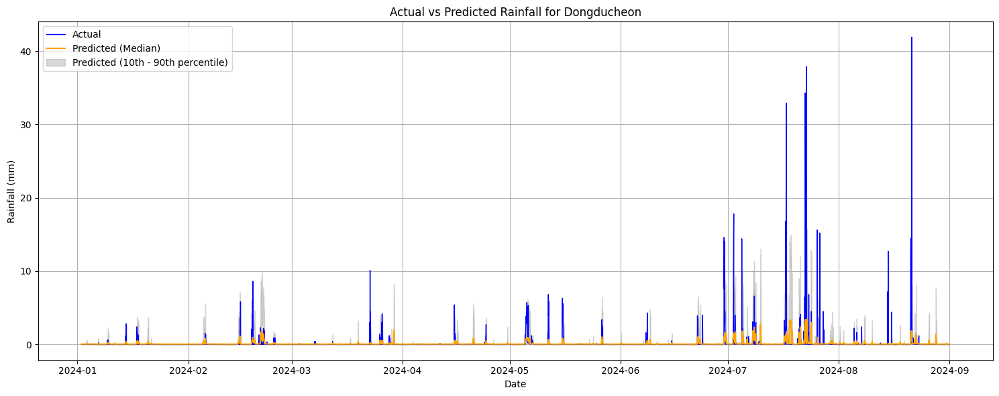

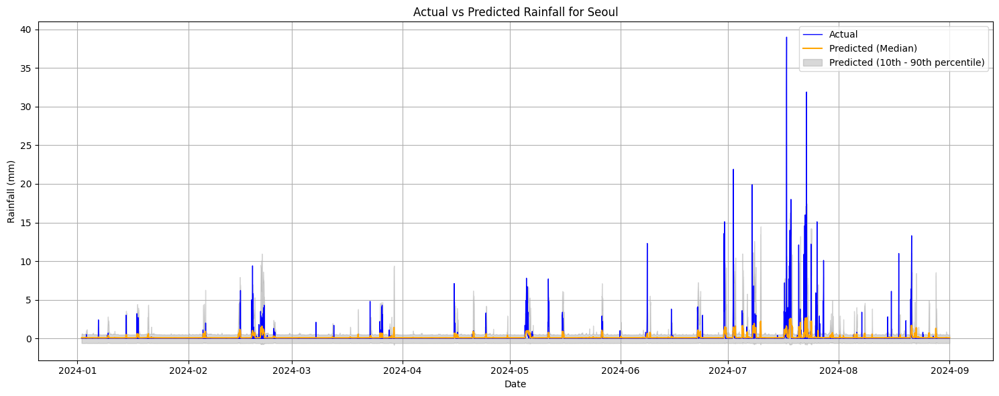

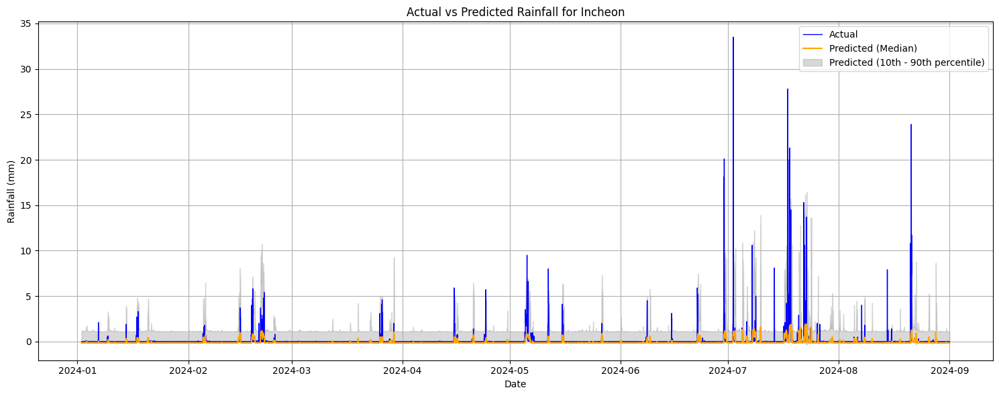

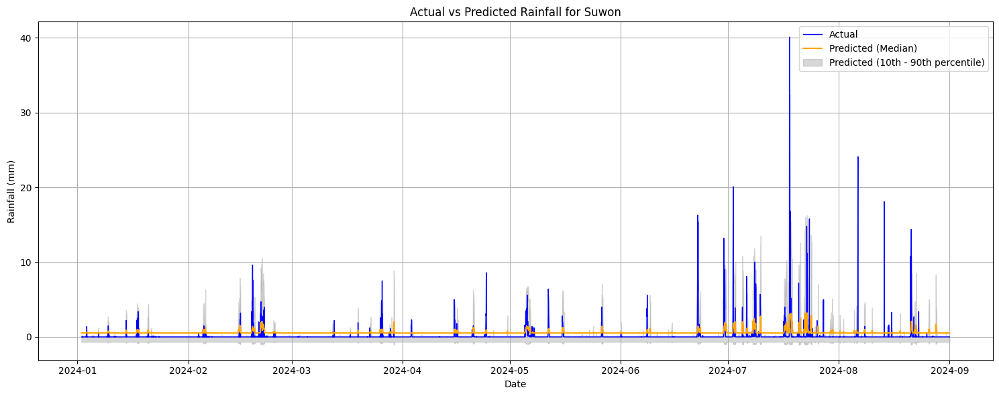

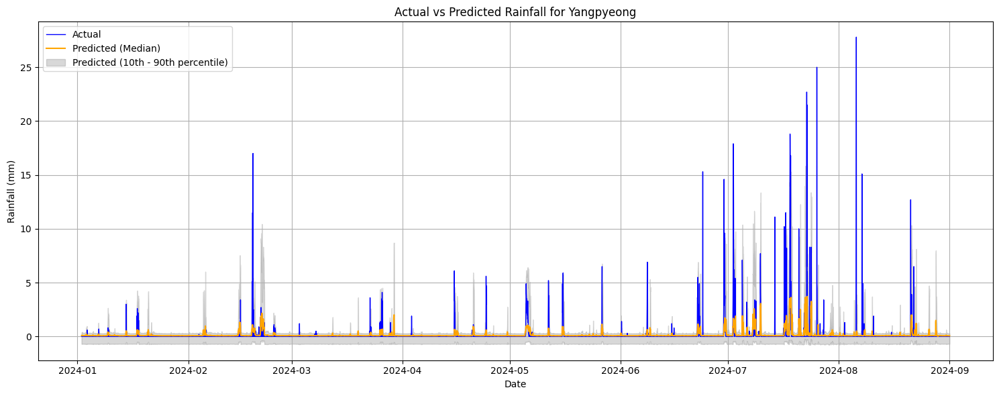

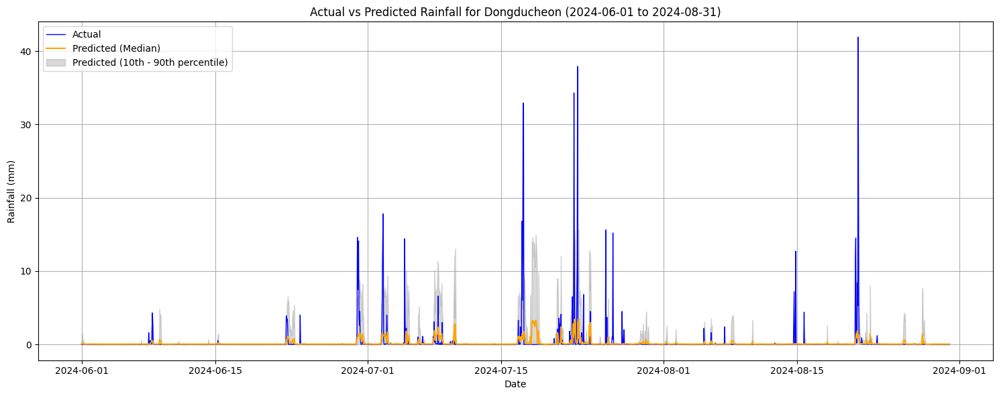

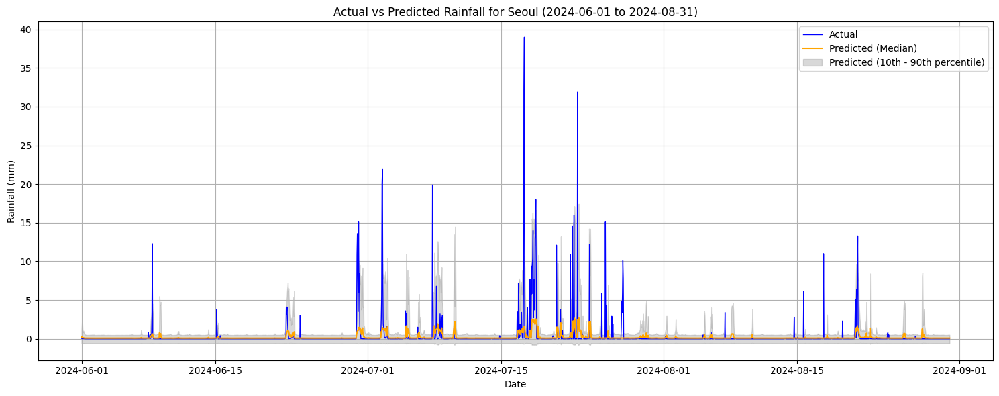

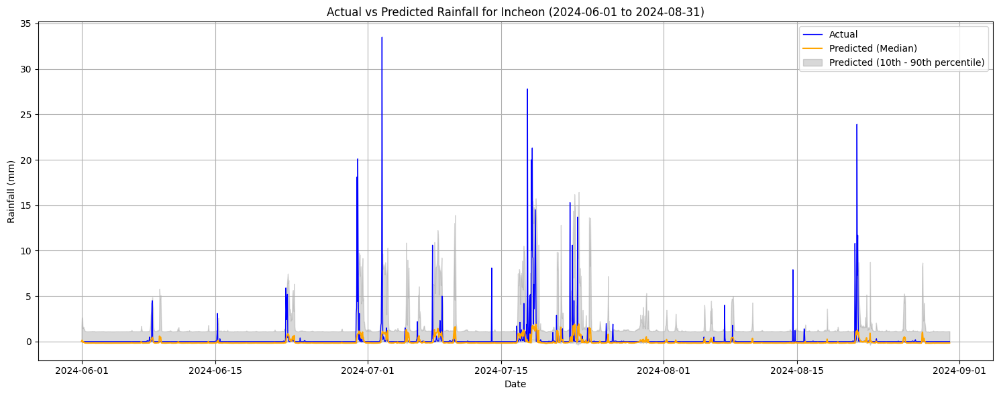

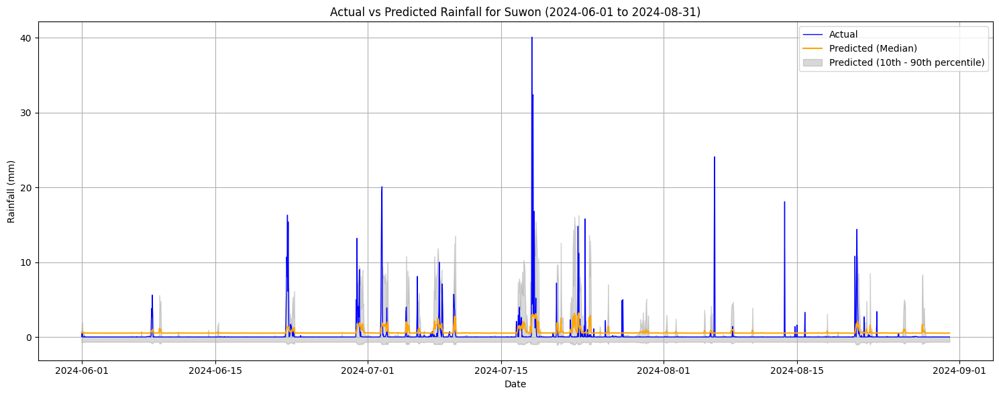

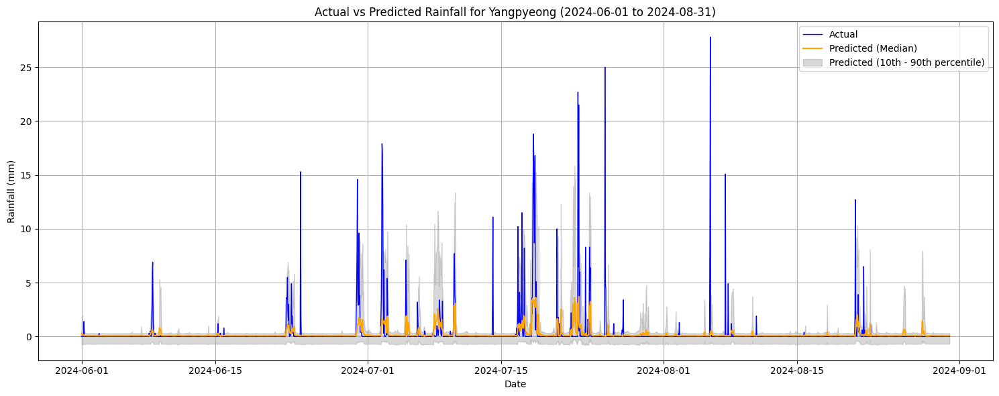

In [ ]:
# Set the model to evaluation mode
model.eval()

# Initialize lists to store predictions and actual values
all_predictions = []
all_actuals = []

with torch.no_grad():
    for batch_X, batch_Y in test_loader:
        batch_X = batch_X.to(device)
        batch_size = batch_X.size(0)

        # Forward pass
        outputs = model(batch_X)  # Shape: (batch_size, len(quantiles), num_regions)

        # Collect predictions and actual values
        all_predictions.append(outputs.cpu())
        all_actuals.append(batch_Y)

# Concatenate all batches
predictions = torch.cat(all_predictions, dim=0)  # Shape: (num_samples, len(quantiles), num_regions)
actuals = torch.cat(all_actuals, dim=0)          # Shape: (num_samples, num_regions)

# Convert tensors to numpy arrays
predictions_np = predictions.numpy()
actuals_np = actuals.numpy()

# Initialize dictionaries to store inverse-transformed data
inverse_predictions = {}
inverse_actuals = {}

# For each region, inverse transform the data
regions = list(file_paths.keys())
num_regions = len(regions)
quantiles = [0.1, 0.5, 0.9]

for idx, region in enumerate(regions):
    # Get the scaler for the 'RN' feature for this region
    scaler = scalers[region]['minmax_RN']

    # Extract predictions and actuals for this region
    pred_region = predictions_np[:, :, idx]  # Shape: (num_samples, len(quantiles))
    actual_region = actuals_np[:, idx]       # Shape: (num_samples,)

    # Since MinMaxScaler expects 2D input, reshape data
    pred_region_flat = pred_region.reshape(-1, 1)  # Shape: (num_samples * len(quantiles), 1)
    actual_region_flat = actual_region.reshape(-1, 1)  # Shape: (num_samples, 1)

    # Inverse transform
    pred_region_inv = scaler.inverse_transform(pred_region_flat)
    actual_region_inv = scaler.inverse_transform(actual_region_flat)

    # Reshape back to original shape
    pred_region_inv = pred_region_inv.reshape(-1, len(quantiles))
    actual_region_inv = actual_region_inv.flatten()

    # Store in dictionaries
    inverse_predictions[region] = pred_region_inv
    inverse_actuals[region] = actual_region_inv

# Compute evaluation metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Initialize lists to store metrics
mae_list = []
rmse_list = []
r2_list = []

print("Evaluation Metrics:")
print("===================")

for region in regions:
    # Get inverse-transformed predictions and actuals
    pred_region = inverse_predictions[region][:, 1]  # Median quantile (0.5)
    actual_region = inverse_actuals[region]

    # Compute metrics
    mae = mean_absolute_error(actual_region, pred_region)
    rmse = np.sqrt(mean_squared_error(actual_region, pred_region))
    r2 = r2_score(actual_region, pred_region)

    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)

    # Print metrics for the region
    print(f"Region: {region}")
    print(f"MAE: {mae:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"R² Score: {r2:.4f}")
    print("-------------------")

# Optionally, compute average metrics across all regions
avg_mae = np.mean(mae_list)
avg_rmse = np.mean(rmse_list)
avg_r2 = np.mean(r2_list)

print("Average Metrics Across All Regions:")
print(f"Average MAE: {avg_mae:.4f}")
print(f"Average RMSE: {avg_rmse:.4f}")
print(f"Average R² Score: {avg_r2:.4f}")

# Get the timestamps corresponding to the test set
test_timestamps = merged_data['TM'].values[-len(predictions):]

# Convert timestamps to datetime objects
test_dates = pd.to_datetime(test_timestamps)

# For each region, plot the actual vs. predicted rainfall
for region in regions:
    # Get data for the region
    actual_region = inverse_actuals[region]
    pred_region = inverse_predictions[region]

    # Plot the actual rainfall
    plt.figure(figsize=(15, 6))
    plt.plot(test_dates, actual_region, label='Actual', color='blue', linewidth=1)

    # Plot the predicted quantiles
    plt.plot(test_dates, pred_region[:, 1], label='Predicted (Median)', color='orange', linewidth=1.5)
    plt.fill_between(test_dates, pred_region[:, 0], pred_region[:, 2], color='gray', alpha=0.3, label='Predicted (10th - 90th percentile)')

    # Formatting
    plt.title(f'Actual vs Predicted Rainfall for {region}')
    plt.xlabel('Date')
    plt.ylabel('Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Optional: Focus on a specific time period
start_date = '2024-06-01'
end_date = '2024-08-31'

# Convert to numpy datetime64
start_date_np = np.datetime64(start_date)
end_date_np = np.datetime64(end_date)

# Create a mask for the period
mask = (test_timestamps >= start_date_np) & (test_timestamps <= end_date_np)

# For each region, plot the actual vs. predicted rainfall for the period
for region in regions:
    # Get data for the region within the period
    actual_region = inverse_actuals[region][mask]
    pred_region = inverse_predictions[region][mask]
    dates = test_dates[mask]

    # Plot the actual rainfall
    plt.figure(figsize=(15, 6))
    plt.plot(dates, actual_region, label='Actual', color='blue', linewidth=1)

    # Plot the predicted quantiles
    plt.plot(dates, pred_region[:, 1], label='Predicted (Median)', color='orange', linewidth=1.5)
    plt.fill_between(dates, pred_region[:, 0], pred_region[:, 2], color='gray', alpha=0.3, label='Predicted (10th - 90th percentile)')

    # Formatting
    plt.title(f'Actual vs Predicted Rainfall for {region} ({start_date} to {end_date})')
    plt.xlabel('Date')
    plt.ylabel('Rainfall (mm)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
